In [139]:
pip install opencv-python

^C
Note: you may need to restart the kernel to use updated packages.


In [1]:
import cv2
import numpy as np
from skimage import io, morphology, measure
from skimage.io import imread
import os
from scipy.ndimage import binary_dilation, generate_binary_structure
import pandas as pd
import matplotlib.pyplot as plt
import tifffile
import matplotlib.colors as mcolors
from skimage import morphology
from scipy.interpolate import interp1d
from scipy.interpolate import UnivariateSpline
from scipy.ndimage import binary_erosion, binary_dilation, generate_binary_structure
import matplotlib.patches as mpatches
from scipy.stats import binned_statistic
from scipy.spatial import distance
from skimage.transform import resize
from PIL import Image

In [2]:
#function to load all the images in a specific folder: the two channels and the tissue masks

def load_tif_files(path):
    image = io.imread(path)
    
    return image

#function to load the dictionary of the mask

def load_mask_data(mask_path):
    mask_dict = np.load(mask_path, allow_pickle=True).item()
    outlines = mask_dict['outlines']
    #colors = mask_dict['colors']
    masks = mask_dict['masks']
    
    return masks

#function to map each nucleus ID to its pixels

def create_id_to_pixels(masks):
    unique_ids = np.unique(masks)
    return {cell_id: np.argwhere(masks == cell_id) for cell_id in unique_ids if cell_id != 0}

#function to create the cytoplasm mask

def create_cyto_mask_nocut(masks):
    dilated_nuclear_mask = np.zeros_like(masks, dtype=np.uint8)
    cyto_mask = np.zeros_like(masks)
    unique_ids = np.unique(masks)

    for cell_id in unique_ids:
        if cell_id == 0:
            continue
        nucleus_mask = masks == cell_id
        dilated_nucleus = binary_dilation(nucleus_mask, structure=generate_binary_structure(2, 2), iterations=2)
        cytoplasm_mask = dilated_nucleus & ~nucleus_mask
        cyto_mask = np.maximum(cyto_mask, cytoplasm_mask)
        dilated_nuclear_mask = np.maximum(dilated_nuclear_mask, dilated_nucleus)

    global_cyto_mask = np.zeros_like(masks, dtype=bool)
    cytoplasm_contours = np.zeros_like(masks, dtype=bool)
    id_to_pixels = {cell_id: np.argwhere(masks == cell_id) for cell_id in np.unique(masks) if cell_id != 0}

    for nucleus_id in id_to_pixels.keys():
        nucleus_mask = masks == nucleus_id
        dilated_nucleus = binary_dilation(nucleus_mask, structure=generate_binary_structure(2, 2), iterations=2)
        cytoplasm_contours |= dilated_nucleus.astype(bool)
        global_cyto_mask |= dilated_nucleus.astype(bool)

    cytoplasm_contours &= ~masks.astype(bool)
    cyto_cut_mask = cytoplasm_contours
    
    return cyto_cut_mask


def create_cyto_cut_mask(masks):
    
    dilated_nuclear_mask = np.zeros_like(masks, dtype=np.uint8)
    cyto_mask = np.zeros_like(masks)
    unique_ids = np.unique(masks)
    for cell_id in unique_ids:
        if cell_id == 0:
            continue
        nucleus_mask = masks == cell_id
        dilated_nucleus = binary_dilation(nucleus_mask, structure=generate_binary_structure(2, 2), iterations=2)
        cytoplasm_mask = dilated_nucleus & ~nucleus_mask
        cyto_mask = np.maximum(cyto_mask, cytoplasm_mask)
        dilated_nuclear_mask = np.maximum(dilated_nuclear_mask, dilated_nucleus)
    global_cyto_mask = np.zeros_like(masks, dtype=bool)
    overlap_mask = np.zeros_like(masks, dtype=bool)
    cytoplasm_contours = np.zeros_like(masks, dtype=bool)
    id_to_pixels = {cell_id: np.argwhere(masks == cell_id) for cell_id in np.unique(masks) if cell_id != 0}
    for nucleus_id in id_to_pixels.keys():
        nucleus_mask = masks == nucleus_id
        dilated_nucleus = binary_dilation(nucleus_mask, structure=generate_binary_structure(2, 2), iterations=2)
        cytoplasm_contours |= dilated_nucleus.astype(bool)
        overlap_mask |= (global_cyto_mask & dilated_nucleus.astype(bool))
        global_cyto_mask |= dilated_nucleus.astype(bool)
    cytoplasm_contours &= ~masks.astype(bool)
    cyto_cut_mask = cytoplasm_contours & ~overlap_mask
    
    return cyto_cut_mask

def create_cyto_cut_mask_modnuclcyto(masks):
    dilated_nuclear_mask = np.zeros_like(masks, dtype=np.uint8)
    cyto_mask = np.zeros_like(masks)
    unique_ids = np.unique(masks)
    for cell_id in unique_ids:
        if cell_id == 0:
            continue
        nucleus_mask = masks == cell_id
        dilated_nucleus = binary_dilation(nucleus_mask, structure=generate_binary_structure(2, 2), iterations=3)
        nucleus_gap = binary_dilation(nucleus_mask, structure=generate_binary_structure(2, 2), iterations=1)
        cytoplasm_mask = dilated_nucleus & ~nucleus_gap
        cyto_mask = np.maximum(cyto_mask, cytoplasm_mask)
        dilated_nuclear_mask = np.maximum(dilated_nuclear_mask, dilated_nucleus)
    global_cyto_mask = np.zeros_like(masks, dtype=bool)
    overlap_mask = np.zeros_like(masks, dtype=bool)
    cytoplasm_contours = np.zeros_like(masks, dtype=bool)
    id_to_pixels = {cell_id: np.argwhere(masks == cell_id) for cell_id in unique_ids if cell_id != 0}
    for nucleus_id in id_to_pixels.keys():
        nucleus_mask = masks == nucleus_id
        dilated_nucleus = binary_dilation(nucleus_mask, structure=generate_binary_structure(2, 2), iterations=3)
        cytoplasm_contours |= dilated_nucleus.astype(bool)
        overlap_mask |= (global_cyto_mask & dilated_nucleus.astype(bool))
        global_cyto_mask |= dilated_nucleus.astype(bool)
    cytoplasm_contours &= ~masks.astype(bool)
    cyto_cut_mask = cytoplasm_contours & ~overlap_mask
    return cyto_cut_mask
    
#function to calculate the log2(N/C)

def calculate_intensity_ratio_modnucl(nucleus_pixels, mod_erk, masks, cyto_cut_mask, nucleus_id):
    nucleus_mask = masks == nucleus_id

    eroded_nucleus_mask = binary_erosion(nucleus_mask, structure=generate_binary_structure(2, 2), iterations=2)

    eroded_nucleus_pixels = np.array(np.nonzero(eroded_nucleus_mask)).T
    if eroded_nucleus_pixels.size == 0:
        return np.nan
    nucleus_intensity = np.mean(mod_erk[eroded_nucleus_pixels[:, 0], eroded_nucleus_pixels[:, 1]])

    dilated_nucleus = binary_dilation(nucleus_mask, structure=generate_binary_structure(2, 2), iterations=2)
    cytoplasm_mask = dilated_nucleus & ~nucleus_mask
    refined_cytoplasm_mask = cyto_cut_mask & cytoplasm_mask
    cytoplasm_pixels = np.array(np.nonzero(refined_cytoplasm_mask)).T

    if cytoplasm_pixels.size == 0:
        return np.nan
    cytoplasm_intensity = np.mean(mod_erk[cytoplasm_pixels[:, 0], cytoplasm_pixels[:, 1]])

    if cytoplasm_intensity <= 0 or nucleus_intensity <= 0:
        return np.nan

    ratio = nucleus_intensity / cytoplasm_intensity
    return np.log2(ratio)

def calculate_intensity_ratio_modnuclcyto(nucleus_pixels, mod_erk, masks, cyto_cut_mask, nucleus_id):
    nucleus_mask = masks == nucleus_id

    eroded_nucleus_mask = binary_erosion(nucleus_mask, structure=generate_binary_structure(2, 2), iterations=2)

    eroded_nucleus_pixels = np.array(np.nonzero(eroded_nucleus_mask)).T
    if eroded_nucleus_pixels.size == 0:
        return np.nan
    nucleus_intensity = np.mean(mod_erk[eroded_nucleus_pixels[:, 0], eroded_nucleus_pixels[:, 1]])

    dilated_nucleus = binary_dilation(nucleus_mask, structure=generate_binary_structure(2, 2), iterations=3)
    nucleus_gap = binary_dilation(nucleus_mask, structure=generate_binary_structure(2, 2), iterations=1)
    cytoplasm_mask = dilated_nucleus & ~nucleus_gap
    refined_cytoplasm_mask = cyto_cut_mask & cytoplasm_mask
    cytoplasm_pixels = np.array(np.nonzero(refined_cytoplasm_mask)).T

    if cytoplasm_pixels.size == 0:
        return np.nan
    cytoplasm_intensity = np.mean(mod_erk[cytoplasm_pixels[:, 0], cytoplasm_pixels[:, 1]])

    if cytoplasm_intensity <= 0 or nucleus_intensity <= 0:
        return np.nan

    ratio = nucleus_intensity / cytoplasm_intensity
    return np.log2(ratio)
    
#NO PLOT INTENSITY RATIO

#function to select only the nuclei that are in the somites and PSM mask

def apply_masks(masks, tissue_mask):
    psm_mask = tissue_mask == 255
    somites_mask = tissue_mask >= 256

    filtered_nuclei_psm = masks * psm_mask
    filtered_nuclei_somites = masks * somites_mask
    filtered_masks = filtered_nuclei_psm + filtered_nuclei_somites
    
    return filtered_masks, psm_mask, somites_mask, filtered_nuclei_psm, filtered_nuclei_somites

#function to have the log2_nc_values in a function to use them later

def compute_log2_nc_values(masks, mod_erk, cyto_cut_mask, id_to_pixels):
    log2_nc_values = np.full(masks.shape, np.nan)
    for nucleus_id, nucleus_pixels in id_to_pixels.items():
        log2_nc_value = calculate_intensity_ratio_modnucl(nucleus_pixels, mod_erk, masks, cyto_cut_mask, nucleus_id)
        for x, y in nucleus_pixels:
            if masks[x, y]:
                log2_nc_values[x, y] = log2_nc_value

    return log2_nc_values

#function to calculate the log2(C/N) in somites and psm

def compute_ratios(id_to_pixels, mod_erk, filtered_nuclei_psm, filtered_nuclei_somites, cyto_cut_mask):
    ratios_psm = {}
    ratios_somites = {}

    for nucleus_id, nucleus_pixels in id_to_pixels.items():
        nucleus_mask = np.zeros_like(filtered_nuclei_psm, dtype=bool)
        #valid_pixels = nucleus_pixels[(nucleus_pixels[:, 0] < nucleus_mask.shape[0]) & 
                                  #(nucleus_pixels[:, 1] < nucleus_mask.shape[1])]
        #nucleus_mask[valid_pixels[:, 0], valid_pixels[:, 1]] = True        
        nucleus_mask[nucleus_pixels[:, 0], nucleus_pixels[:, 1]] = True
        psm_mask = filtered_nuclei_psm > 0
        somites_mask = filtered_nuclei_somites > 0
        if np.any(nucleus_mask & psm_mask):
            ratio_psm = calculate_intensity_ratio_modnucl(nucleus_pixels, mod_erk, filtered_nuclei_psm, cyto_cut_mask, nucleus_id)
            if not np.isnan(ratio_psm):
                ratios_psm[nucleus_id] = ratio_psm
        if np.any(nucleus_mask & somites_mask):
            ratio_somites = calculate_intensity_ratio_modnucl(nucleus_pixels, mod_erk, filtered_nuclei_somites, cyto_cut_mask, nucleus_id)
            if not np.isnan(ratio_somites):
                ratios_somites[nucleus_id] = ratio_somites

    return ratios_psm, ratios_somites

#function to visualize the log2(N/C) in the embryo with a colormap

def visualize_log2_nc(filtered_masks, log2_nc_values, id_to_pixels, ratios_psm, ratios_somites, vmin, vmax, save_path=None):
#def visualize_log2_nc(filtered_masks, log2_nc_values, id_to_pixels, ratios_psm, ratios_somites, save_path=None):
    log2_nc_values = np.full(filtered_masks.shape, np.nan)
    for nucleus_id, nucleus_pixels in id_to_pixels.items():
        if nucleus_id in ratios_psm:
            log2_nc_value = ratios_psm[nucleus_id]
            for x, y in nucleus_pixels:
                if filtered_masks[x, y]:
                    log2_nc_values[x, y] = log2_nc_value
        if nucleus_id in ratios_somites:
            log2_nc_value = ratios_somites[nucleus_id]
            for x, y in nucleus_pixels:
                if filtered_masks[x, y]:
                    log2_nc_values[x, y] = log2_nc_value
    #vmin = np.nanmin(log2_nc_values)  
    #vmax = np.nanmax(log2_nc_values)
    colors = ['red', 'orange', 'cyan',  'blue']
    n_bins = 30
    cmap = mcolors.LinearSegmentedColormap.from_list("custom_cmap", colors, N=n_bins)
    norm = mcolors.Normalize(vmin=vmin, vmax=vmax)
    fig = plt.figure(figsize=(10, 8))
    plt.imshow(filtered_masks, cmap='gray', vmin=0, vmax=1)
    img2 = plt.imshow(log2_nc_values, cmap=cmap, norm=norm, alpha=0.5)
    #img2 = plt.imshow(log2_nc_values, cmap='jet', alpha=0.5)
    cbar = plt.colorbar(img2, orientation='vertical', fraction=0.008, pad=0.1, aspect=50)
    cbar.set_label('log2(N/C)')
    ticks = np.linspace(vmin, vmax, num=5)
    if vmin <= 0 <= vmax:
        ticks = np.sort(np.unique(np.concatenate([ticks, [0]])))
    cbar.set_ticks(ticks)
    cbar.set_ticklabels([f'{tick:.2f}' for tick in ticks])
    plt.axis('off')
    if save_path:
        fig.savefig(save_path, bbox_inches='tight', pad_inches=0.1)
    plt.close(fig)
    return fig

def binary_visualization(filtered_masks, log2_nc_values, id_to_pixels, ratios_psm, ratios_somites, binary_path=None):
    binary_values = np.full(filtered_masks.shape, np.nan)
    for nucleus_id, nucleus_pixels in id_to_pixels.items():
        if nucleus_id in ratios_psm:
            log2_nc_value = ratios_psm[nucleus_id]
            binary_value = 1 if log2_nc_value > 0.05 else 0
            for x, y in nucleus_pixels:
                if filtered_masks[x, y]:
                    binary_values[x, y] = binary_value
        if nucleus_id in ratios_somites:
            log2_nc_value = ratios_somites[nucleus_id]
            binary_value = 1 if log2_nc_value > 0 else 0
            for x, y in nucleus_pixels:
                if filtered_masks[x, y]:
                    binary_values[x, y] = binary_value
    cmap = mcolors.ListedColormap(['cyan', 'purple'])
    bounds = [-0.5, 0.5, 1.5]
    norm = mcolors.BoundaryNorm(bounds, cmap.N)

    fig1 = plt.figure(figsize=(10, 8))
    plt.imshow(filtered_masks, cmap='gray', vmin=0, vmax=1)
    img2 = plt.imshow(binary_values, cmap=cmap, norm=norm, alpha=0.5)
    purple_patch = mpatches.Patch(color='cyan', label='active')
    turquoise_patch = mpatches.Patch(color='purple', label='inactive')
    plt.legend(handles=[purple_patch, turquoise_patch], loc='upper left', fontsize='large')
    plt.axis('off')
    if binary_path:
        fig1.savefig(binary_path, bbox_inches='tight', pad_inches=0.1)
    plt.close(fig1)
    return fig1

In [3]:
def filter_nuclei_in_mask(nuclei_pixels, mask):
    filtered_nuclei = {}
    for nucleus_id, pixels in nuclei_pixels.items():
        if np.any(mask[tuple(pixels.T)]): 
            filtered_nuclei[nucleus_id] = pixels
    return filtered_nuclei

#functions to find the closest point on the LOI to identify each nucleus
def find_closest_point_on_loi(nucleus_position, loi_points):
    dists = distance.cdist([nucleus_position], loi_points)
    min_index = np.argmin(dists)
    return min_index, dists[0, min_index]

#function to calculate the distance of the nuclei from the LOI
def calculate_nuclei_to_loi_distances(filtered_nuclei,loi_points):
    nuclei_to_loi_x = {}
    for nucleus_id, nucleus_pixels in filtered_nuclei.items():
        if nucleus_pixels.size > 0:
            nucleus_centroid = np.mean(nucleus_pixels, axis=0)
            loi_index, _ = find_closest_point_on_loi(nucleus_centroid, loi_points)
            nuclei_to_loi_x[nucleus_id] = loi_index
    return nuclei_to_loi_x

#function to visualize
def plot_nuclei_and_distances(filtered_nuclei, nuclei_to_loi_x, title):
    plt.imshow(loi, cmap='gray')
    plt.scatter(loi_points[:, 1], loi_points[:, 0], c='turquoise', s=1)

    all_nuclei_positions = np.array([np.mean(filtered_nuclei[nucleus_id], axis=0) for nucleus_id in filtered_nuclei.keys()])
    num_samples = min(5, len(all_nuclei_positions)) 
    selected_indices = np.random.choice(len(all_nuclei_positions), size=num_samples, replace=False)
    selected_nuclei_positions = all_nuclei_positions[selected_indices]

    legend_labels = set()

    for nucleus_position in selected_nuclei_positions:
        nucleus_id = None
        for id, pos in filtered_nuclei.items():
            if np.allclose(nucleus_position, np.mean(pos, axis=0)):
                nucleus_id = id
                break
        if nucleus_id is not None:
            loi_index = nuclei_to_loi_x.get(nucleus_id, None)
            if loi_index is not None and loi_index < len(loi_points):
                closest_loi_point = loi_points[loi_index]
                if 'nucleus' not in legend_labels:
                    plt.scatter(nucleus_position[1], nucleus_position[0], c='pink', s=30, label='nucleus')
                    legend_labels.add('nucleus')
                else:
                    plt.scatter(nucleus_position[1], nucleus_position[0], c='pink', s=30)
                
                if 'min distance' not in legend_labels:
                    plt.plot([nucleus_position[1], closest_loi_point[1]], 
                             [nucleus_position[0], closest_loi_point[0]], 'm--', label='min distance')
                    legend_labels.add('min distance')
                else:
                    plt.plot([nucleus_position[1], closest_loi_point[1]], 
                             [nucleus_position[0], closest_loi_point[0]], 'm--')

    plt.title(title)
    plt.axis('off')
    #plt.legend()
    plt.show()

def find_closest_point_on_lois(nucleus_position, loi_points):
    dists = distance.cdist([nucleus_position], loi_points)
    min_index = np.argmin(dists)
    return min_index, dists[0, min_index]

def calculate_intensity_ratios_modnucl(nucleus_pixels, mod_erk, masks, cyto_mask, nucleus_id):
    nucleus_pixels = np.array(nucleus_pixels)
    if nucleus_pixels.size == 0:
        return np.nan
    nucleus_intensity = np.mean(mod_erk[nucleus_pixels[:, 0], nucleus_pixels[:, 1]])
    nucleus_mask = masks == nucleus_id
    eroded_nucleus_mask = binary_erosion(nucleus_mask, structure=generate_binary_structure(2, 2), iterations=2)
    eroded_nucleus_pixels = np.array(np.nonzero(eroded_nucleus_mask)).T
    if eroded_nucleus_pixels.size == 0:
        return np.nan
    nucleus_intensity = np.mean(mod_erk[eroded_nucleus_pixels[:, 0], eroded_nucleus_pixels[:, 1]])
    dilated_nucleus = binary_dilation(nucleus_mask, structure=generate_binary_structure(2, 2), iterations=2)
    cytoplasm_mask = dilated_nucleus & ~nucleus_mask
    cytoplasm_pixels = np.array(np.nonzero(cytoplasm_mask)).T
    if cytoplasm_pixels.size == 0:
        return np.nan
    cytoplasm_intensity = np.mean(mod_erk[cytoplasm_pixels[:, 0], cytoplasm_pixels[:, 1]])
    if cytoplasm_intensity == 0:
        return np.nan
    ratio = nucleus_intensity / cytoplasm_intensity
    return ratio
    
def calculate_intensity_ratios_modnuclcyto(nucleus_pixels, mod_erk, masks, cyto_mask, nucleus_id):
    nucleus_pixels = np.array(nucleus_pixels)
    if nucleus_pixels.size == 0:
        return np.nan
    nucleus_intensity = np.mean(mod_erk[nucleus_pixels[:, 0], nucleus_pixels[:, 1]])
    nucleus_mask = masks == nucleus_id
    eroded_nucleus_mask = binary_erosion(nucleus_mask, structure=generate_binary_structure(2, 2), iterations=2)
    eroded_nucleus_pixels = np.array(np.nonzero(nucleus_mask)).T
    if eroded_nucleus_pixels.size == 0:
        return np.nan
    nucleus_intensity = np.mean(mod_erk[eroded_nucleus_pixels[:, 0], eroded_nucleus_pixels[:, 1]])
    dilated_nucleus = binary_dilation(nucleus_mask, structure=generate_binary_structure(2, 2), iterations=3)
    nucleus_gap = binary_dilation(nucleus_mask, structure=generate_binary_structure(2, 2), iterations=1)
    cytoplasm_mask = dilated_nucleus & ~nucleus_gap
    cytoplasm_pixels = np.array(np.nonzero(cytoplasm_mask)).T
    if cytoplasm_pixels.size == 0:
        return np.nan
    cytoplasm_intensity = np.mean(mod_erk[cytoplasm_pixels[:, 0], cytoplasm_pixels[:, 1]])
    if cytoplasm_intensity == 0:
        return np.nan
    ratio = nucleus_intensity / cytoplasm_intensity
    return ratio

def plot_loi(ratios_psm, ratios_somites, y_min, y_max, save_path):
    fig = plt.figure(figsize=(10, 6))

    combined_ratios = {**ratios_psm, **ratios_somites}

    loi_positions = {}
    for nucleus_position, ratio in combined_ratios.items():
        if nucleus_position not in loi_positions:
            loi_positions[nucleus_position] = []
        loi_positions[nucleus_position].append(ratio)

    averaged_ratios = {pos: np.mean(ratios) for pos, ratios in loi_positions.items()}

    min_position = min(averaged_ratios.keys())
    distances = {pos: np.linalg.norm(np.array(pos) - np.array(min_position)) for pos in averaged_ratios.keys()}

    sorted_positions = sorted(distances, key=distances.get)
    averaged_values = [averaged_ratios[pos] for pos in sorted_positions]

    plt.plot(sorted_positions, averaged_values, color='purple', alpha=0.75)

    plt.xlabel('position along the PSM (a.u)')
    plt.ylabel('log2(N/C) modERK intensity')
    plt.grid(True)

    if y_min is not None and y_max is not None:
        plt.ylim(y_min, y_max)

    if save_path:
        fig.savefig(save_path, bbox_inches='tight', pad_inches=0.1)
        
    plt.show()
    return fig

def plot_loi_binned(ratios_psm, ratios_somites, num_bins, y_min, y_max, save_path):
    combined_ratios = {**ratios_psm, **ratios_somites}
    sorted_positions = sorted(combined_ratios.keys())
    sorted_ratios = [combined_ratios[pos] for pos in sorted_positions]
    bin_edges = np.linspace(min(sorted_positions), max(sorted_positions), num_bins + 1)
    binned_means = []
    bin_centers = []
    
    for i in range(1, len(bin_edges)):
        # Find all ratios that fall into the current bin
        bin_mask = (np.array(sorted_positions) >= bin_edges[i - 1]) & (np.array(sorted_positions) < bin_edges[i])
        if np.any(bin_mask):
            binned_mean = np.mean(np.array(sorted_ratios)[bin_mask])
            binned_means.append(binned_mean)
            bin_centers.append((bin_edges[i - 1] + bin_edges[i]) / 2)

    fig = plt.figure(figsize=(10, 6))
    plt.plot(bin_centers, binned_means, color='purple', alpha=0.75)
    plt.xlabel('position along the PSM (a.u)')
    plt.ylabel('log2(N/C) modERK intensity')
    plt.title('binned plot (n bins=50)')
    plt.grid(True)
    if y_min is not None and y_max is not None:
        plt.ylim(y_min, y_max)
    if save_path:
        fig.savefig(save_path, bbox_inches='tight', pad_inches=0.1)
    plt.show()
    return fig

#in this way colormap and binarymap will be saved with the same dimension, so only the output image is normalized, not all the array

def rescale_along_x(image, tissue_mask, target_width):
    non_zero_x = np.where(np.any(tissue_mask > 0, axis=0))[0]
    min_x, max_x = non_zero_x[0], non_zero_x[-1]
    current_width = max_x - min_x
    scale_factor_x = target_width / current_width
    new_size = (image.shape[0], int(image.shape[1] * scale_factor_x))
    rescaled_image = resize(image, new_size, mode='reflect', anti_aliasing=True)
    return rescaled_image

def save_image_as_tif(image, file_path):
    image = (image * 255).astype(np.uint8)
    im = Image.fromarray(image)
    im.save(file_path, format='svg')


In [4]:
#to start on the left from the tailbud aligned every timepoint

def plot_loi_to_kymograph_aligned_right(ratios_psm_list, ratios_somites_list, max_x_width, save_path):
    # Dati del kymograph
    kymograph_data = []

    for ratios_psm, ratios_somites in zip(ratios_psm_list, ratios_somites_list):
        # Combina le ratio PSM e Somiti
        combined_ratios = {**ratios_psm, **ratios_somites}

        # Crea una riga del kymograph con NaN
        kymograph_row = np.full(max_x_width, np.nan)

        # Calcola lo shift per allineare a destra
        max_position = max(combined_ratios.keys()) if combined_ratios else 0
        shift = max_x_width - max_position - 1

        # Popola la riga del kymograph
        for position, ratio in combined_ratios.items():
            adjusted_position = position + shift
            if 0 <= adjusted_position < max_x_width:
                kymograph_row[adjusted_position] = ratio

        kymograph_data.append(kymograph_row)

    # Converte in array NumPy per la visualizzazione
    kymograph_data = np.array(kymograph_data)

    # Interpolazione dei valori mancanti (opzionale, lasciare NaN se preferito)
    for i in range(kymograph_data.shape[0]):
        for j in range(1, kymograph_data.shape[1]):
            if np.isnan(kymograph_data[i, j]):
                kymograph_data[i, j] = kymograph_data[i, j - 1]  

    # Clipping dei valori per un range visibile
    kymograph_data = np.clip(kymograph_data, -0.05, 0.15)

    # Creazione del grafico
    plt.figure(figsize=(12, 6))
    im = plt.imshow(
        kymograph_data, 
        aspect='auto', 
        cmap='bwr', 
        vmin=-0.05, 
        vmax=0.15, 
        interpolation='nearest'
    )
    cbar = plt.colorbar(im, label='log2(N/C) modERK intensity')
    plt.yticks(
        ticks=np.arange(len(ratios_psm_list)), 
        labels=[f'{i * 2} min' for i in range(len(ratios_psm_list))]
    )
    plt.xlabel('Position along the LOI (aligned to the right)')
    plt.ylabel('Timepoints (minutes)')

    # Salva il kymograph
    plt.savefig(save_path, format='svg', dpi=300)
    plt.close()

In [5]:
from matplotlib.colors import ListedColormap

def plot_loi_to_kimograph_binary(ratios_psm_list, ratios_somites_list, max_x_width, save_path):
    kimograph_data = []

    for ratios_psm, ratios_somites in zip(ratios_psm_list, ratios_somites_list):
        combined_ratios = {**ratios_psm, **ratios_somites}

        loi_positions = {}
        for nucleus_position, ratio in combined_ratios.items():
            if nucleus_position not in loi_positions:
                loi_positions[nucleus_position] = []
            loi_positions[nucleus_position].append(ratio)

        averaged_ratios = {pos: np.mean(ratios) for pos, ratios in loi_positions.items()}
        kimograph_row = np.full(max_x_width, np.nan)  

        max_position = max(averaged_ratios.keys())

        shift = max_x_width - max_position - 1

        for position, ratio in averaged_ratios.items():
            kimograph_row[position + shift] = ratio

        kimograph_data.append(kimograph_row)

    kimograph_data = np.array(kimograph_data)

    for i in range(kimograph_data.shape[0]):
        for j in range(1, kimograph_data.shape[1]):
            if np.isnan(kimograph_data[i, j]):
                kimograph_data[i, j] = kimograph_data[i, j - 1]  

    kimograph_data_binary = np.where(kimograph_data > 0.05, 1, 0)
    cmap = ListedColormap(['pink', 'slategrey'])

    plt.figure(figsize=(12, 6))
    im = plt.imshow(kimograph_data_binary, aspect='auto', cmap=cmap, interpolation='nearest')
    cbar = plt.colorbar(im, ticks=[0, 1], label='log2(C/N)')
    cbar.ax.set_yticklabels(['log2(C/N) <= 0', 'log2(C/N) > 0'])
    plt.yticks(ticks=np.arange(len(ratios_psm_list)), labels=[f'{i*2} min' for i in range(len(ratios_psm_list))])
    plt.xlabel('position along the PSM (a.u.)')
    plt.ylabel('minutes')

    plt.savefig(save_path, format='svg', dpi=300)
    plt.close()

In [6]:
def moving_average(data, window_size):
    return np.convolve(data, np.ones(window_size)/window_size, mode='valid')

def calculate_sem(data):
    return np.std(data, ddof=1) / np.sqrt(len(data))
def plot_loi_with_smoothing(ratios_psm, ratios_somites, y_min, y_max, save_path, smoothing_window=5, spline_smoothing_factor=1):
    fig = plt.figure(figsize=(10, 6))

    combined_ratios = {**ratios_psm, **ratios_somites}

    loi_positions = {}
    for nucleus_position, ratio in combined_ratios.items():
        if nucleus_position not in loi_positions:
            loi_positions[nucleus_position] = []
        loi_positions[nucleus_position].append(ratio)

    averaged_ratios = {pos: np.mean(ratios) for pos, ratios in loi_positions.items()}
    
    # Prepare data for smoothing
    sorted_positions = np.array(sorted(averaged_ratios.keys()))
    averaged_values = np.array([averaged_ratios[pos] for pos in sorted_positions])
    
    # Smoothing with moving average
    smoothed_values = moving_average(averaged_values, smoothing_window)
    smoothed_positions = sorted_positions[smoothing_window-1:]  # Align positions with smoothed values

    # Spline interpolation for a smooth curve
    spline = UnivariateSpline(smoothed_positions, smoothed_values, s=spline_smoothing_factor)
    
    # Create new positions for a smooth curve
    new_positions = np.linspace(smoothed_positions.min(), smoothed_positions.max(), num=500)
    smoothed_spline_values = spline(new_positions)

    # Calculate error bars
    std_devs = np.array([np.std(loi_positions[pos]) for pos in smoothed_positions])
    sem = std_devs / np.sqrt([len(loi_positions[pos]) for pos in smoothed_positions])

    # Fill error bars
    plt.fill_between(smoothed_positions, smoothed_values - sem, smoothed_values + sem, color='purple', alpha=0.2)
    
    # Plot the spline curve
    plt.plot(new_positions, smoothed_spline_values, color='purple', alpha=0.75)

    plt.xlabel('position along the PSM (a.u)')
    plt.ylabel('log2(N/C) modERK intensity')
    plt.grid(True)

    if y_min is not None and y_max is not None:
        plt.ylim(y_min, y_max)

    if save_path:
        fig.savefig(save_path, bbox_inches='tight', pad_inches=0.1)
        
    plt.show()
    return fig

In [7]:
import pickle

def save_ratios_to_file_pickle(ratios, filename):
    directory = os.path.dirname(filename)
    if directory and not os.path.exists(directory):
        os.makedirs(directory, exist_ok=True)
    
    with open(filename, 'wb') as f:
        pickle.dump(ratios, f)
    print(f"Saved ratios to {filename}")

In [8]:
def plot_smoothed_kymograph_psm(ratios_psm_list, max_x_width, save_path, smoothing_window=5, spline_smoothing_factor=1):
    kymograph_data = []

    for ratios_psm in ratios_psm_list:
        # Organizza le ratio lungo la LOI
        loi_positions = {}
        for nucleus_position, ratio in ratios_psm.items():
            if nucleus_position not in loi_positions:
                loi_positions[nucleus_position] = []
            loi_positions[nucleus_position].append(ratio)

        averaged_ratios = {pos: np.mean(ratios) for pos, ratios in loi_positions.items()}

        # Ordina le posizioni e valori mediati
        sorted_positions = np.array(sorted(averaged_ratios.keys()))
        averaged_values = np.array([averaged_ratios[pos] for pos in sorted_positions])

        # Smoothed con moving average
        smoothed_values = moving_average(averaged_values, smoothing_window)
        smoothed_positions = sorted_positions[smoothing_window - 1:]  # Allinea posizioni con valori smoothed

        # Interpolazione spline solo nel range effettivo
        if smoothed_positions.size > 1:
            spline = UnivariateSpline(smoothed_positions, smoothed_values, s=spline_smoothing_factor)

            # Genera nuovi punti per interpolazione all'interno del range effettivo
            new_positions = np.linspace(smoothed_positions.min(), smoothed_positions.max(), max_x_width)
            smoothed_spline_values = spline(new_positions)

            # Crea riga del kymograph
            kymograph_row = np.full(max_x_width, np.nan)

            # Mappa i valori interpolati nei punti validi
            for i, position in enumerate(new_positions):
                adjusted_position = int(position)
                if 0 <= adjusted_position < max_x_width:
                    kymograph_row[adjusted_position] = smoothed_spline_values[i]

            # Mantieni i valori NaN fuori dai limiti effettivi
            first_valid = int(smoothed_positions.min())
            last_valid = int(smoothed_positions.max())
            kymograph_row[:first_valid] = np.nan
            kymograph_row[last_valid + 1:] = np.nan

            kymograph_data.append(kymograph_row)

    # Converti in array NumPy
    kymograph_data = np.array(kymograph_data)

    # **Allineamento a destra di ogni riga**
    for i, row in enumerate(kymograph_data):
        # Trova l'ultimo punto non-NaN a destra
        last_non_nan = np.where(~np.isnan(row))[0][-1] if np.any(~np.isnan(row)) else -1
        if last_non_nan != -1:
            # Calcola la distanza dall'estremo destro
            shift = max_x_width - last_non_nan - 1
            # Sposta la riga a destra
            kymograph_data[i] = np.roll(row, shift)
            # Riempi con NaN a sinistra
            kymograph_data[i, :shift] = np.nan

    # Visualizza il kymograph
    plt.figure(figsize=(12, 6))
    im = plt.imshow(
        kymograph_data, 
        aspect='auto', 
        cmap='PiYG', 
        vmin=-0.05, 
        vmax=0.15, 
        interpolation='nearest'
    )
    cbar = plt.colorbar(im, label='log2(N/C) modERK intensity')
    step = 10 
    time_labels = [f'{i * 3}' for i in range(0, len(ratios_psm_list), step)]
    time_ticks = np.arange(0, len(ratios_psm_list), step)

    plt.yticks(
        ticks=time_ticks, 
        labels=time_labels
    )
    plt.xlabel('Position along the PSM (a.u.)')
    plt.ylabel('Time (min)')

    # Salva il kymograph
    plt.savefig(save_path, format='svg', dpi=300)
    plt.show()

In [9]:
def plot_smoothed_kymograph_psm_derivative(ratios_psm_list, max_x_width, save_path, smoothing_window=5, spline_smoothing_factor=1):
    kymograph_data = []

    for ratios_psm in ratios_psm_list:
        # Organizza le ratio lungo la LOI
        loi_positions = {}
        for nucleus_position, ratio in ratios_psm.items():
            if nucleus_position not in loi_positions:
                loi_positions[nucleus_position] = []
            loi_positions[nucleus_position].append(ratio)

        averaged_ratios = {pos: np.mean(ratios) for pos, ratios in loi_positions.items()}

        # Ordina le posizioni e valori mediati
        sorted_positions = np.array(sorted(averaged_ratios.keys()))
        averaged_values = np.array([averaged_ratios[pos] for pos in sorted_positions])

        # Smoothed con moving average
        smoothed_values = moving_average(averaged_values, smoothing_window)
        smoothed_positions = sorted_positions[smoothing_window - 1:]  # Allinea posizioni con valori smoothed

        # Interpolazione spline solo nel range effettivo
        if smoothed_positions.size > 1:
            spline = UnivariateSpline(smoothed_positions, smoothed_values, s=spline_smoothing_factor)

            # Genera nuovi punti per interpolazione all'interno del range effettivo
            new_positions = np.linspace(smoothed_positions.min(), smoothed_positions.max(), max_x_width)
            smoothed_spline_values = spline(new_positions)

            # Calcola la derivata
            derivative_values = np.gradient(smoothed_spline_values, new_positions)

            # Crea riga del kymograph
            kymograph_row = np.full(max_x_width, np.nan)

            # Mappa i valori interpolati della derivata nei punti validi
            for i, position in enumerate(new_positions):
                adjusted_position = int(position)
                if 0 <= adjusted_position < max_x_width:
                    kymograph_row[adjusted_position] = derivative_values[i]

            # Mantieni i valori NaN fuori dai limiti effettivi
            first_valid = int(smoothed_positions.min())
            last_valid = int(smoothed_positions.max())
            kymograph_row[:first_valid] = np.nan
            kymograph_row[last_valid + 1:] = np.nan

            kymograph_data.append(kymograph_row)

    # Converti in array NumPy
    kymograph_data = np.array(kymograph_data)

    # **Allineamento a destra di ogni riga**
    for i, row in enumerate(kymograph_data):
        # Trova l'ultimo punto non-NaN a destra
        last_non_nan = np.where(~np.isnan(row))[0][-1] if np.any(~np.isnan(row)) else -1
        if last_non_nan != -1:
            # Calcola la distanza dall'estremo destro
            shift = max_x_width - last_non_nan - 1
            # Sposta la riga a destra
            kymograph_data[i] = np.roll(row, shift)
            # Riempi con NaN a sinistra
            kymograph_data[i, :shift] = np.nan

    # Visualizza il kymograph
    plt.figure(figsize=(12, 6))
    im = plt.imshow(
        kymograph_data, 
        aspect='auto', 
        cmap='PiYG', 
        vmin=0, 
        vmax=0.01, 
        interpolation='nearest'
    )
    cbar = plt.colorbar(im, label='Derivative of log2(N/C) modERK intensity')
    step = 10 
    time_labels = [f'{i * 3}' for i in range(0, len(ratios_psm_list), step)]
    time_ticks = np.arange(0, len(ratios_psm_list), step)

    plt.yticks(
        ticks=time_ticks, 
        labels=time_labels
    )
    plt.xlabel('Position along the PSM (a.u.)')
    plt.ylabel('Time (min)')

    # Salva il kymograph
    plt.savefig(save_path, format='svg', dpi=300)
    plt.show()

In [10]:
def plot_combined_smoothed_binned(ratios_psm_all, ratios_somites_all, save_path, smoothing_window=5, num_bins=40, y_min=None, y_max=None):
    fig, ax = plt.subplots(2, 1, figsize=(10, 12))  # Two subplots (one for smoothed, one for binned)

    timepoints = len(ratios_psm_all)  # Number of timepoints
    timepoint_colors = plt.cm.viridis(np.linspace(0, 1, timepoints))  # Color map for timepoints

    # Loop through each timepoint
    for t, (ratios_psm, ratios_somites) in enumerate(zip(ratios_psm_all, ratios_somites_all)):
        # Smoothed plot (same as plot_loi_with_smoothing)
        combined_ratios = {**ratios_psm, **ratios_somites}
        loi_positions = {}
        for nucleus_position, ratio in combined_ratios.items():
            if nucleus_position not in loi_positions:
                loi_positions[nucleus_position] = []
            loi_positions[nucleus_position].append(ratio)

        averaged_ratios = {pos: np.mean(ratios) for pos, ratios in loi_positions.items()}

        sorted_positions = np.array(sorted(averaged_ratios.keys()))
        averaged_values = np.array([averaged_ratios[pos] for pos in sorted_positions])
        smoothed_values = moving_average(averaged_values, smoothing_window)
        smoothed_positions = sorted_positions[smoothing_window - 1:]
        spline = UnivariateSpline(smoothed_positions, smoothed_values, s=1)
        new_positions = np.linspace(smoothed_positions.min(), smoothed_positions.max(), num=500)
        smoothed_spline_values = spline(new_positions)

        ax[0].plot(new_positions, smoothed_spline_values, color=timepoint_colors[t], alpha=0.75)
        
        # Binned plot (same as plot_loi_binned)
        sorted_positions = sorted(combined_ratios.keys())
        sorted_ratios = [combined_ratios[pos] for pos in sorted_positions]
        bin_edges = np.linspace(min(sorted_positions), max(sorted_positions), num_bins + 1)
        binned_means = []
        bin_centers = []
        
        for i in range(1, len(bin_edges)):
            bin_mask = (np.array(sorted_positions) >= bin_edges[i - 1]) & (np.array(sorted_positions) < bin_edges[i])
            if np.any(bin_mask):
                binned_mean = np.mean(np.array(sorted_ratios)[bin_mask])
                binned_means.append(binned_mean)
                bin_centers.append((bin_edges[i - 1] + bin_edges[i]) / 2)

        ax[1].plot(bin_centers, binned_means, color=timepoint_colors[t], alpha=0.75)

    # Set the labels and titles
    ax[0].set_xlabel('Position along the PSM (a.u)')
    ax[0].set_ylabel('log2(N/C) modERK intensity')
    ax[0].grid(True)
    if y_min is not None and y_max is not None:
        ax[0].set_ylim(y_min, y_max)

    ax[1].set_xlabel('Position along the PSM (a.u)')
    ax[1].set_ylabel('log2(N/C) modERK intensity')
    ax[1].grid(True)
    if y_min is not None and y_max is not None:
        ax[1].set_ylim(y_min, y_max)

    # Create colorbars
    cbar = fig.colorbar(plt.cm.ScalarMappable(cmap='viridis', norm=mcolors.Normalize(vmin=0, vmax=timepoints - 1)), ax=ax, orientation='horizontal', fraction=0.02, pad=0.1)
    cbar.set_label('Timepoints')

    plt.tight_layout()
    if save_path:
        fig.savefig(save_path, bbox_inches='tight', pad_inches=0.1)
    plt.show()

    return fig

In [15]:
import matplotlib.image as mpimg
def save_ratios_to_file_pickle(ratios, filename): 
    directory = os.path.dirname(filename)
    if directory and not os.path.exists(directory):
        os.makedirs(directory, exist_ok=True)
    
    with open(filename, 'wb') as f:
        pickle.dump(ratios, f)
    print(f"Saved ratios to {filename}")

def complete_function(mod_erk_dir, masks_dir, tissue_mask_dir, loi_dir):
    colormaps = []
    binarymaps = []
    plots=[]
    plots_binned=[]
    all_ratios_psm = []
    all_ratios_somites = []

    mod_erk_files = [os.path.join(mod_erk_dir, f) for f in sorted(os.listdir(mod_erk_dir)) if f.endswith('.tif')]
    masks_files = [os.path.join(masks_dir, f) for f in sorted(os.listdir(masks_dir)) if f.endswith('.npy')]
    tissue_mask_files = [os.path.join(tissue_mask_dir, f) for f in sorted(os.listdir(tissue_mask_dir)) if f.endswith('.tif')]
    loi_files = [os.path.join(loi_dir, f) for f in sorted(os.listdir(loi_dir)) if f.endswith('.tif')]

    if len(mod_erk_files) != len(masks_files) or len(mod_erk_files) != len(tissue_mask_files):
        raise ValueError("Error: the folders don't have the same length.")
    
    max_x_width = 0
    for tissue_mask_file in tissue_mask_files:
        tissue_mask = io.imread(tissue_mask_file)
        non_zero_x = np.where(np.any(tissue_mask > 0, axis=0))[0]
        min_x, max_x = non_zero_x[0], non_zero_x[-1]
        width = max_x - min_x
        if width > max_x_width:
            max_x_width = width
        
    for i, (mod_erk_file, masks_file, tissue_mask_file, loi_file) in enumerate(zip(mod_erk_files, masks_files, tissue_mask_files, loi_files)):

        mod_erk = io.imread(mod_erk_file)
        masks = load_mask_data(masks_file)
        tissue_mask = io.imread(tissue_mask_file)
        loi = io.imread(loi_file)

        id_to_pixels = create_id_to_pixels(masks)
        cyto_cut_mask = create_cyto_cut_mask(masks)
        
        ratios = {}
        for nucleus_id, nucleus_pixels in id_to_pixels.items():
            ratio = calculate_intensity_ratio_modnucl(nucleus_pixels, mod_erk, masks, cyto_cut_mask, nucleus_id)
            ratios[nucleus_id] = ratio
            
        #print(f"error for {mod_erk_file}")

        filtered_masks, psm_mask, somites_mask, filtered_nuclei_psm, filtered_nuclei_somites=apply_masks(masks, tissue_mask)
        log2_nc_values=compute_log2_nc_values(masks, mod_erk, cyto_cut_mask, id_to_pixels) 
        ratios_psm, ratios_somites = compute_ratios(id_to_pixels, mod_erk, filtered_nuclei_psm, filtered_nuclei_somites, cyto_cut_mask)
        filtered_nuclei_mask = filter_nuclei_in_mask(id_to_pixels, tissue_mask)
        #colormap_path = f'H:/PROJECTS-03/Agnese/20240904_modERK_mcherry_modERKinj-notallpsm/colocalization/results_new/inj/olormaps_{i}.png' 
        #vmin = -0.15 
        #vmax = 0.15
        #visualize_log2_nc(filtered_masks, log2_nc_values, id_to_pixels, ratios_psm, ratios_somites, vmin, vmax, save_path=colormap_path)
        
        #binarymap_path = f'H:/PROJECTS-03/Agnese/20240904_modERK_mcherry_modERKinj-notallpsm/colocalization/results_new/inj/binarymap_{i}.png'
        #binary_visualization(filtered_masks, log2_nc_values, id_to_pixels, ratios_psm, ratios_somites, binary_path=binarymap_path)

        #colormap = mpimg.imread(colormap_path)  
        #binarymap = mpimg.imread(binarymap_path)
        
        #colormaps.append(colormap)
        #binarymaps.append(binarymap)

        loi_points = np.column_stack(np.where(loi == 255))
        nuclei_to_loi_x_psm = calculate_nuclei_to_loi_distances(filtered_nuclei_mask, loi_points)
        loi_points = np.column_stack(np.where(loi == 255))
        nuclei_to_loi_x = {}
        for nucleus_id, nucleus_pixels in id_to_pixels.items():
            if nucleus_pixels.size > 0:
                nucleus_position = nucleus_pixels[0]
                loi_index, _ = find_closest_point_on_lois(nucleus_position, loi_points)
                nuclei_to_loi_x[nucleus_id] = loi_points[loi_index][1]
        
        ratios_psm = {}
        ratios_somites = {}

        for nucleus_id, nucleus_pixels in id_to_pixels.items():
            if np.any(psm_mask[nucleus_pixels[:, 0], nucleus_pixels[:, 1]]):
                ratio_psm = calculate_intensity_ratios_modnucl(nucleus_pixels, mod_erk, filtered_masks, cyto_cut_mask, nucleus_id)
                if not np.isnan(ratio_psm):
                    x = nuclei_to_loi_x.get(nucleus_id, np.nan)
                    if not np.isnan(x):
                        ratios_psm[x] = np.log2(ratio_psm)
    
            if np.any(somites_mask[nucleus_pixels[:, 0], nucleus_pixels[:, 1]]):
                ratio_somites = calculate_intensity_ratios_modnucl(nucleus_pixels, mod_erk, filtered_masks, cyto_cut_mask, nucleus_id)
                if not np.isnan(ratio_somites):
                    x = nuclei_to_loi_x.get(nucleus_id, np.nan)
                    if not np.isnan(x):
                        ratios_somites[x] = np.log2(ratio_somites)

        all_ratios_psm.append(ratios_psm)
        all_ratios_somites.append(ratios_somites)

        output_dir = 'E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/'
        for i, ratios_dict in enumerate(all_ratios_psm):
            print(f"Saving {len(ratios_dict)} PSM ratios for timepoint {i}")
            file_path = os.path.join(output_dir, f'ratios_psm_timepoint_{i}.pkl')
            save_ratios_to_file_pickle(ratios_dict, file_path)
    

        plot_path = f'E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/plot/plotssd1{i}.svg'
        #plot=plot_loi(ratios_psm, ratios_somites, y_min=-0.10, y_max=0.20, save_path=plot_path)
        plot=plot_loi_with_smoothing(ratios_psm, ratios_somites, y_min=-0.15, y_max=0.30, save_path=plot_path, smoothing_window=4)
        plots.append(plot)
        plot_binned_path = f'E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/plot/plotss_binnedd1{i}.svg'
        plot_binned=plot_loi_binned(ratios_psm, ratios_somites, num_bins=40, y_min=-0.15, y_max=0.30, save_path=plot_binned_path)
        plots_binned.append(plot_binned)

    #kimograph_path = 'H:/PROJECTS-03/Agnese/20240904_modERK_mcherry_modERKinj-notallpsm/20240904_135255_experiment/trial_kymo/plots/kimograph3.tif'
    #kimograph_path1 = 'H:/PROJECTS-03/Agnese/20241127_chd2xh2b_modERK_PD17/20241127_154242_Experiment/1gg/plots/kimograph.tif'
    #plot_loi_to_kimograph_binary(all_ratios_psm, all_ratios_somites, max_x_width, save_path=kimograph_path1)
    #plot_loi_to_kimograph_aligned_right(all_ratios_psm, all_ratios_somites, max_x_width, save_path=kimograph_path)
    #plot_smoothed_kymograph_psm(all_ratios_psm, max_x_width, save_path=kimograph_path, smoothing_window=5, spline_smoothing_factor=1)
    #plot_derivative_kymograph(all_ratios_psm, all_ratios_somites, max_x_width, save_path=kimograph_path)

    return plots

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl


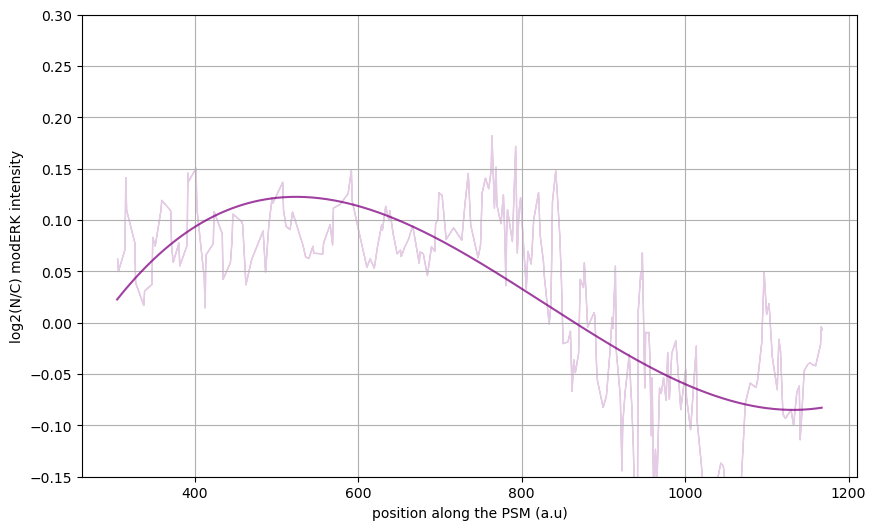

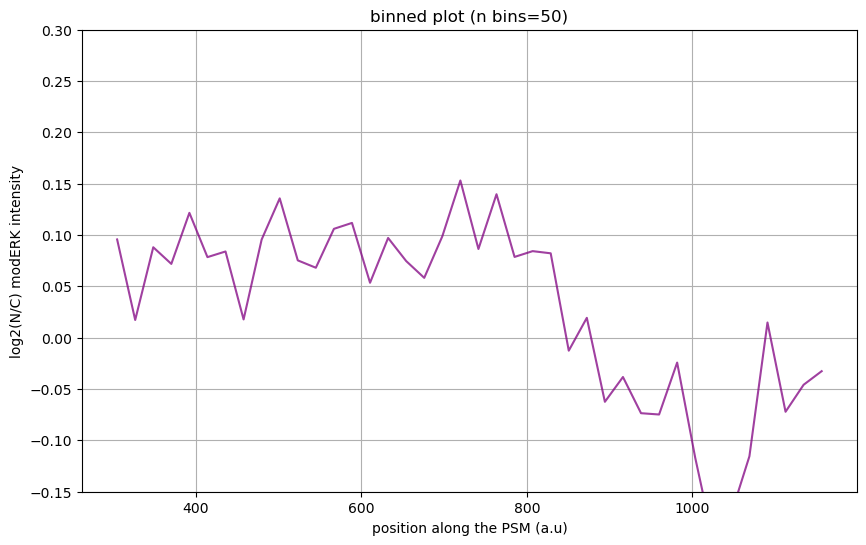

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl


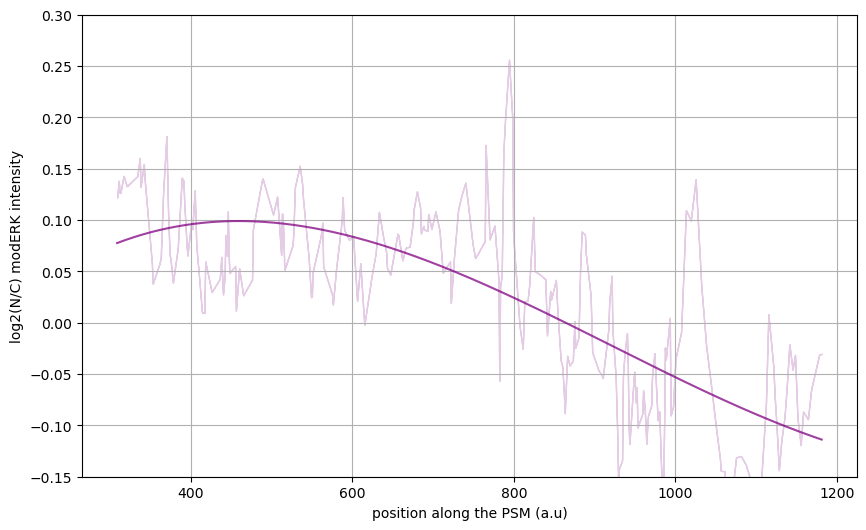

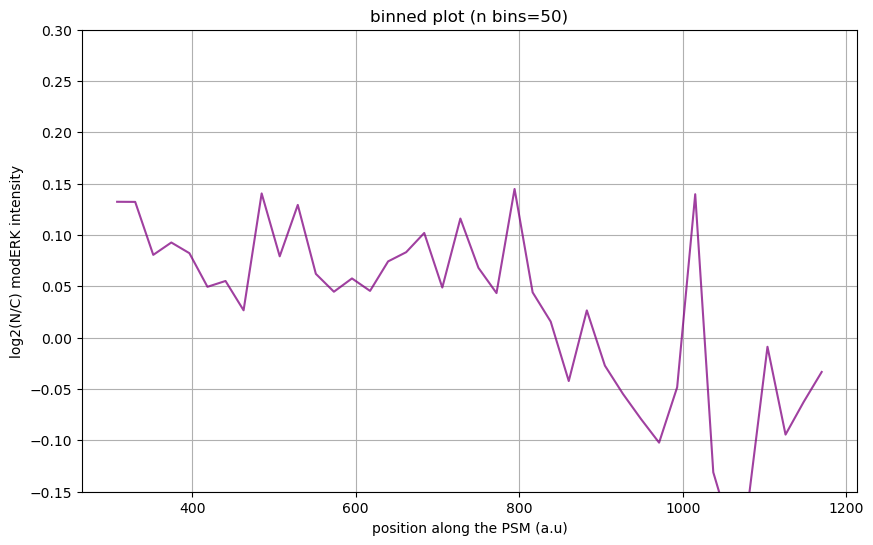

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl


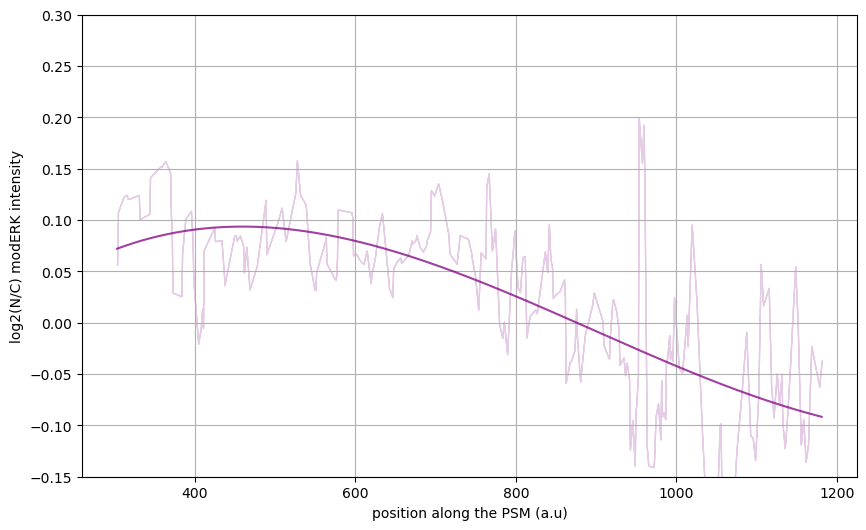

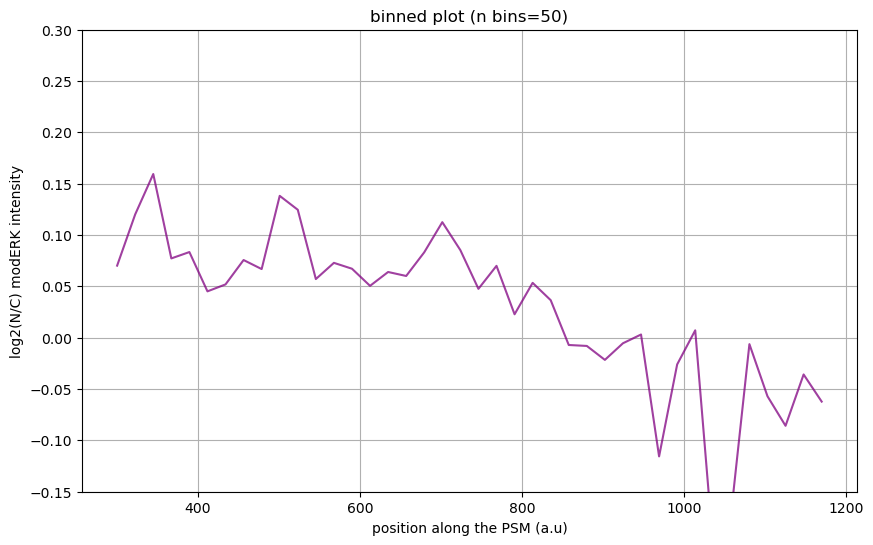

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl


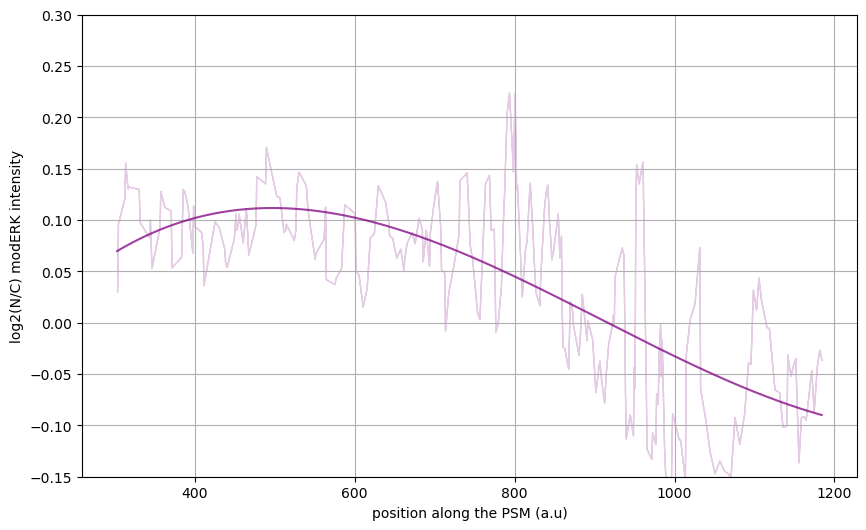

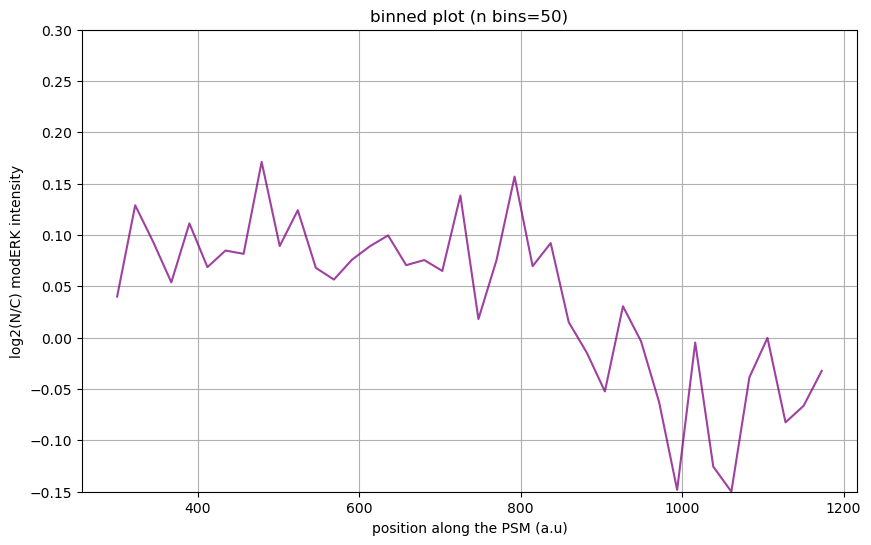

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl


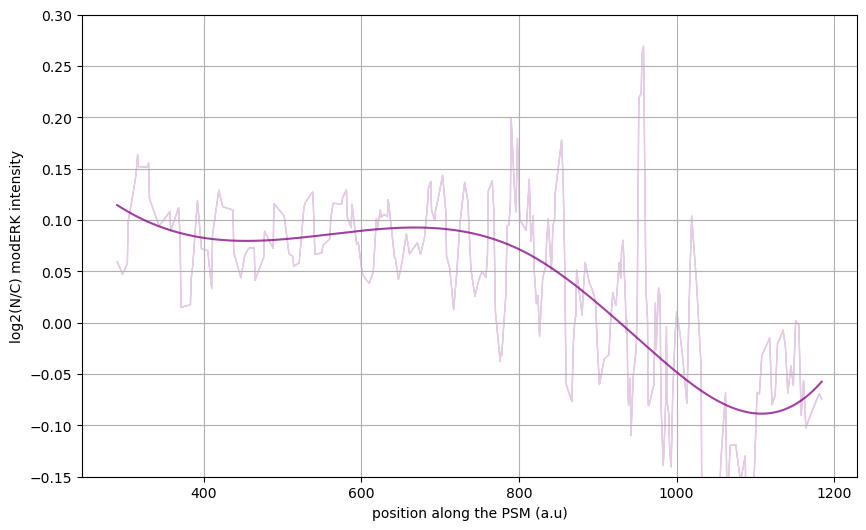

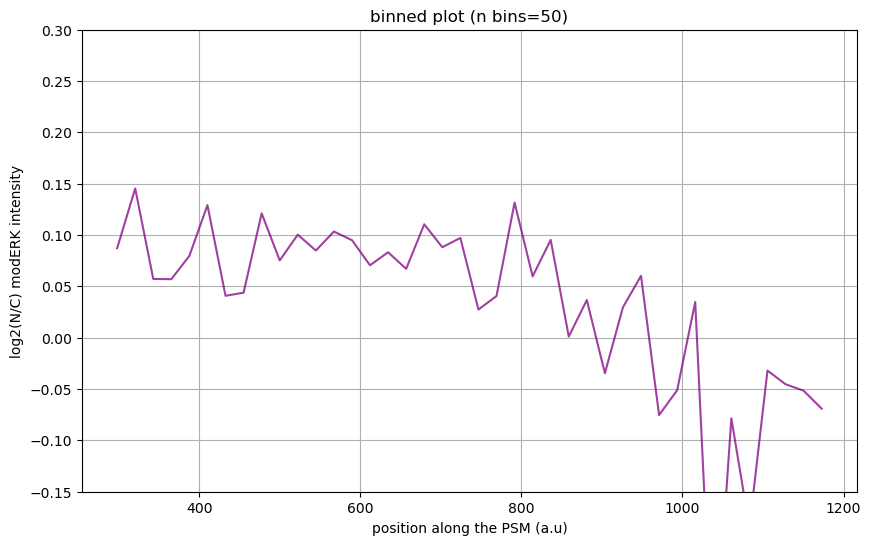

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

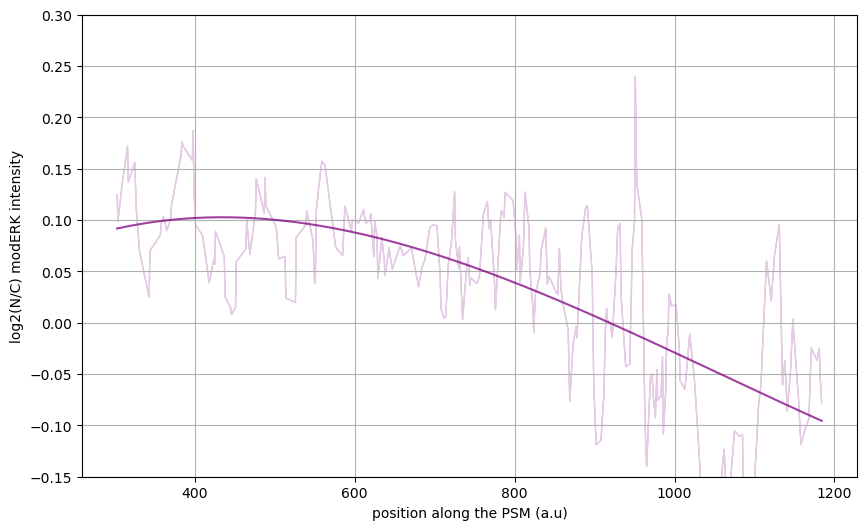

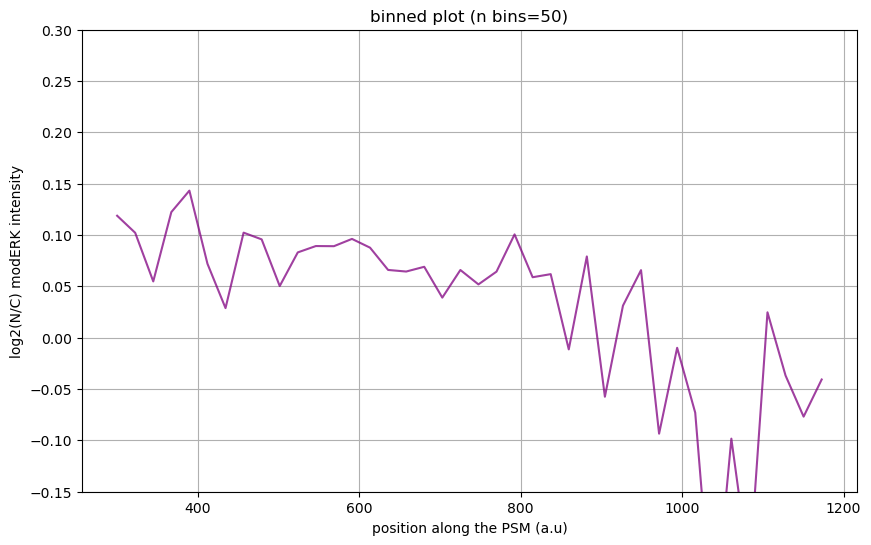

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

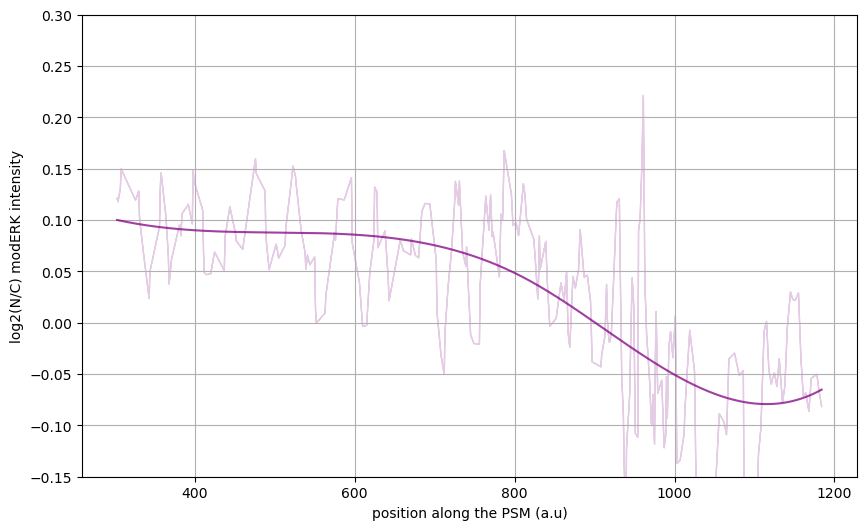

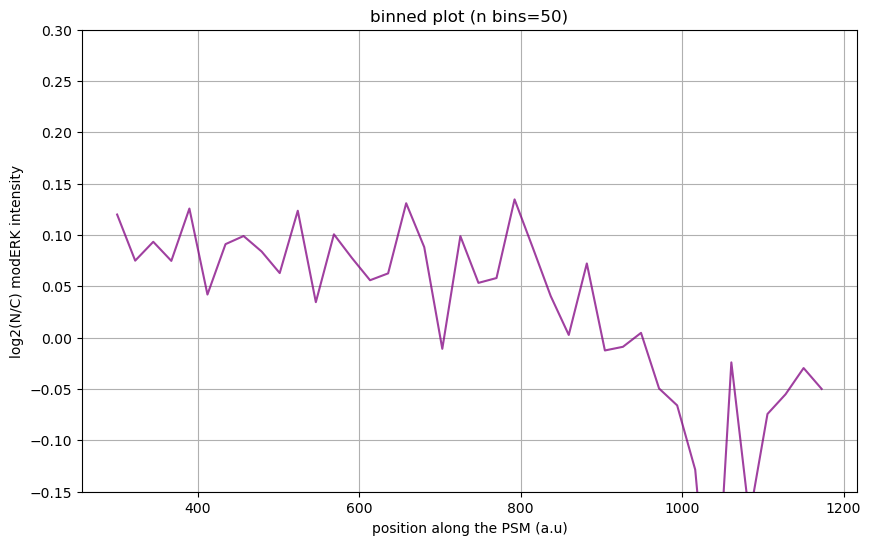

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

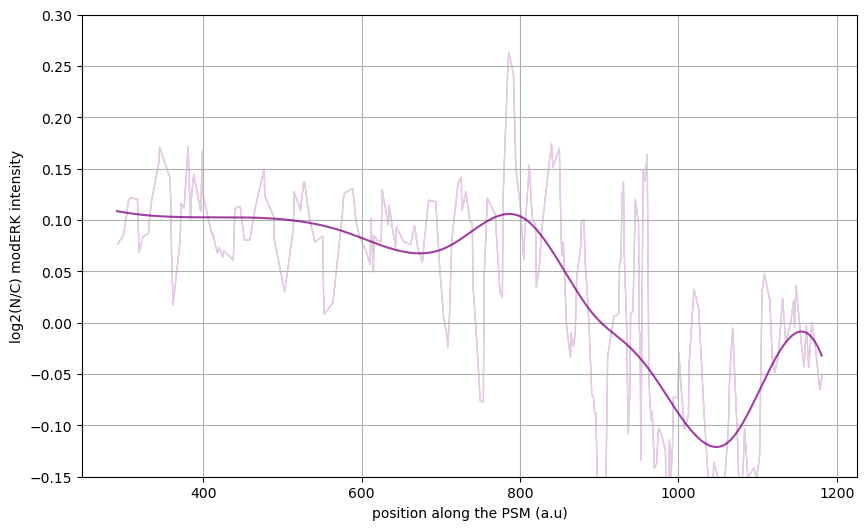

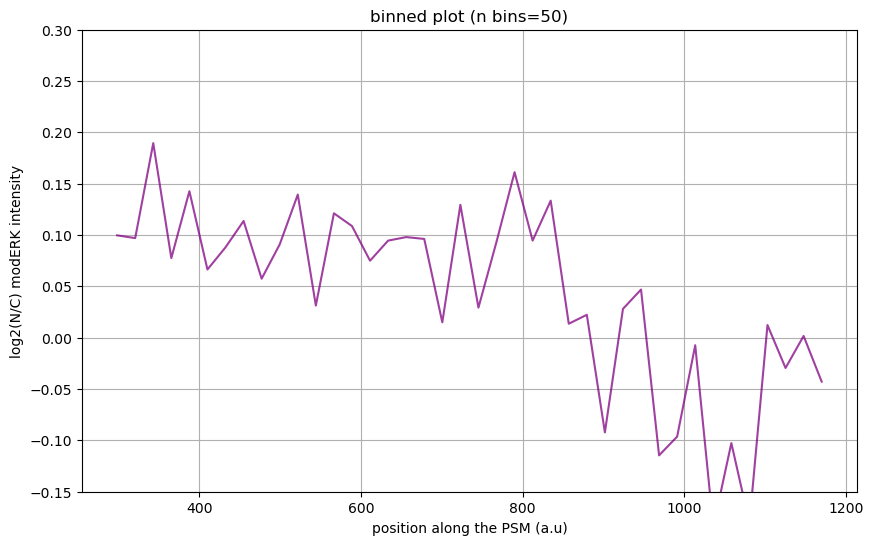

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

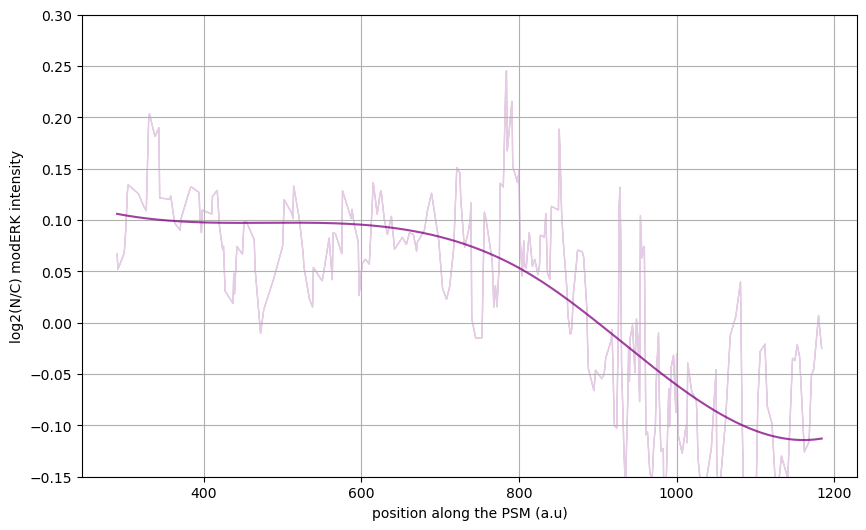

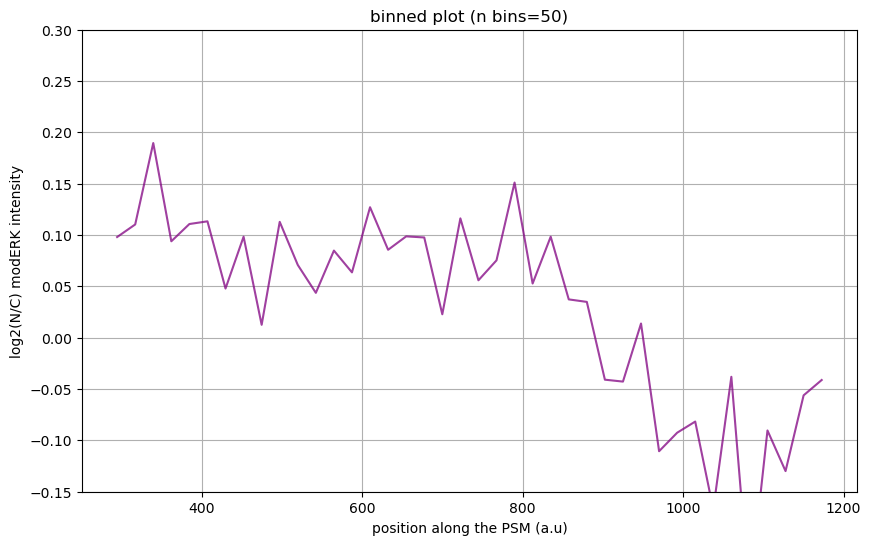

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

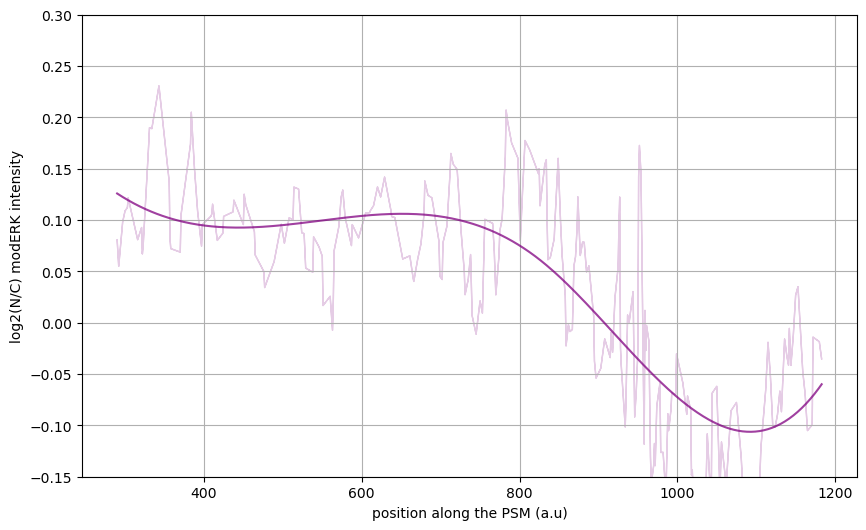

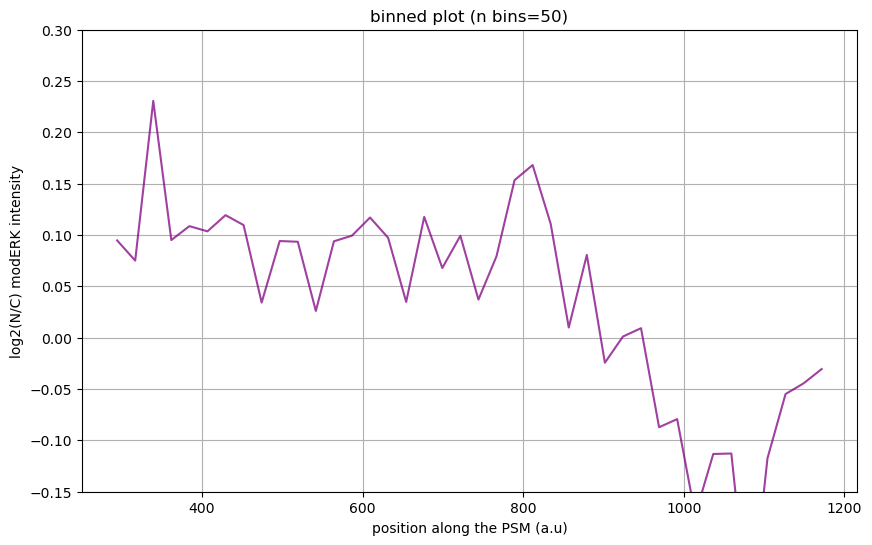

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

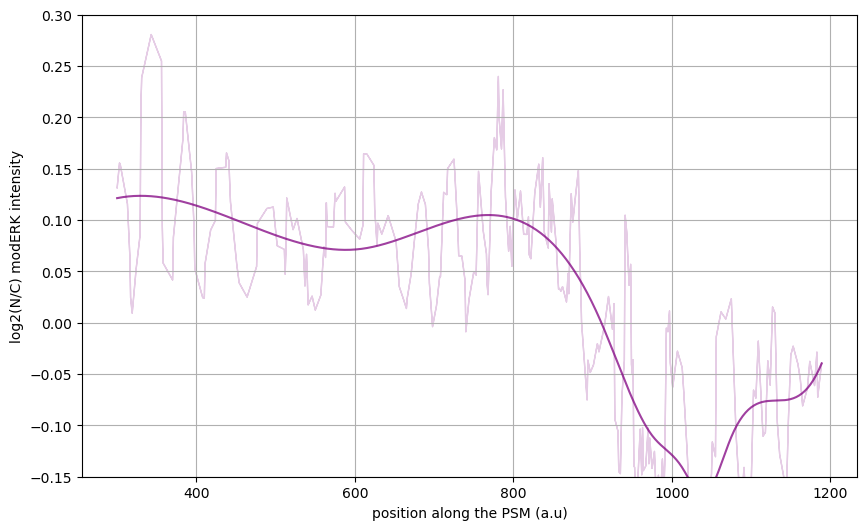

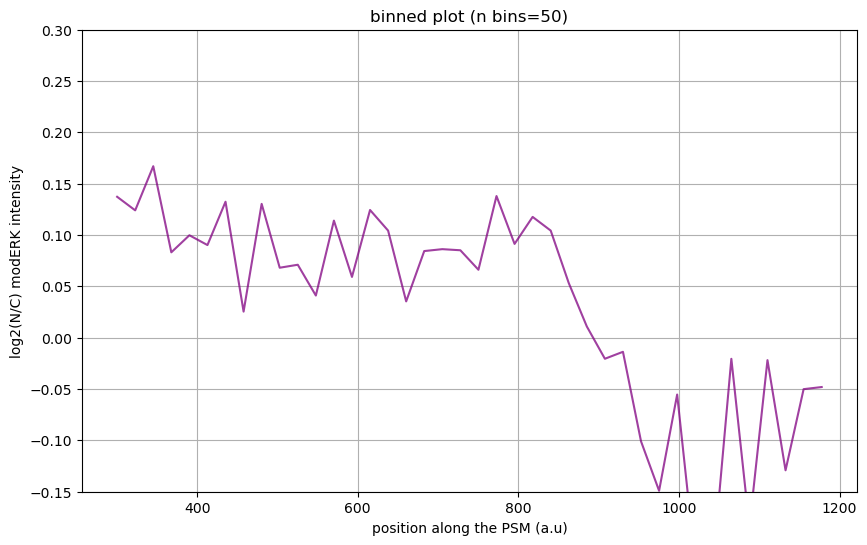

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

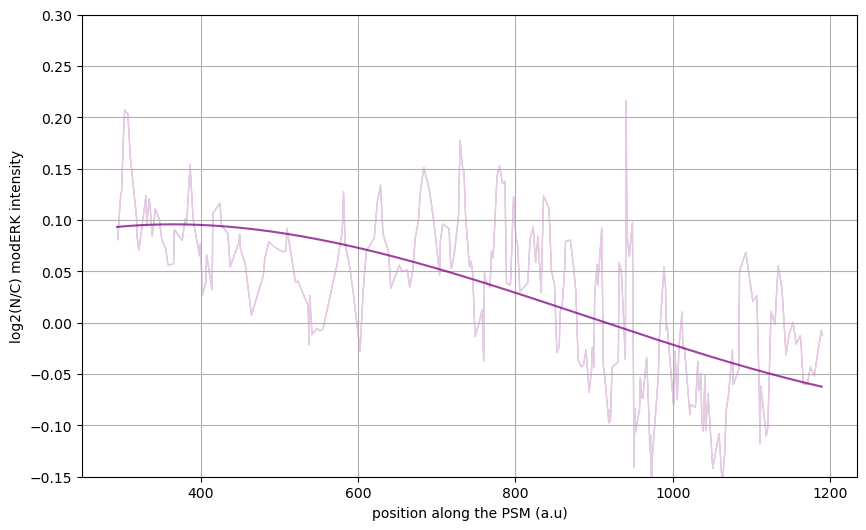

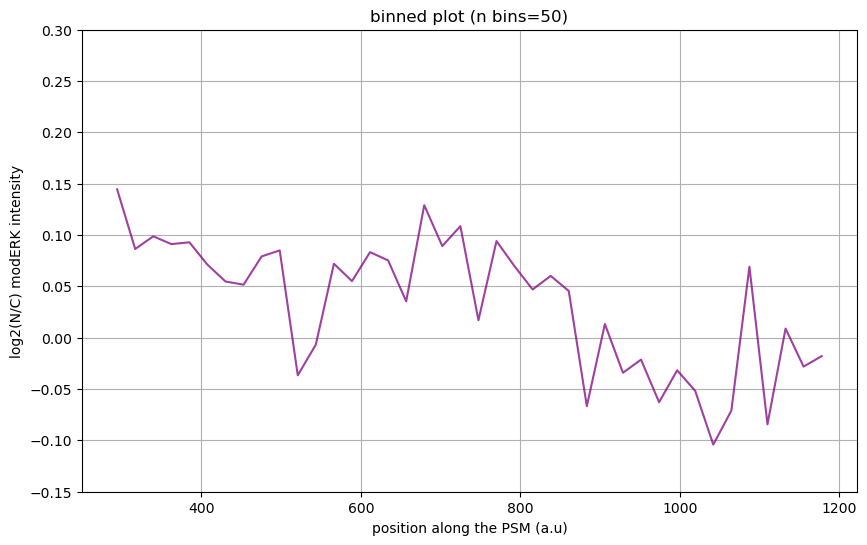

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

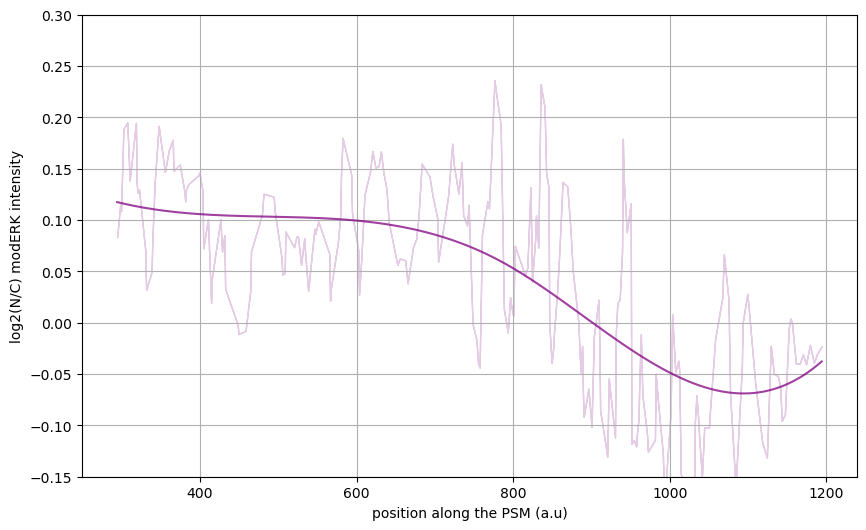

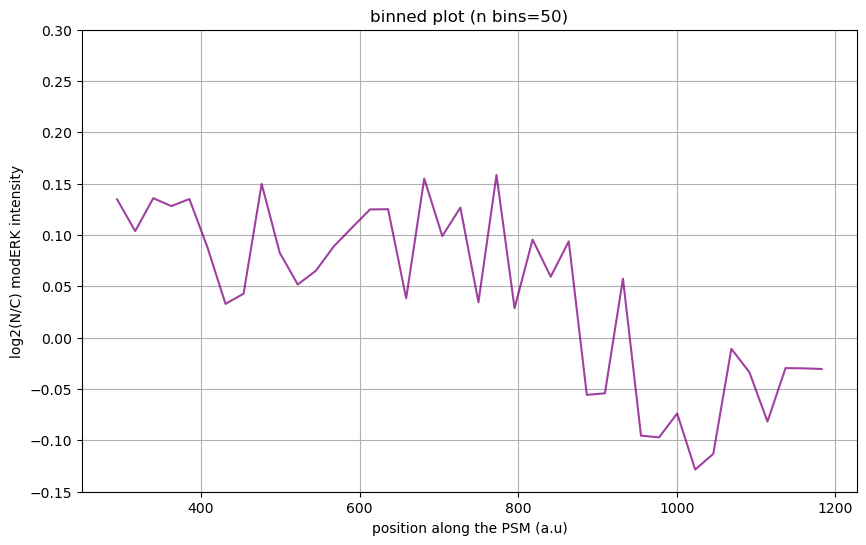

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

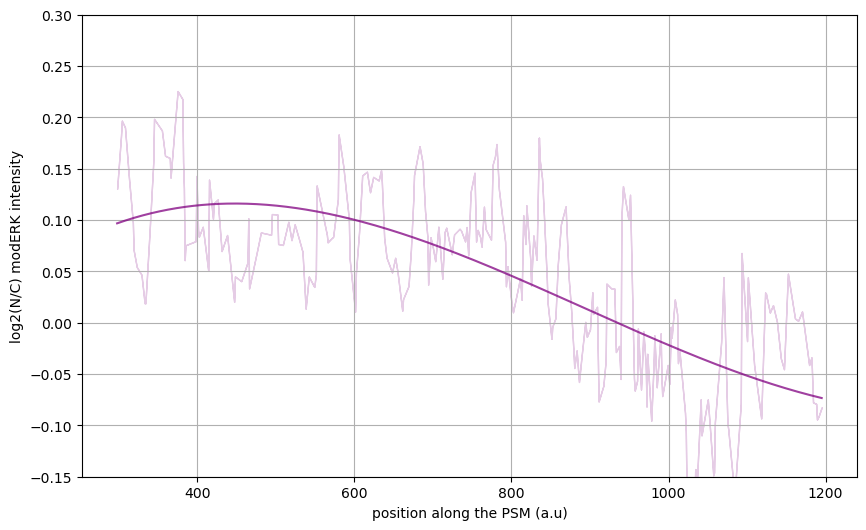

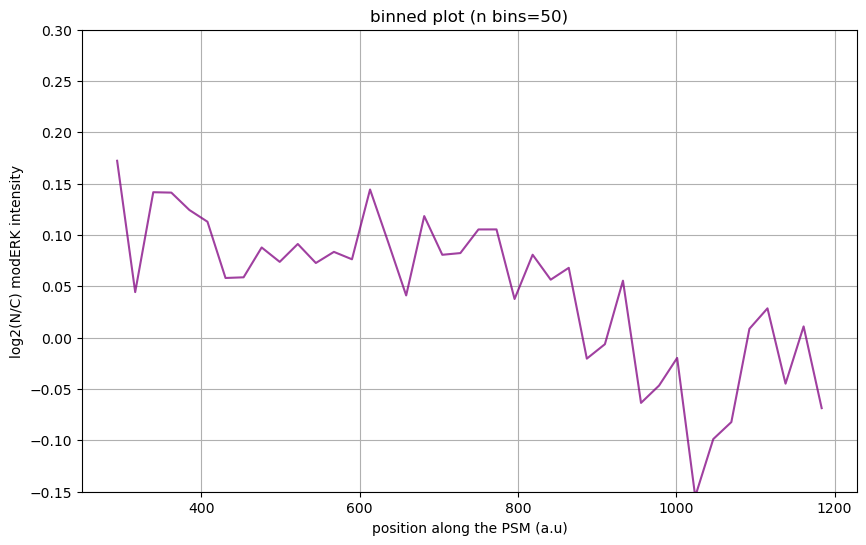

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

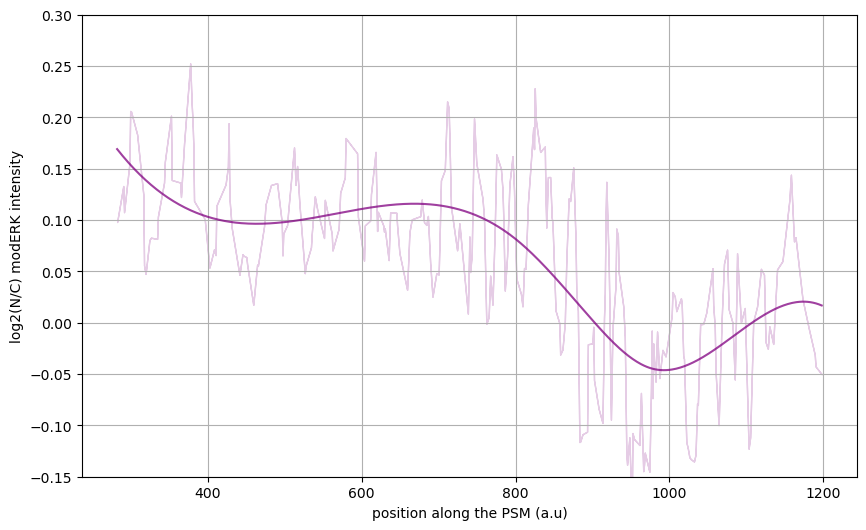

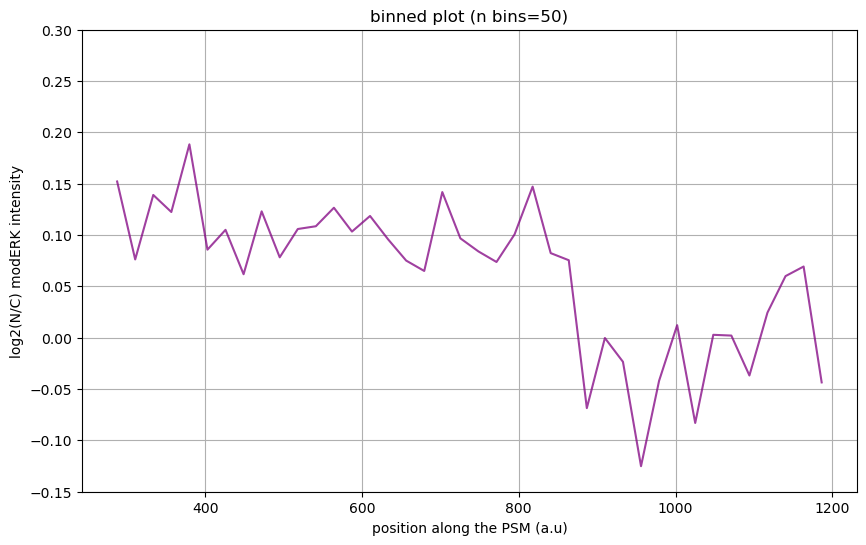

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

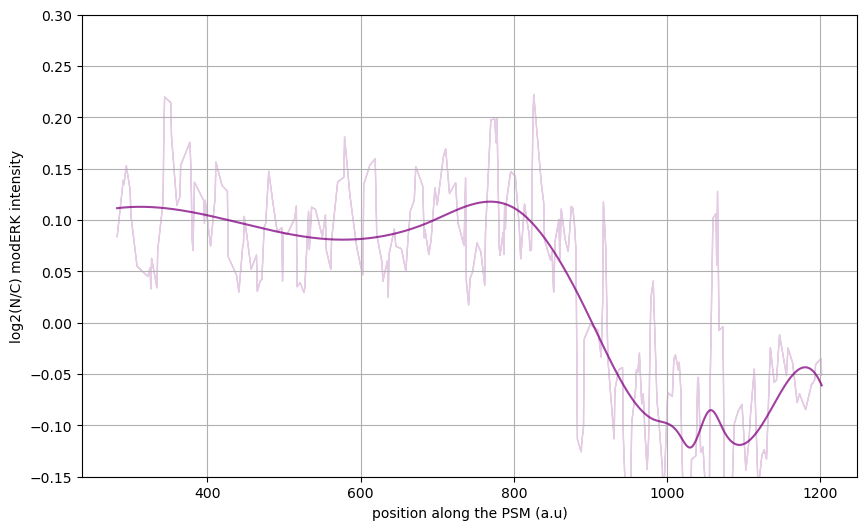

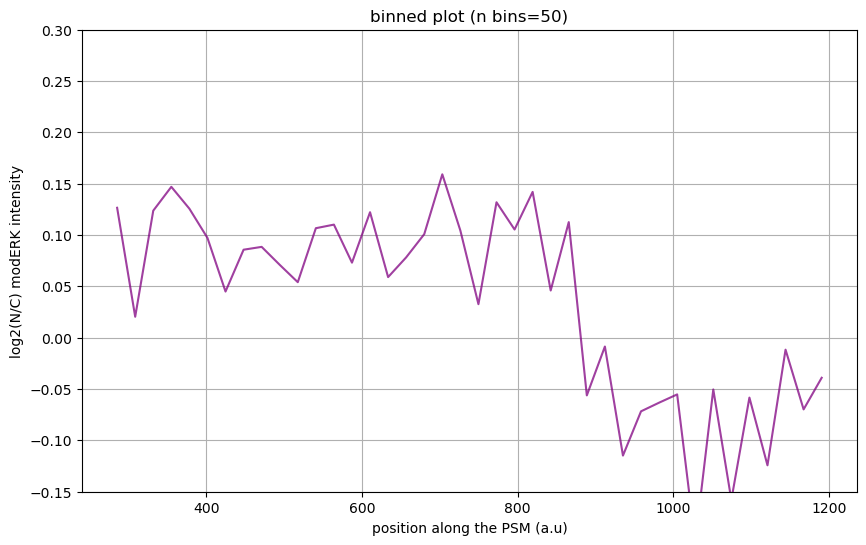

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

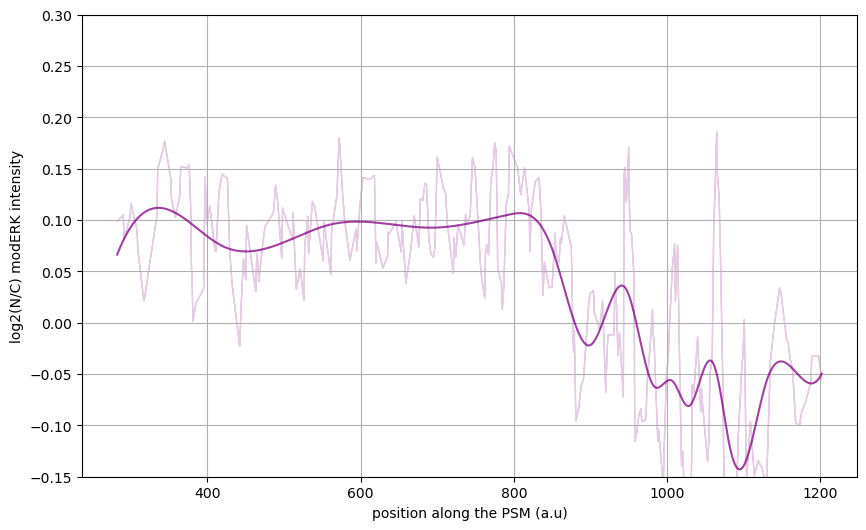

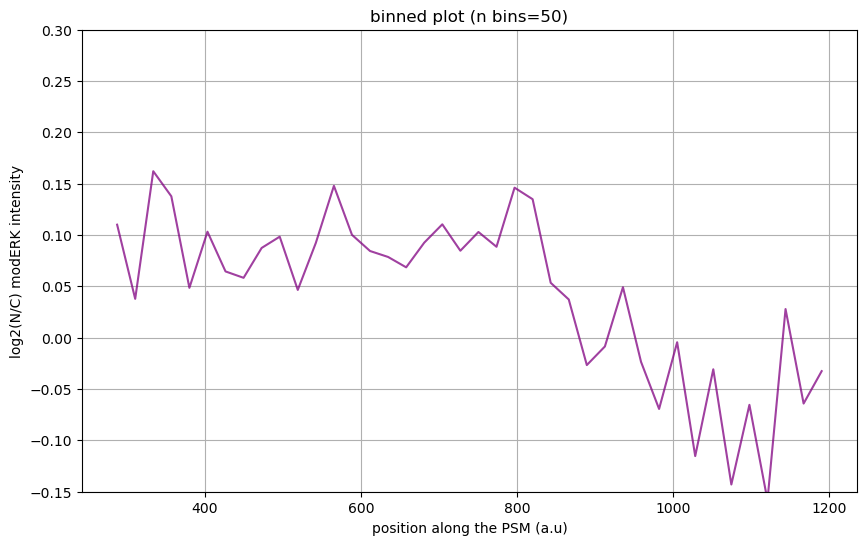

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

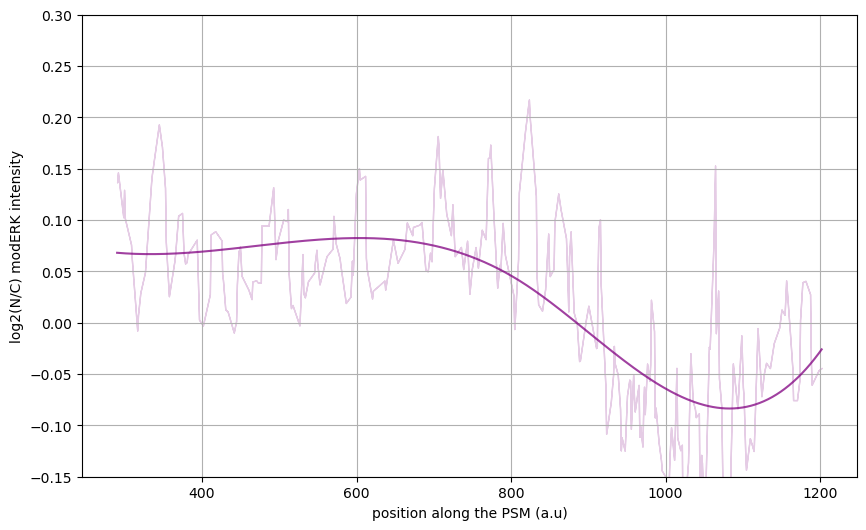

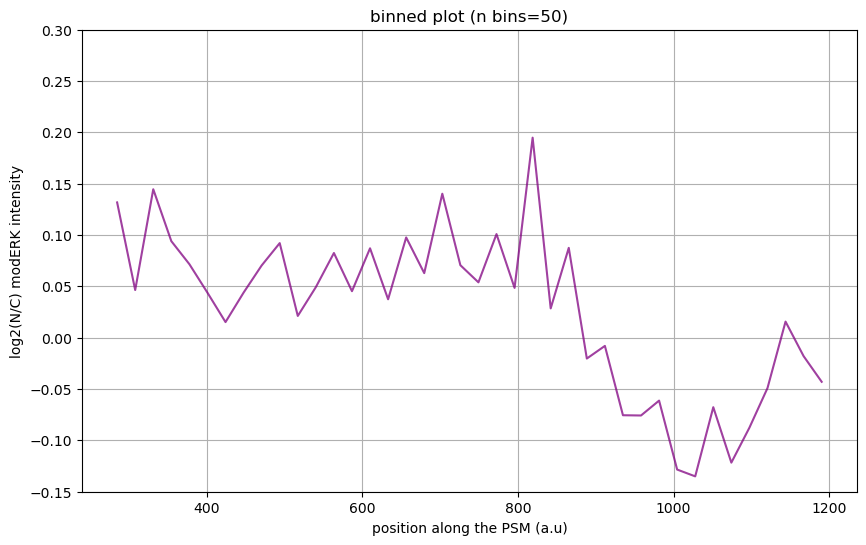

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

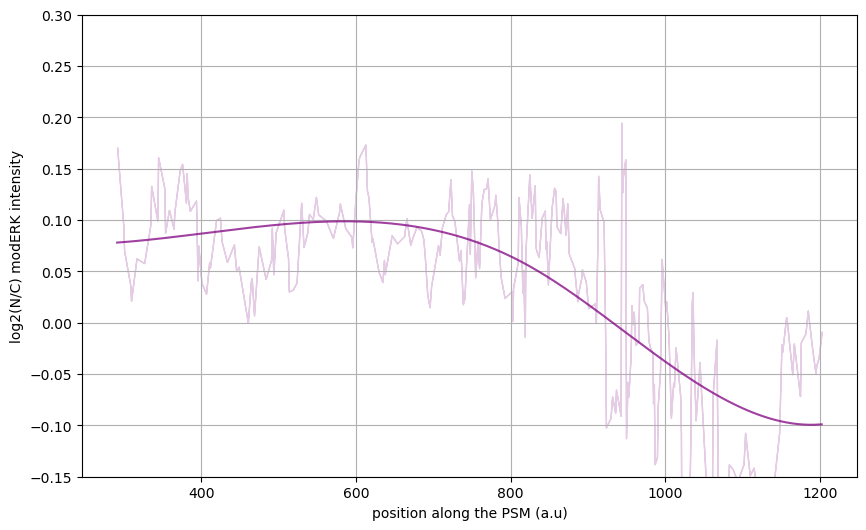

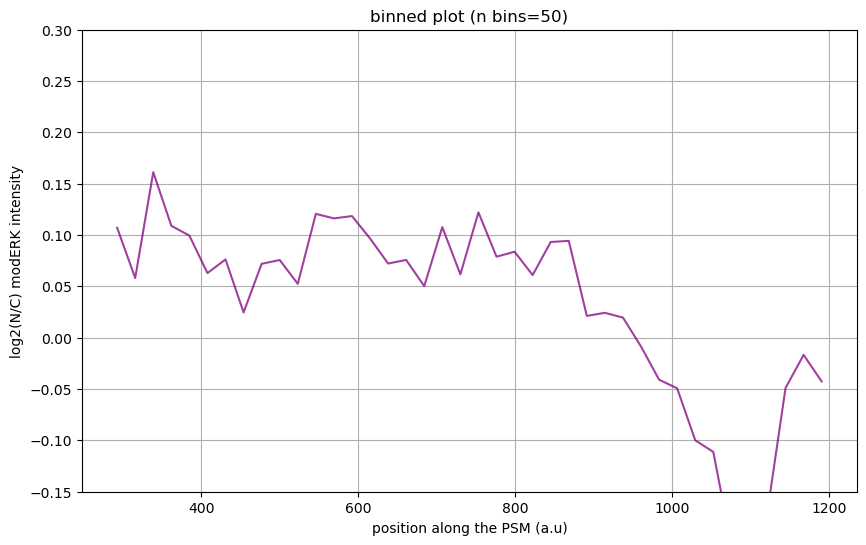

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

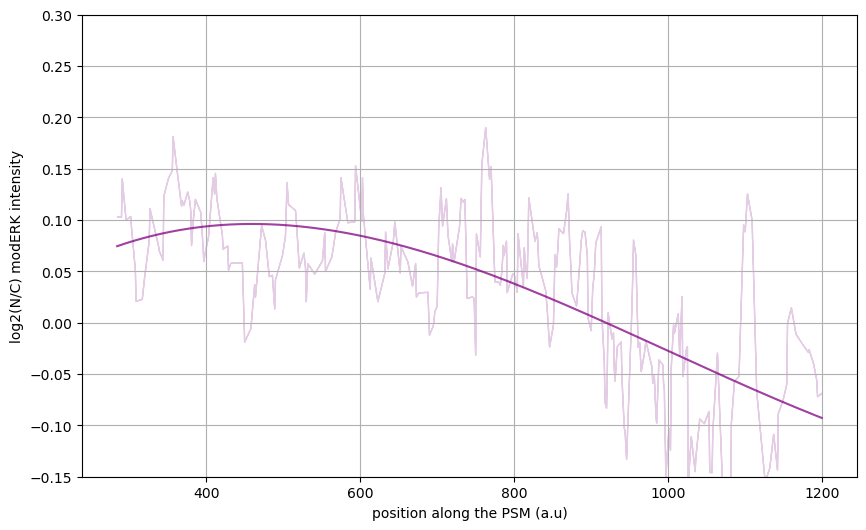

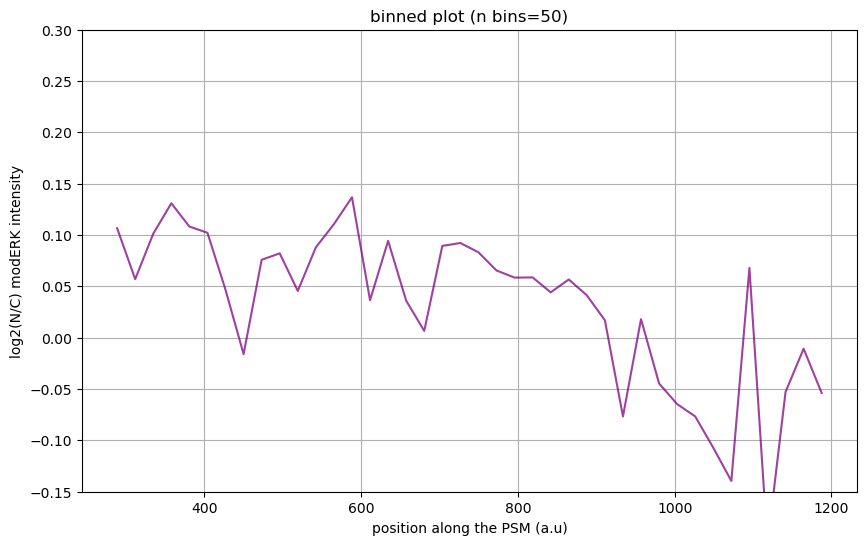

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

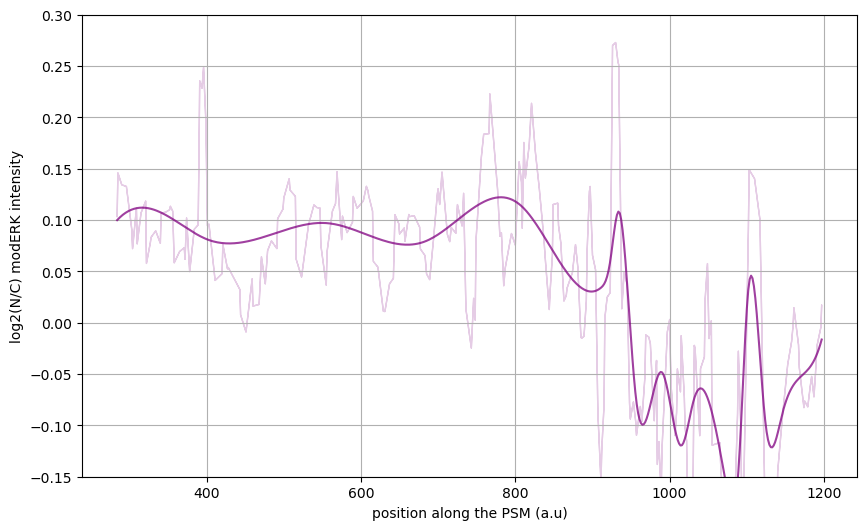

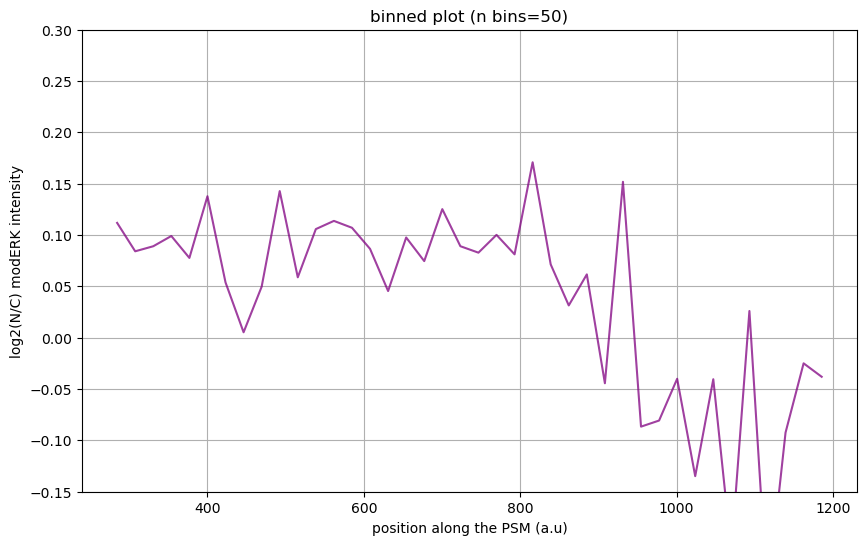

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

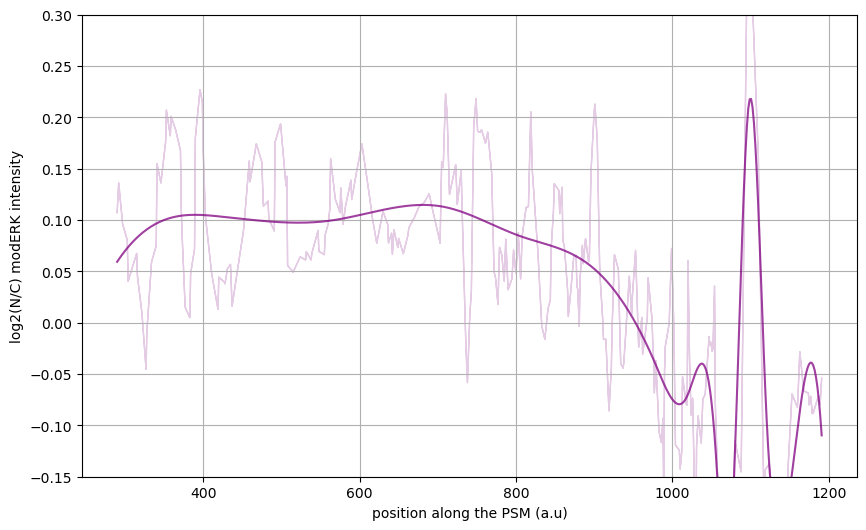

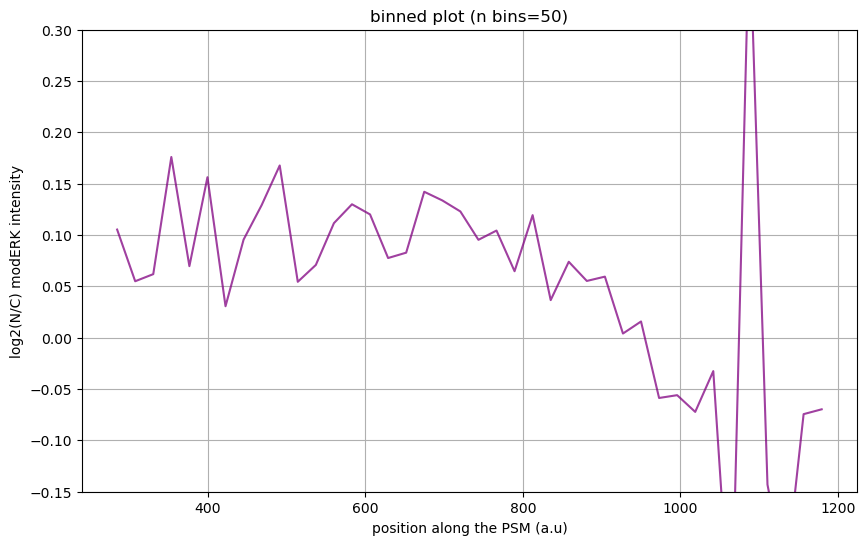

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

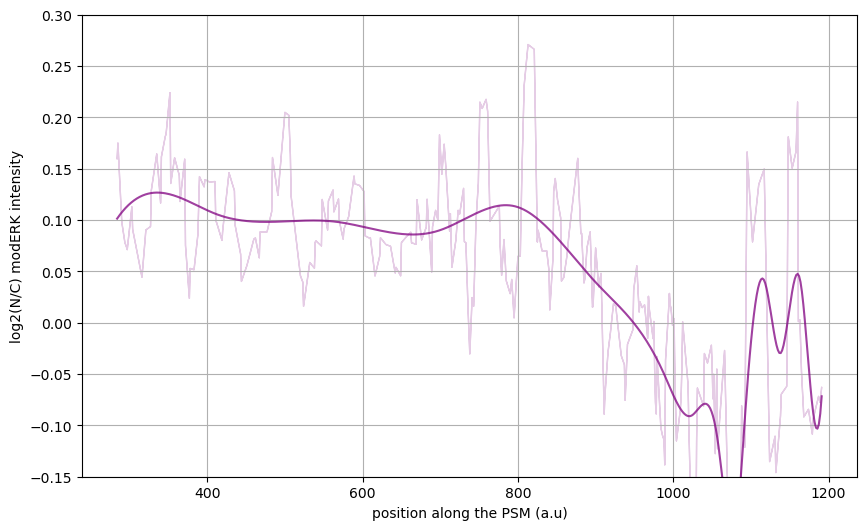

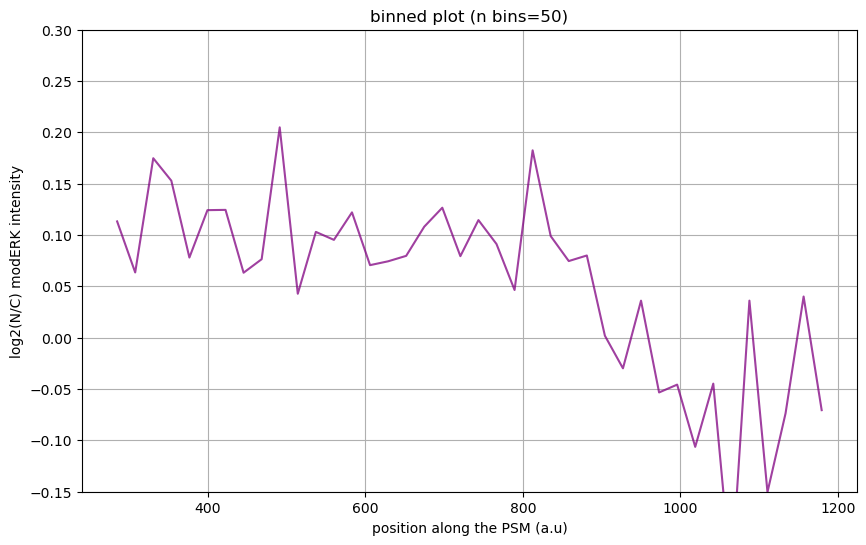

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

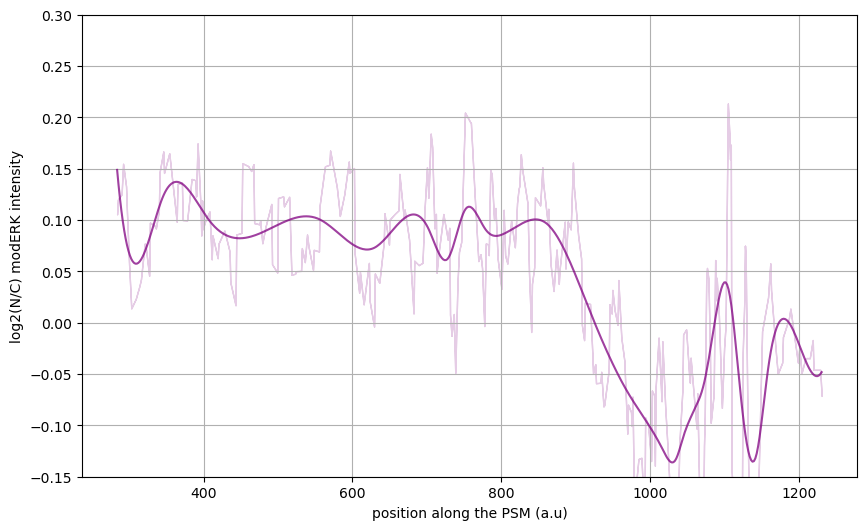

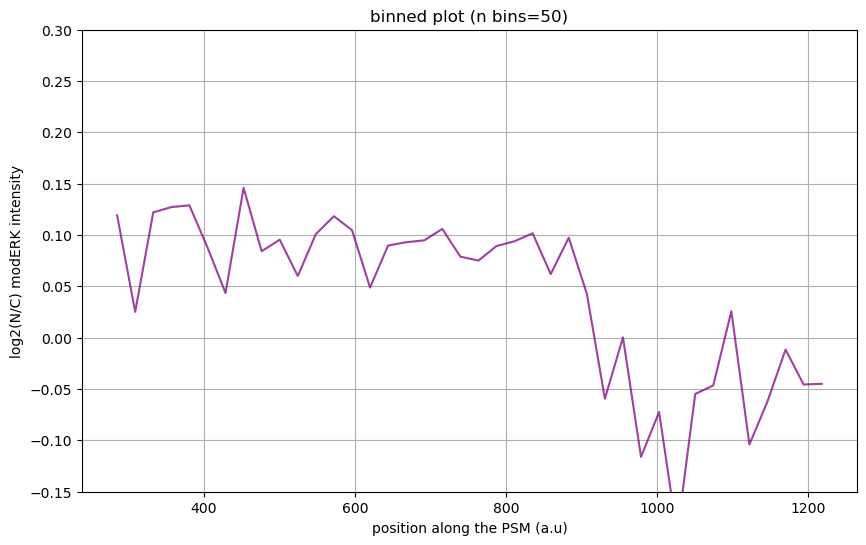

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

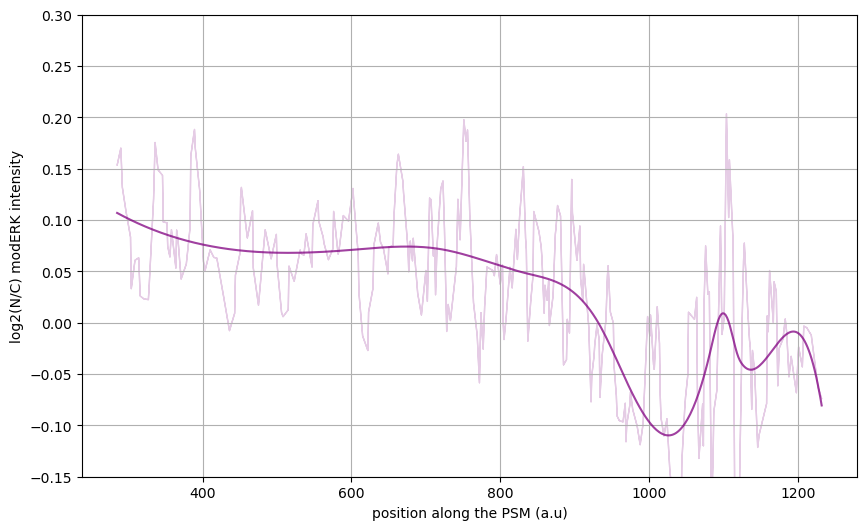

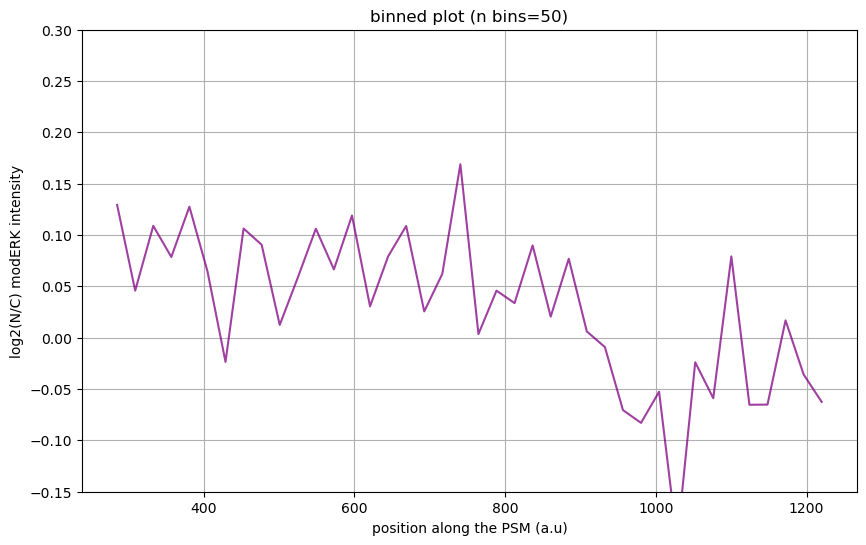

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

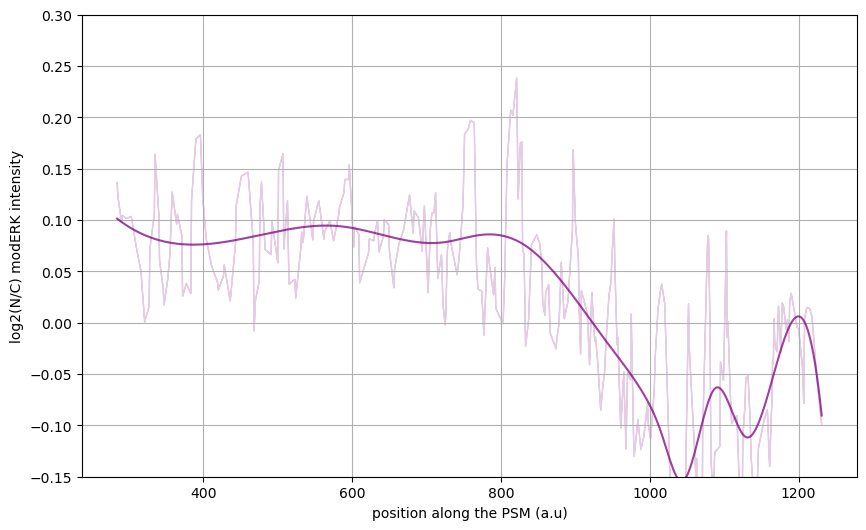

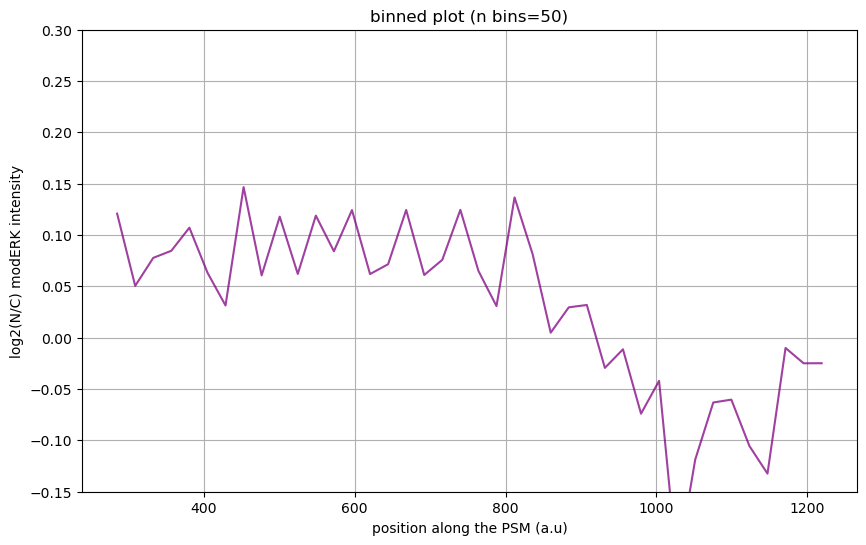

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

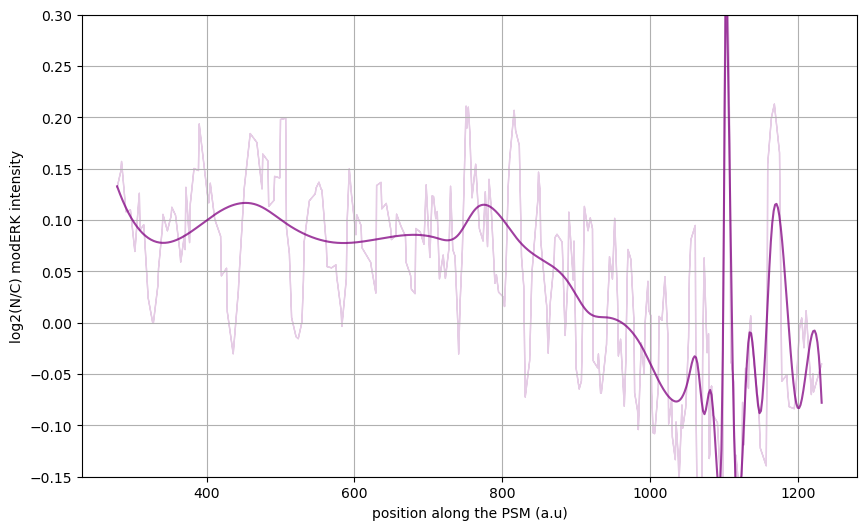

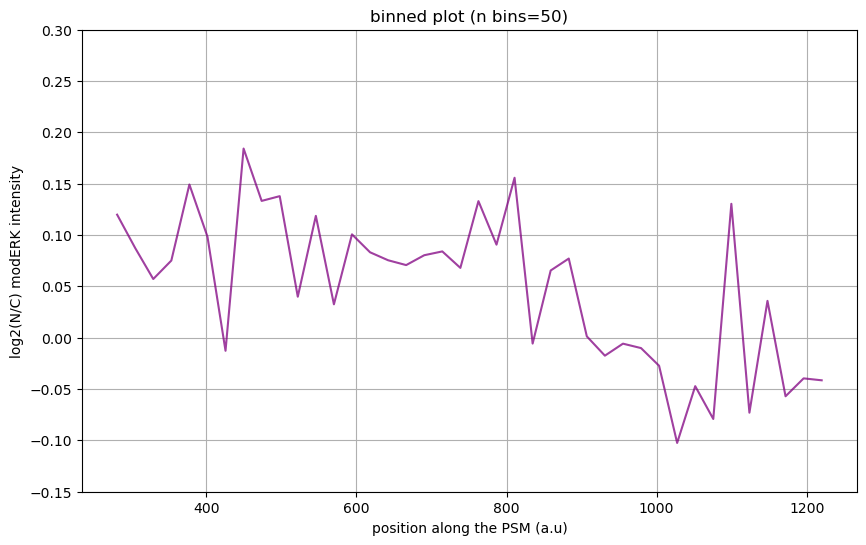

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

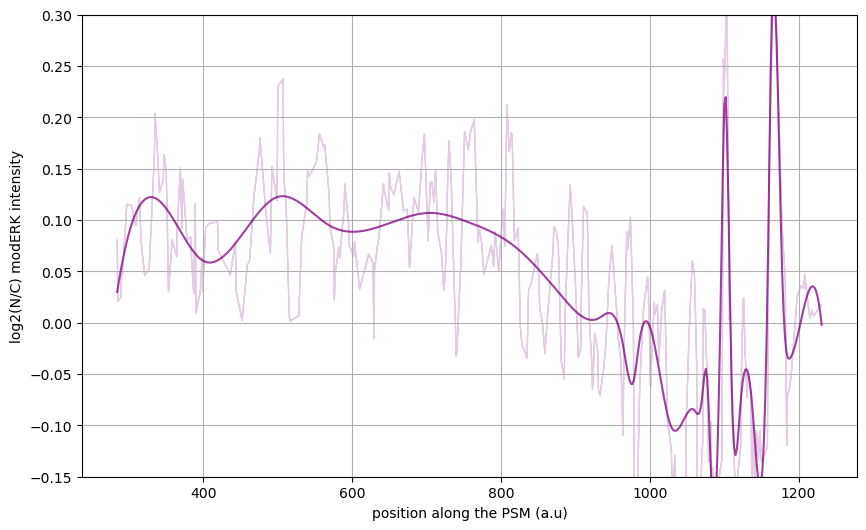

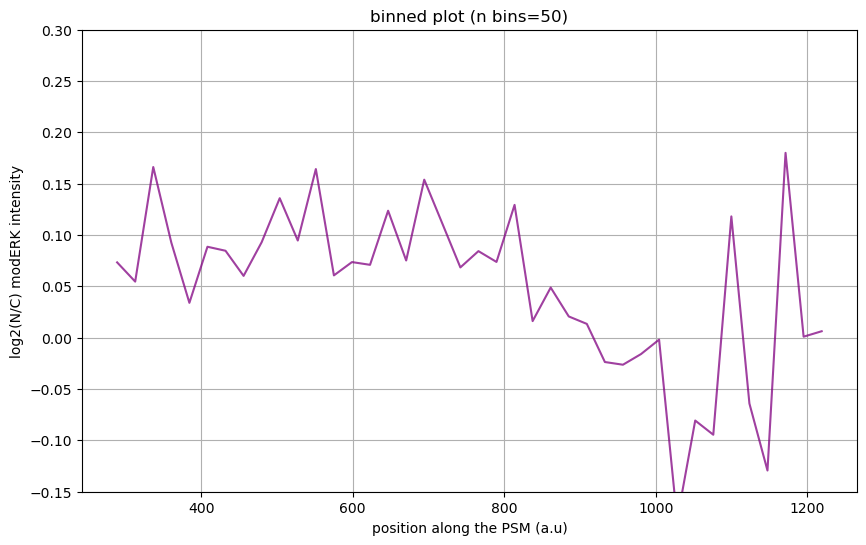

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

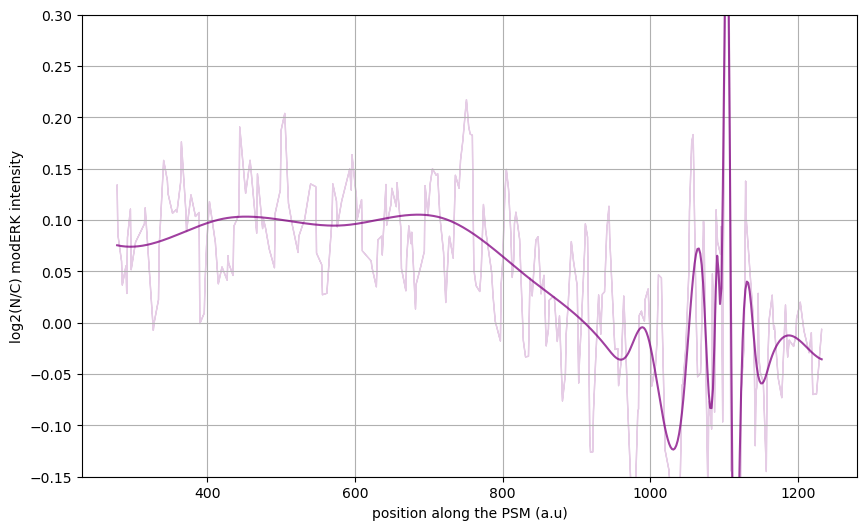

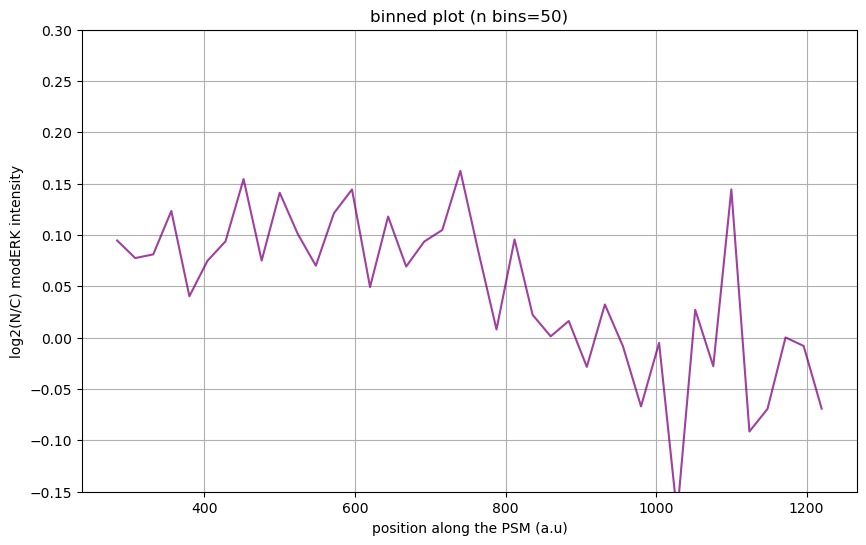

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

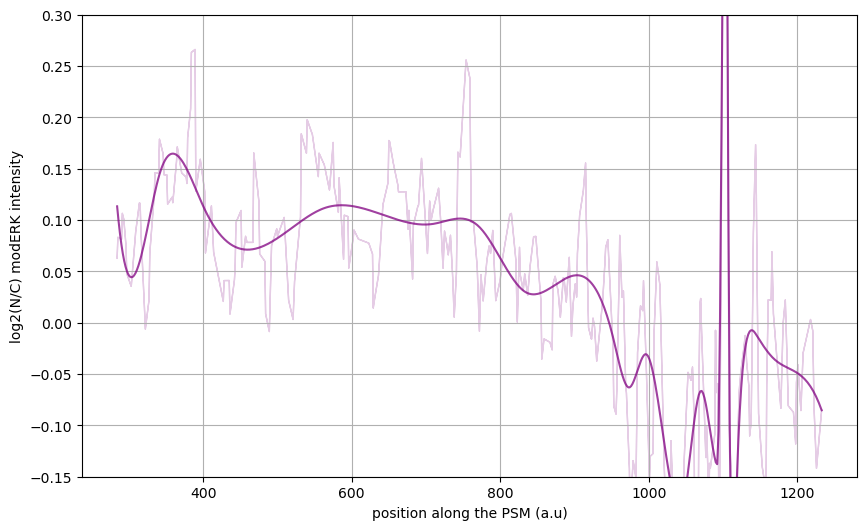

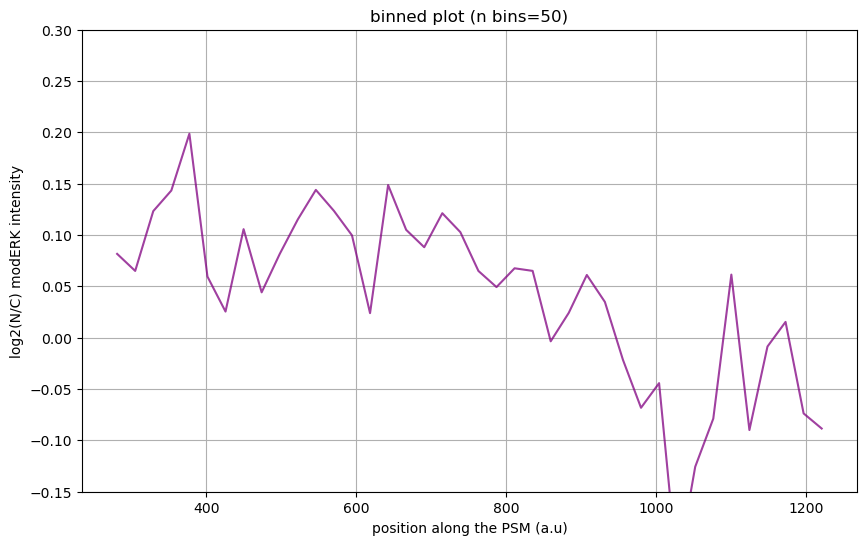

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

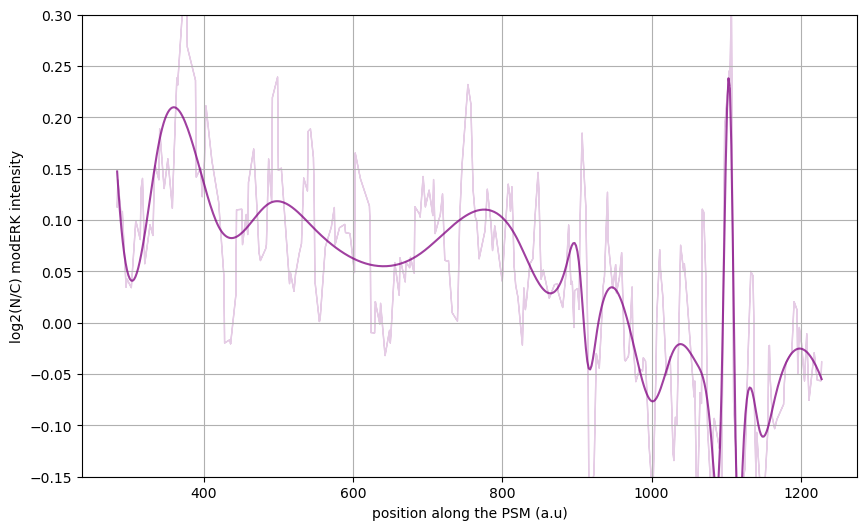

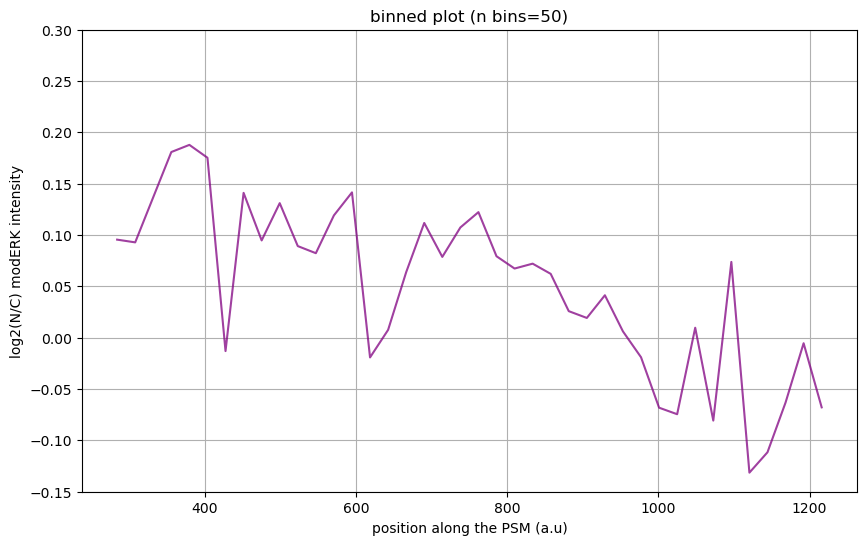

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

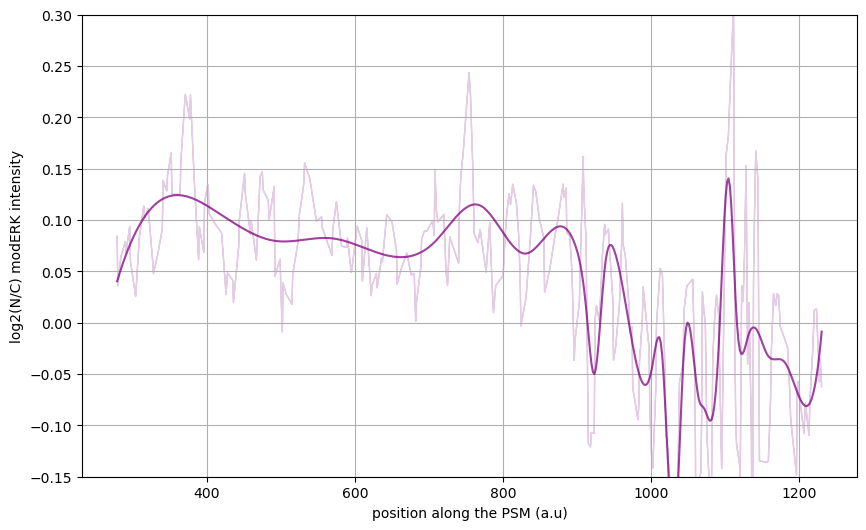

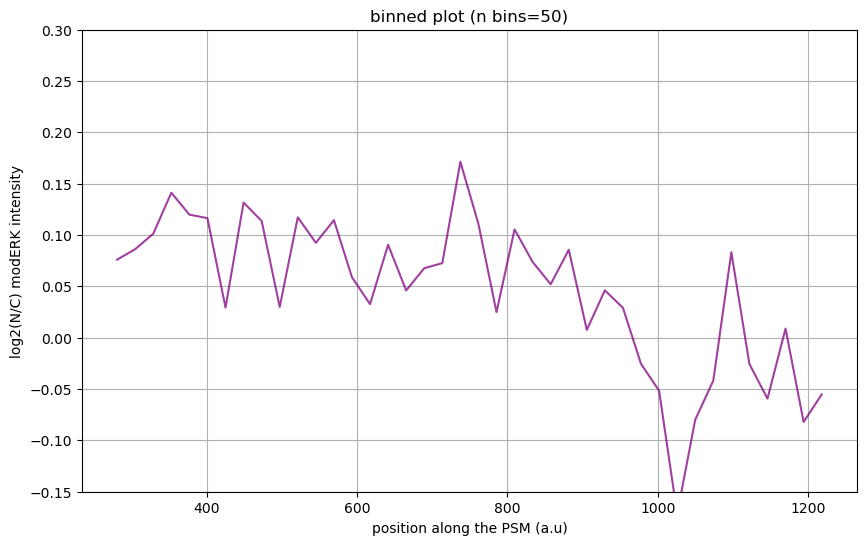

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

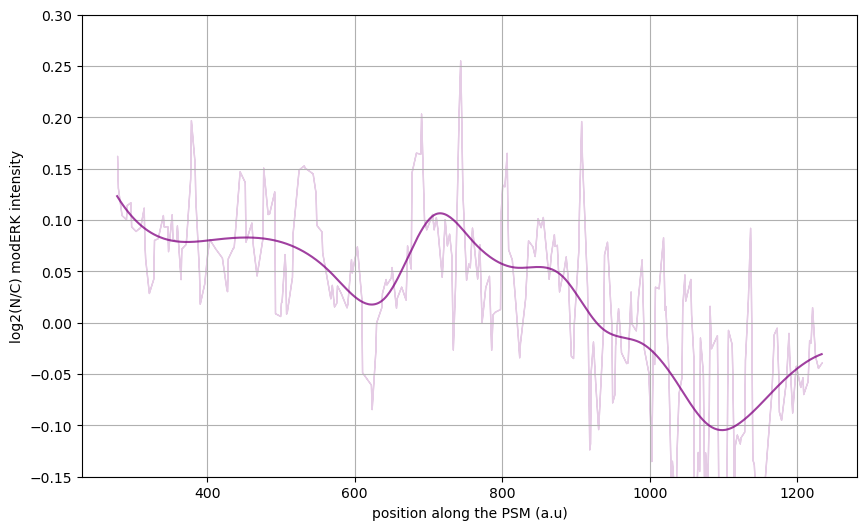

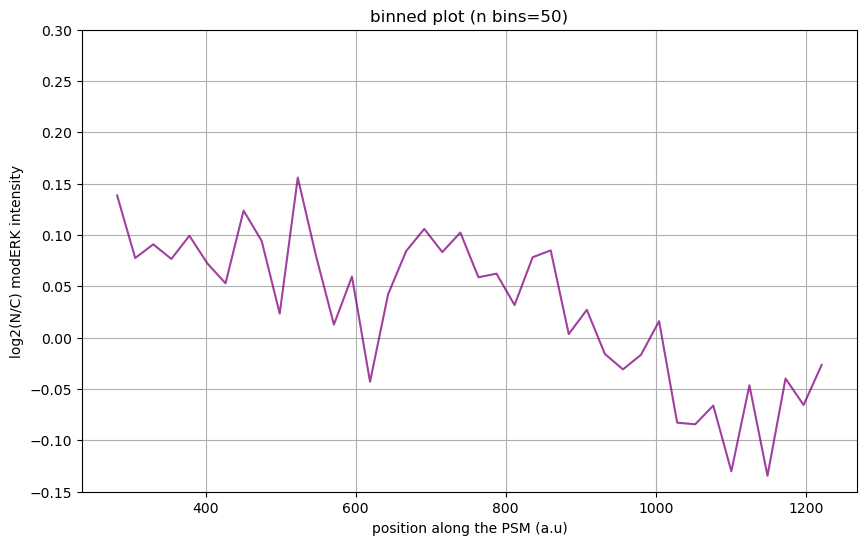

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

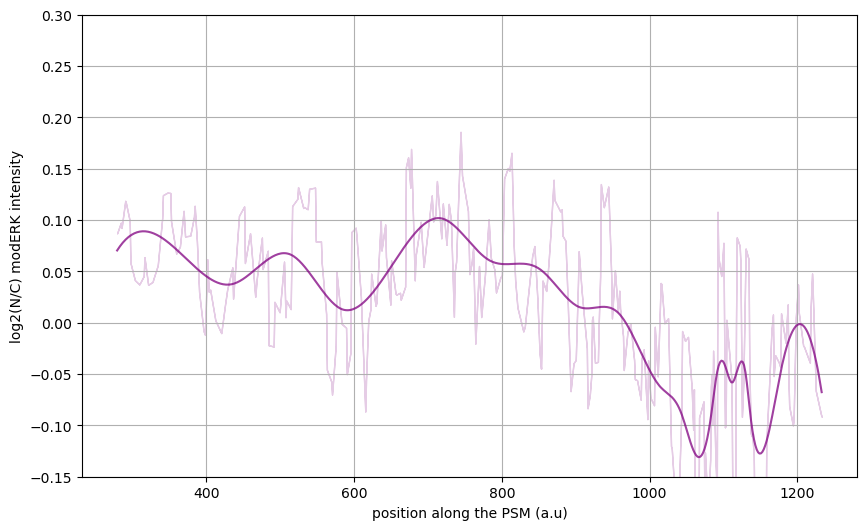

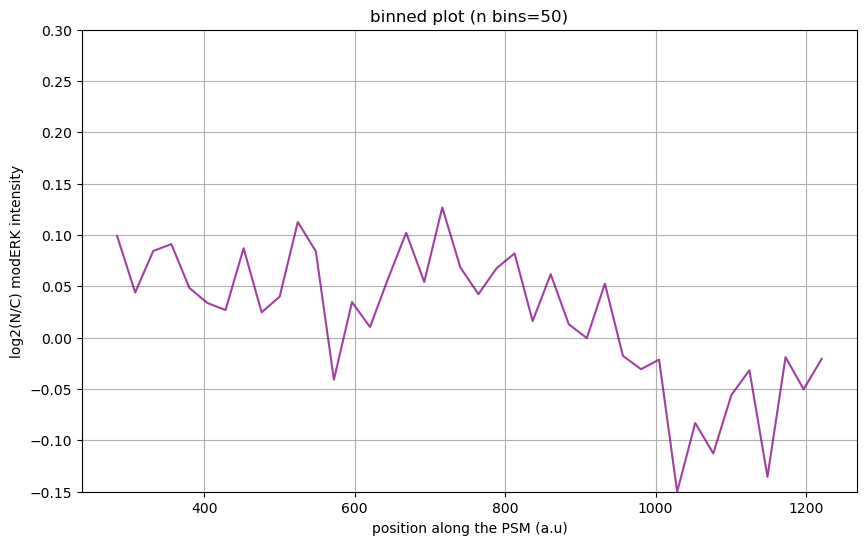

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

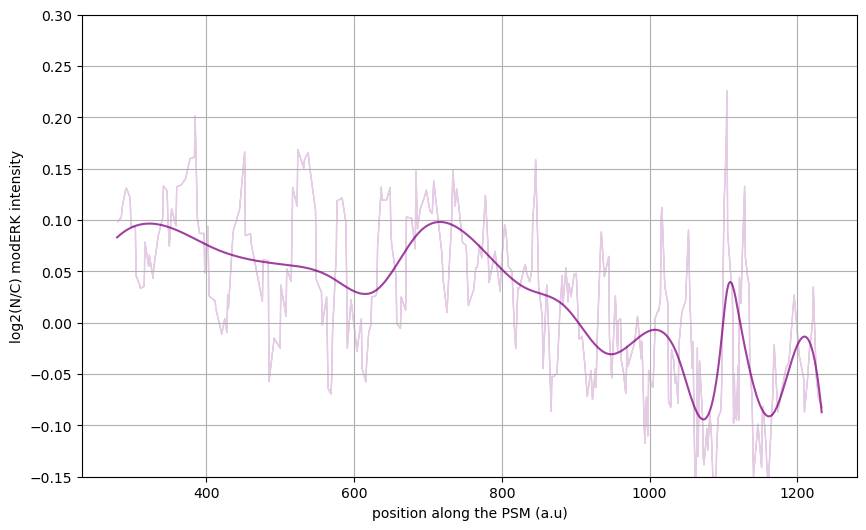

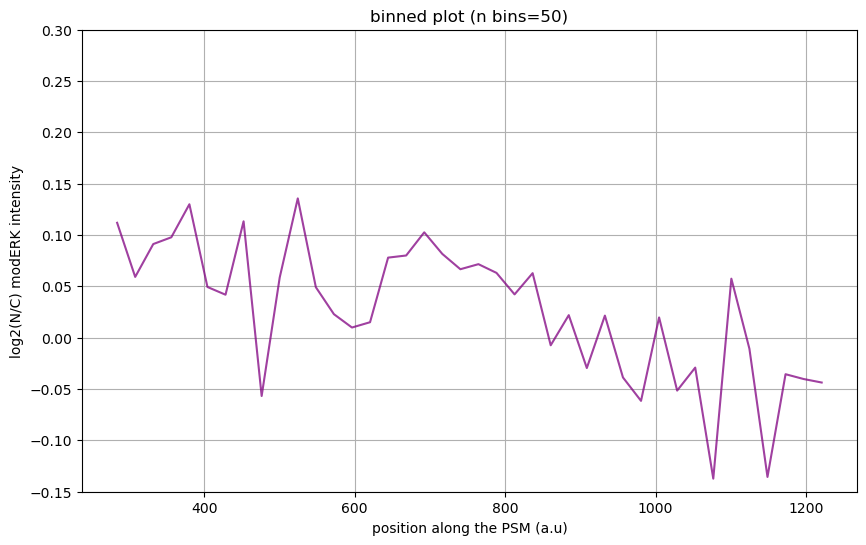

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

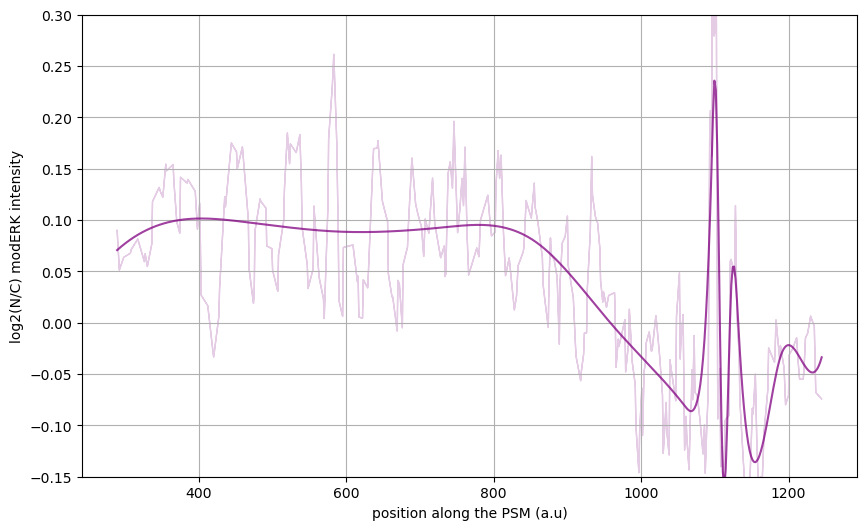

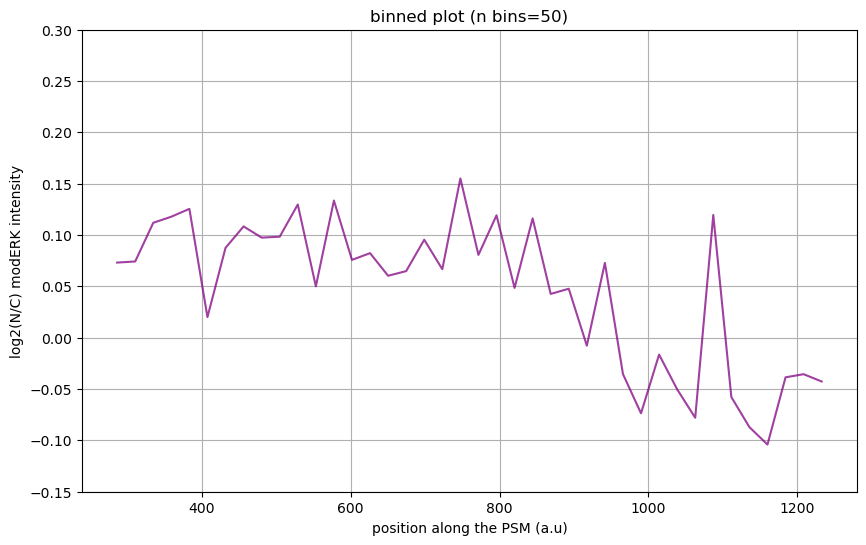

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

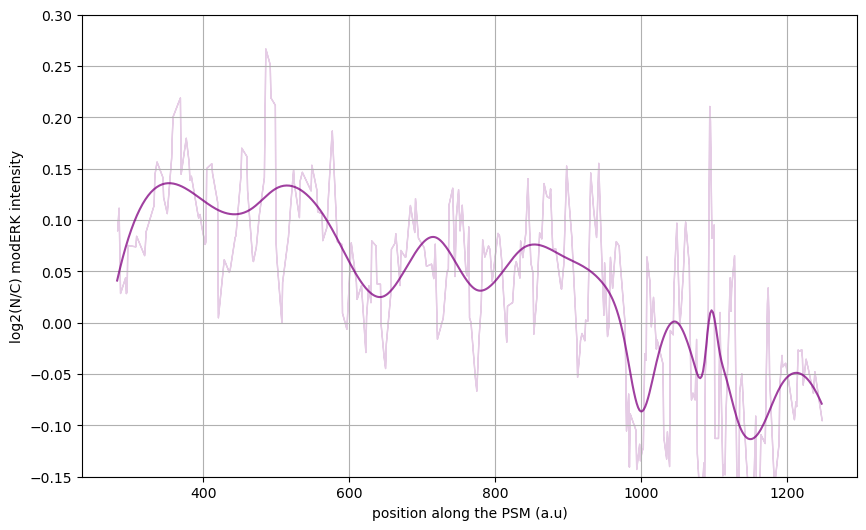

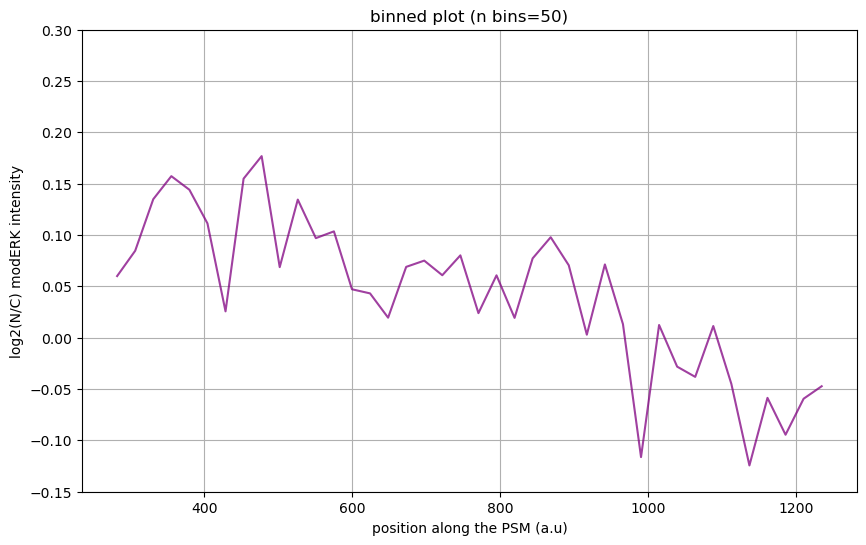

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

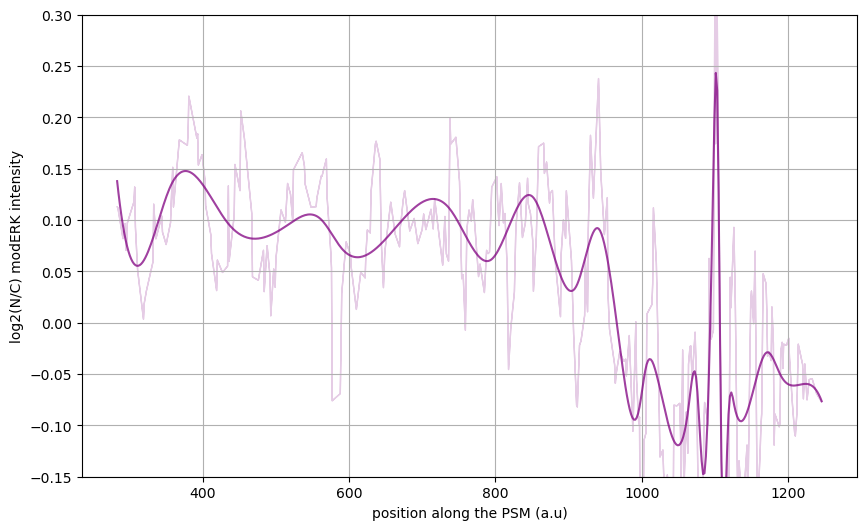

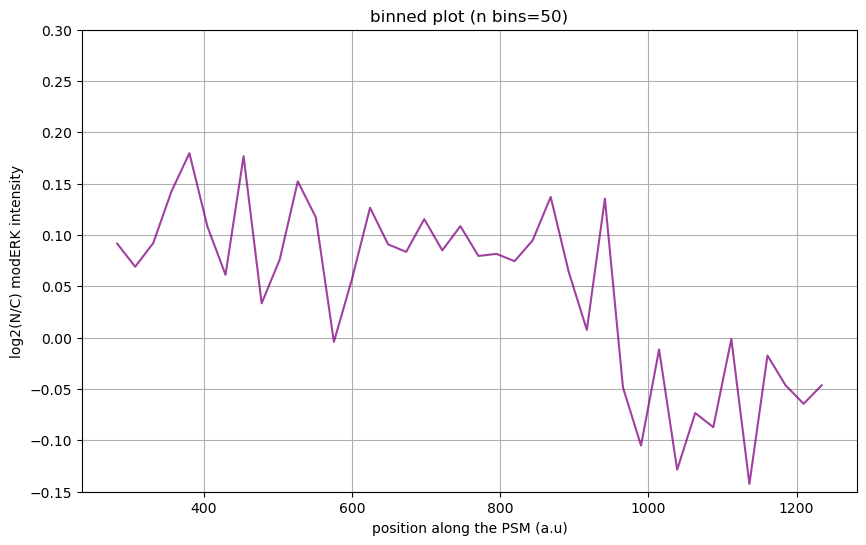

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

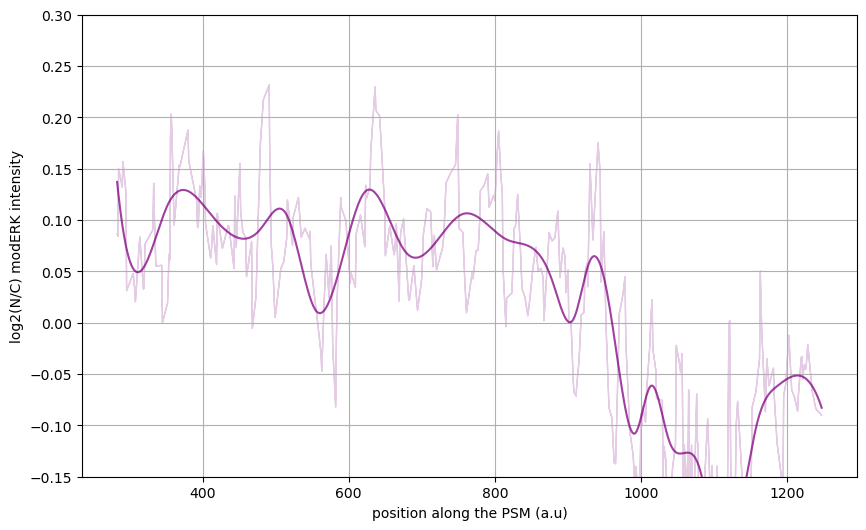

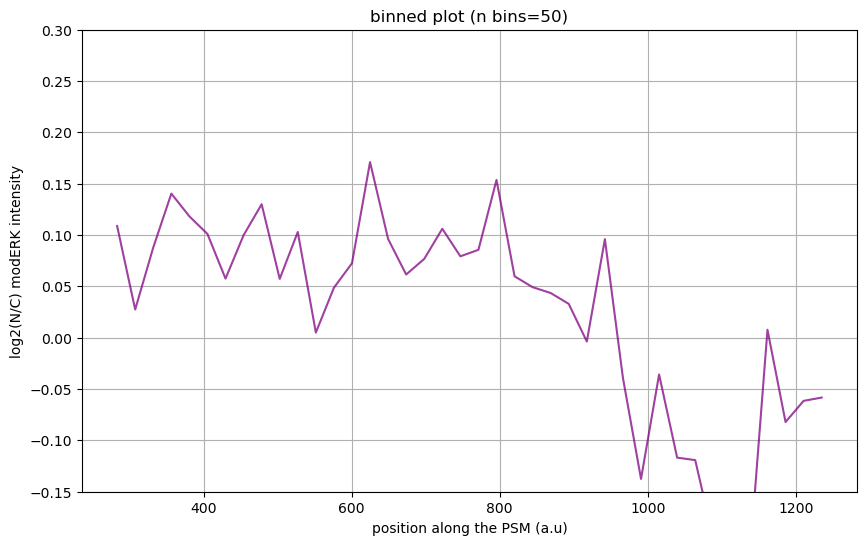

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

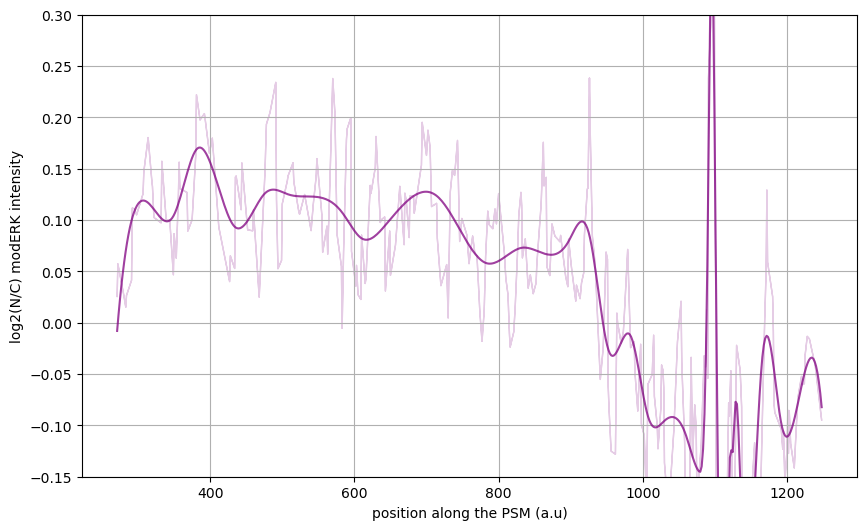

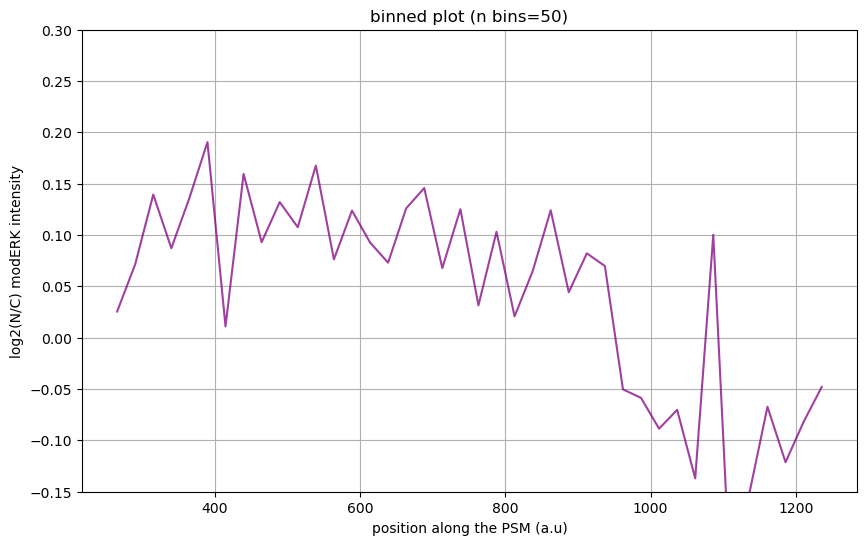

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

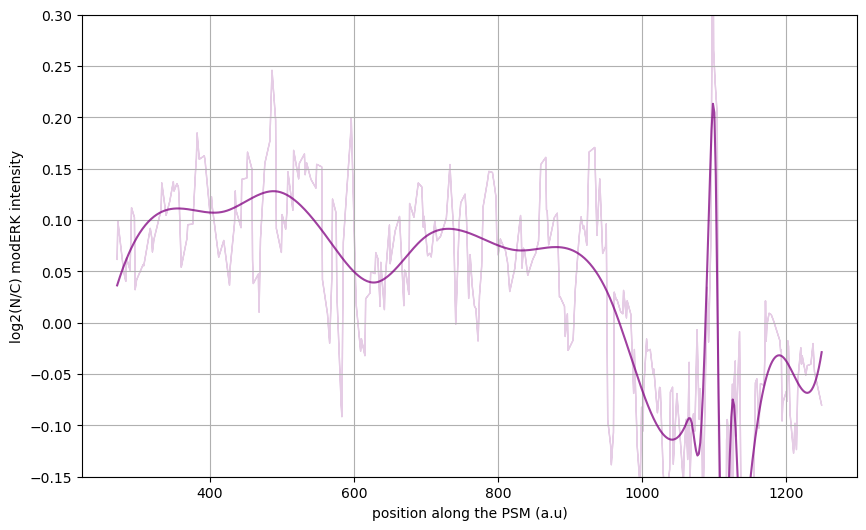

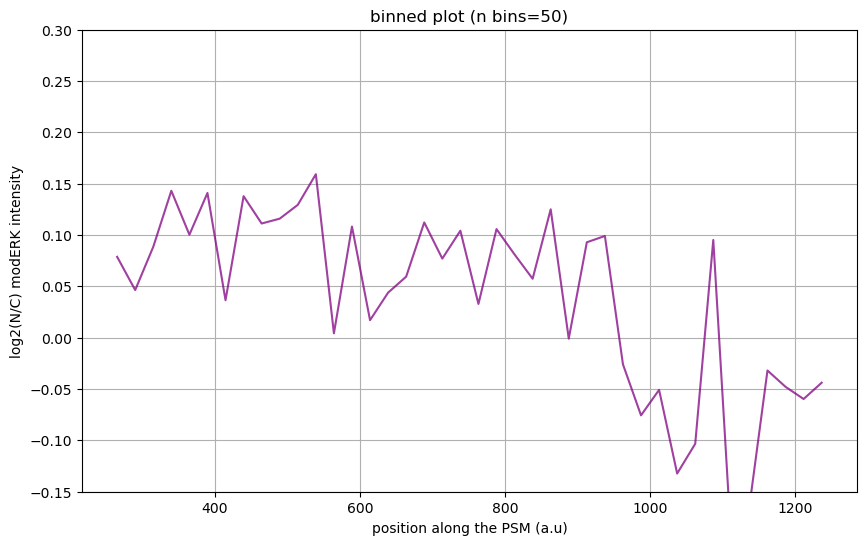

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

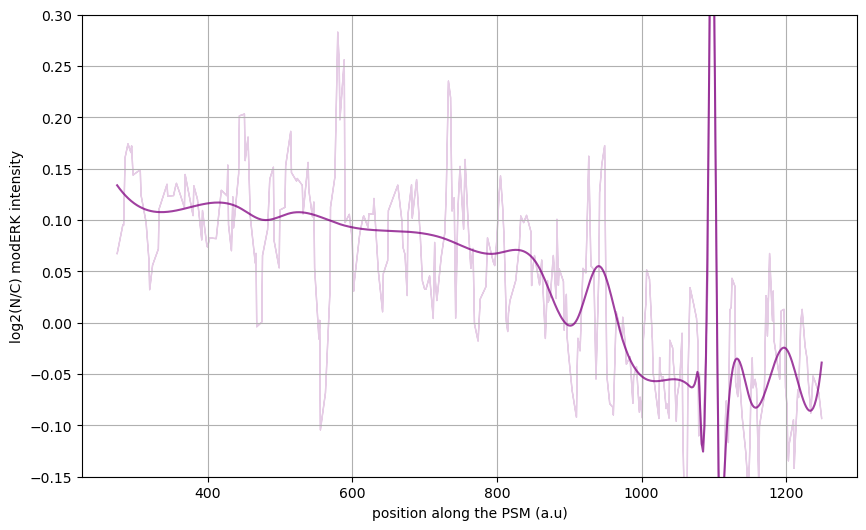

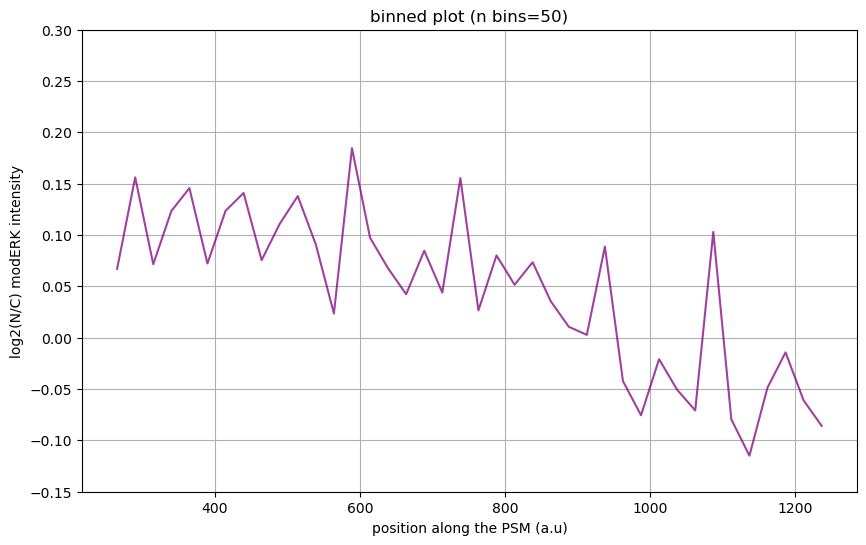

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

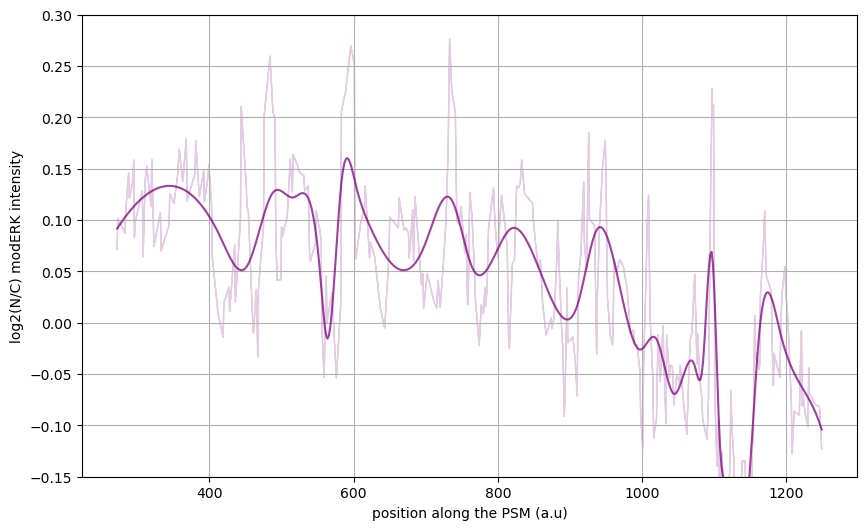

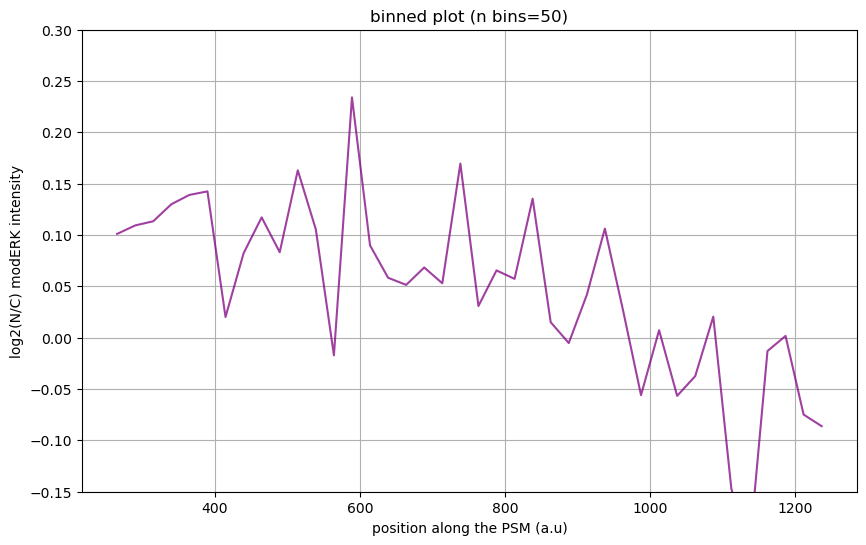

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

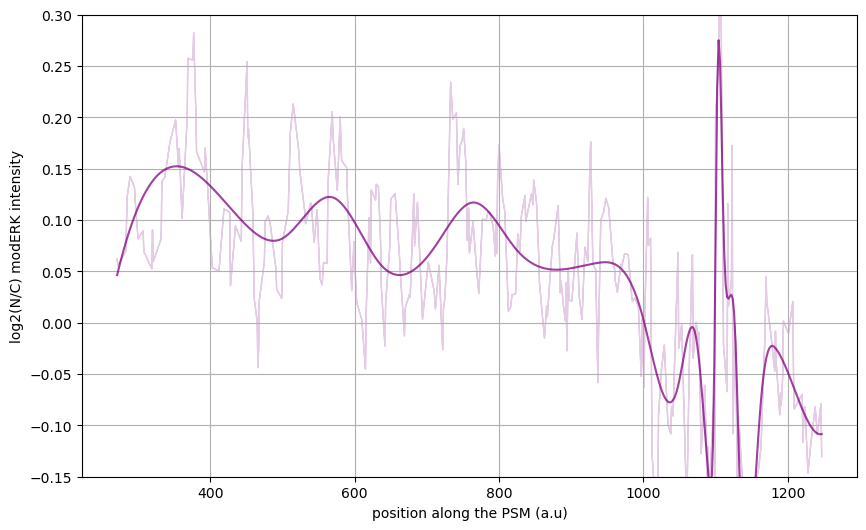

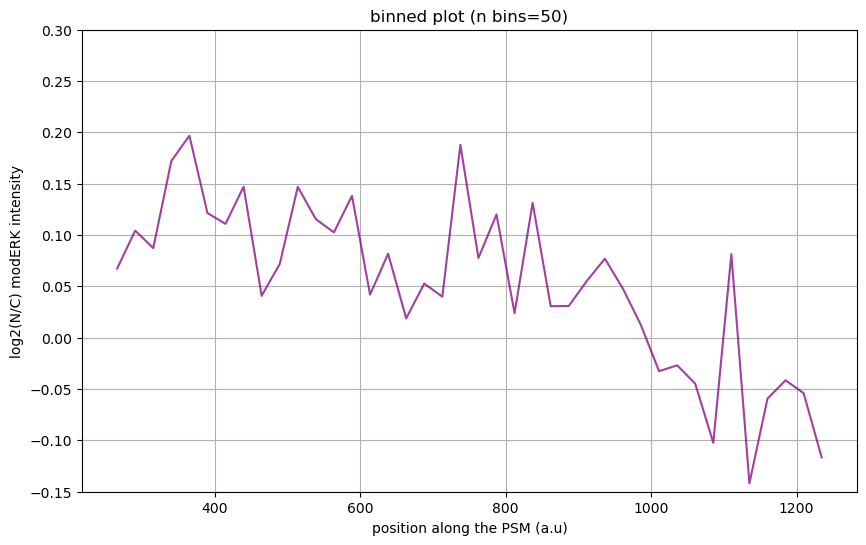

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

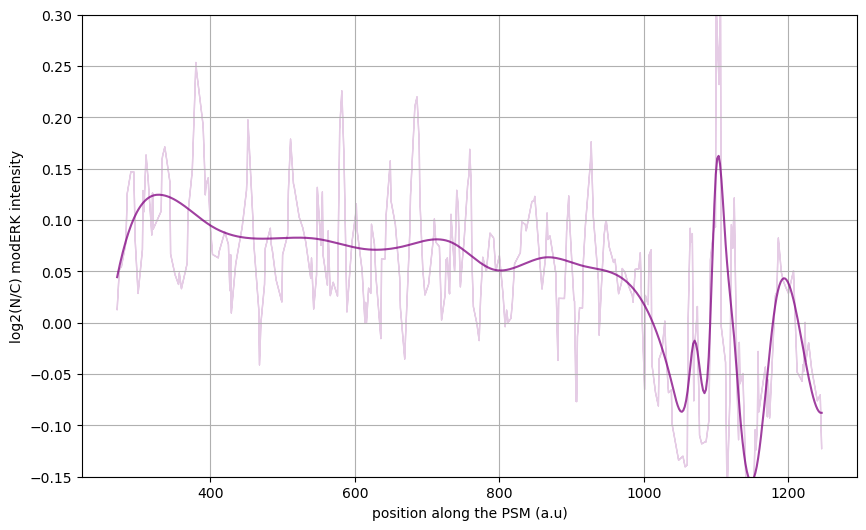

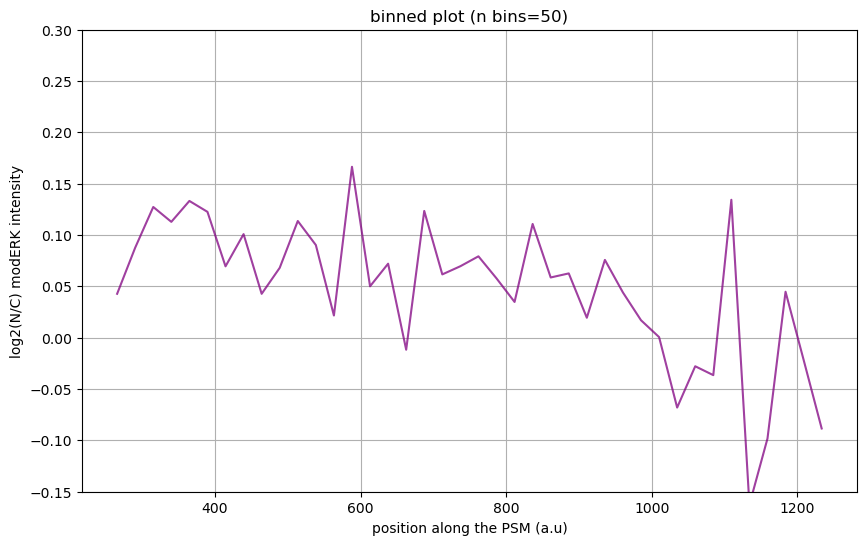

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

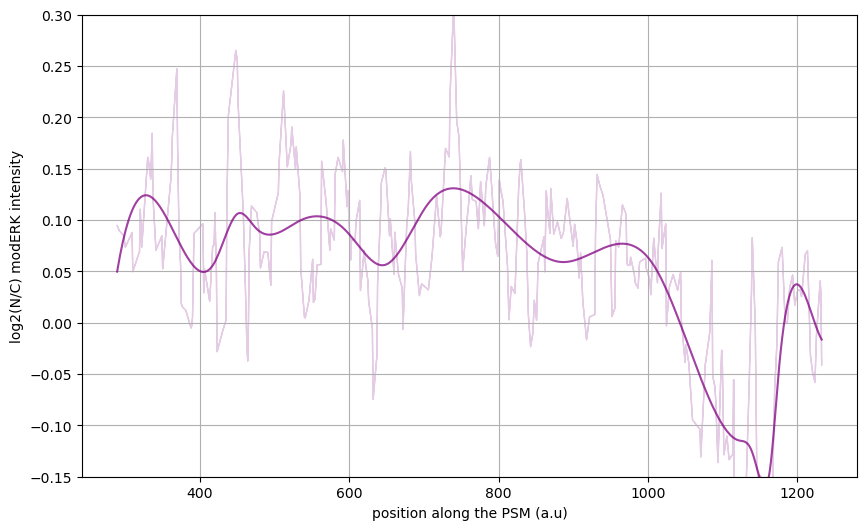

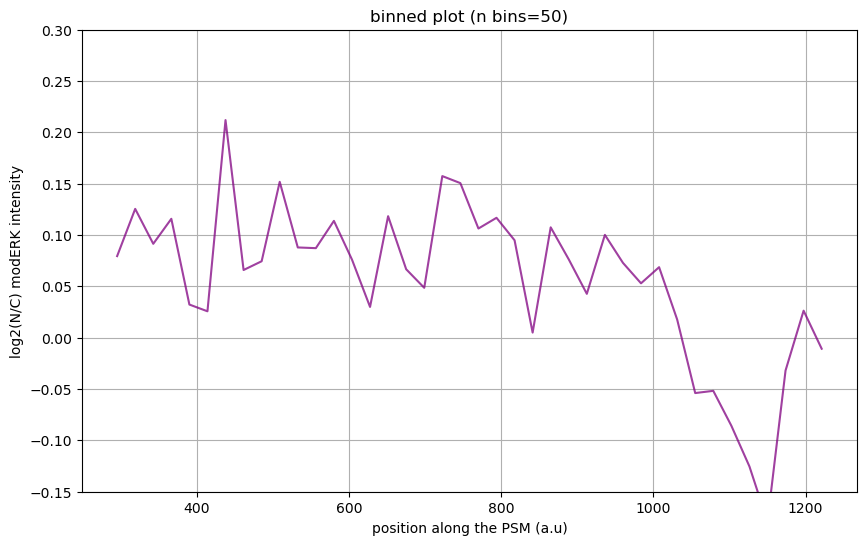

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

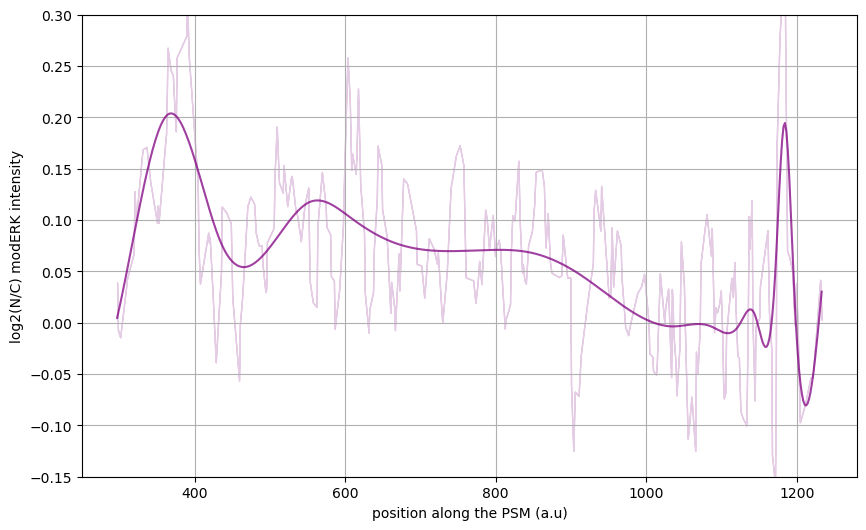

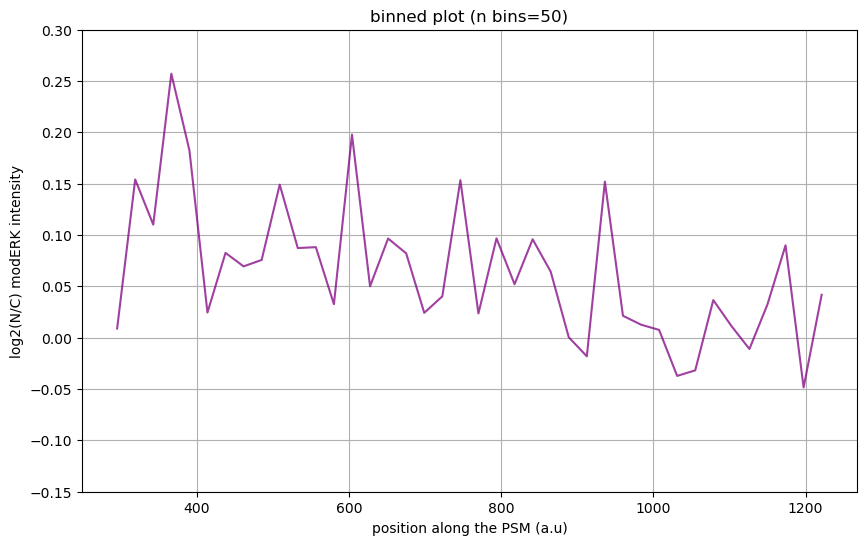

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

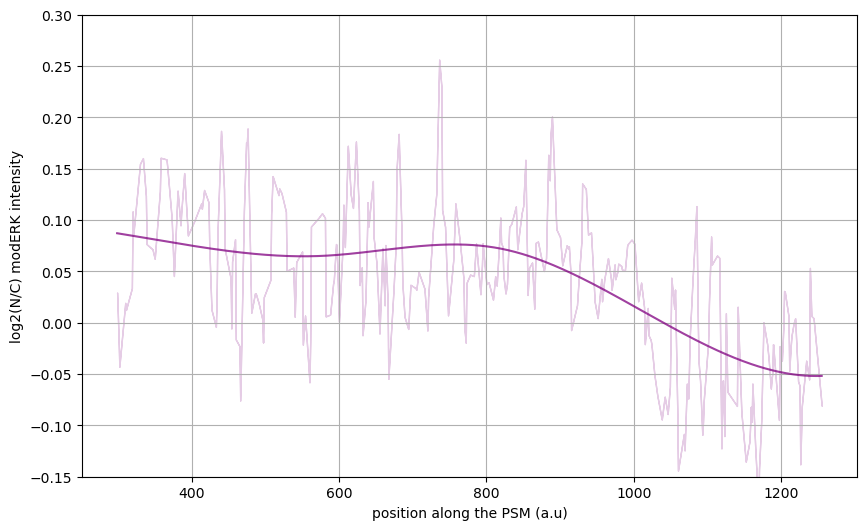

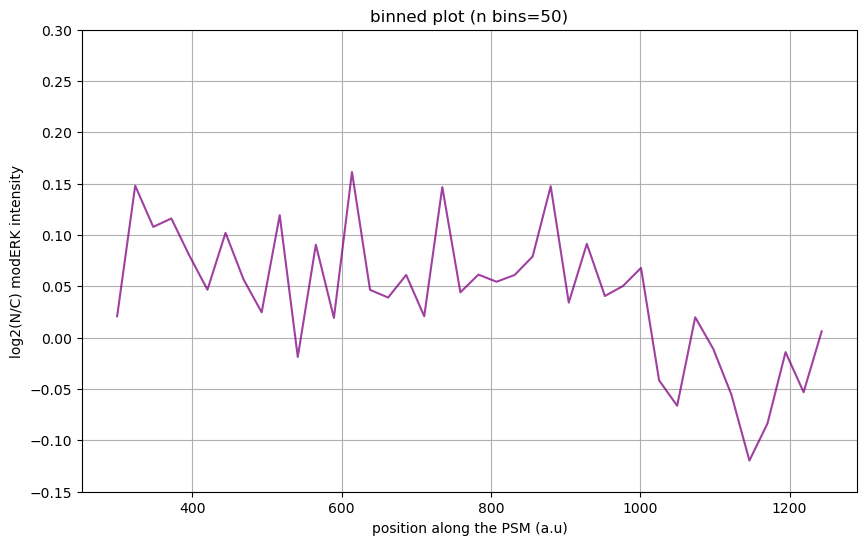

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

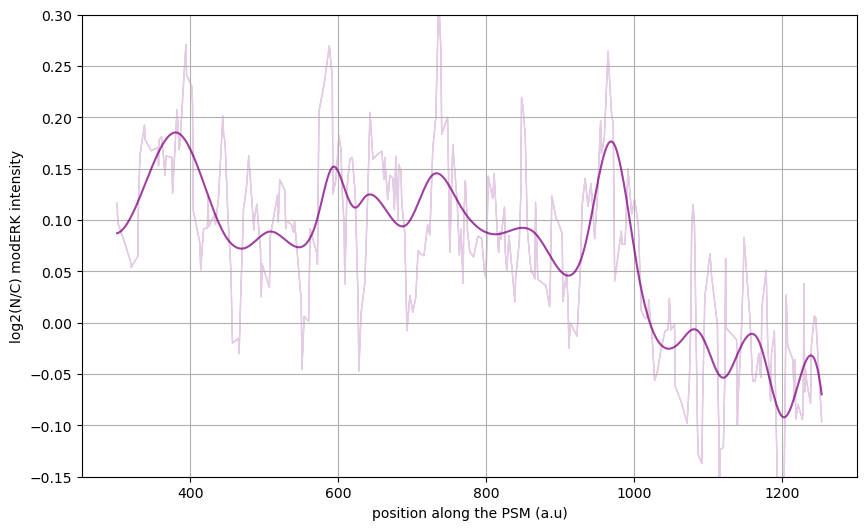

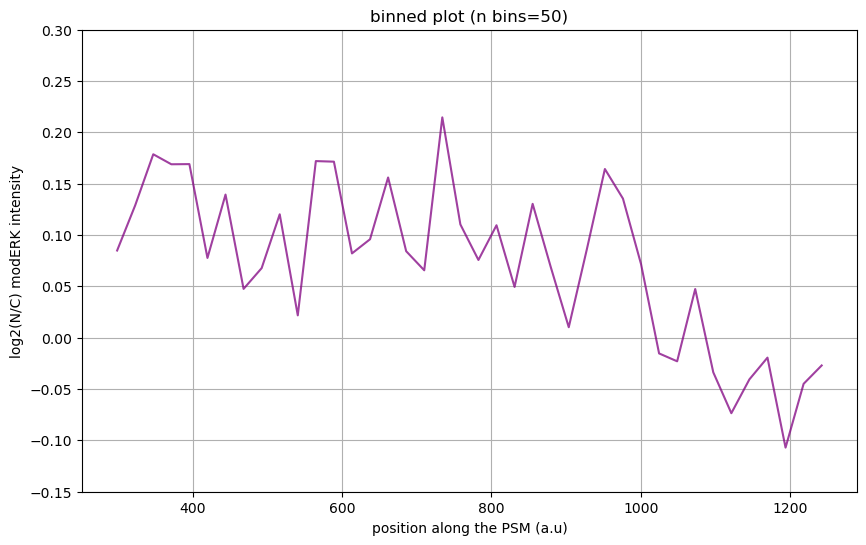

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

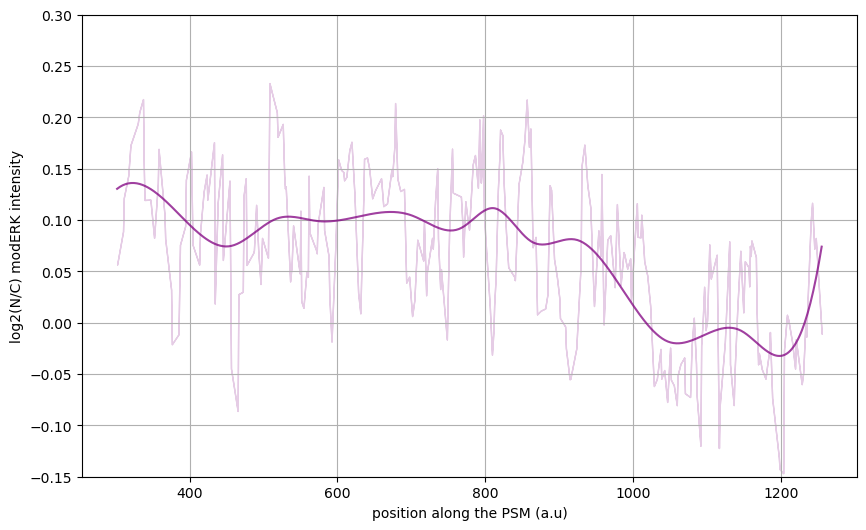

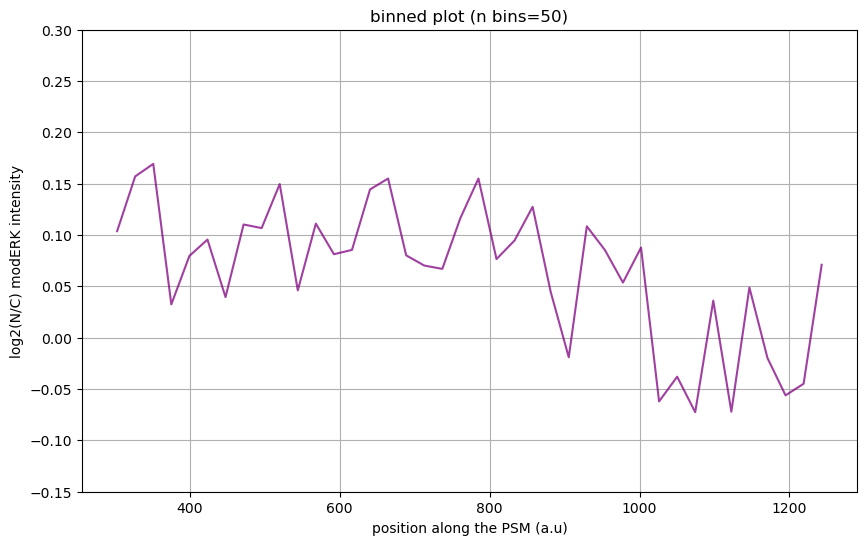

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

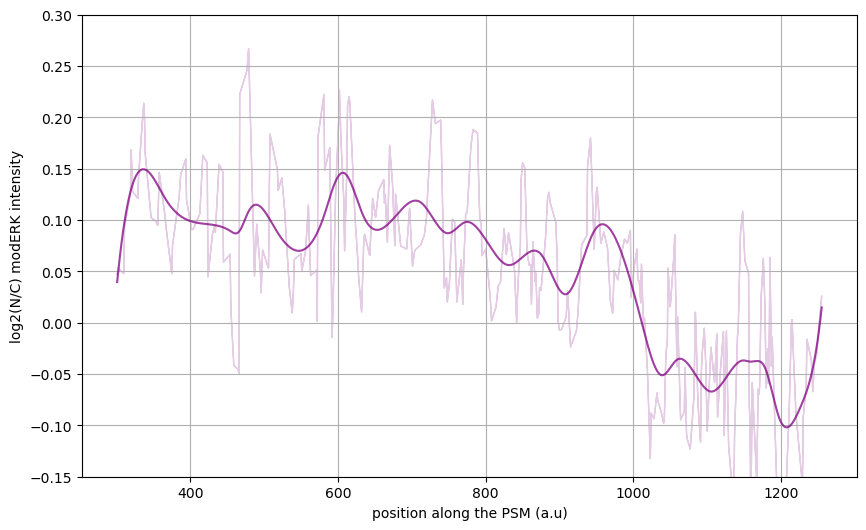

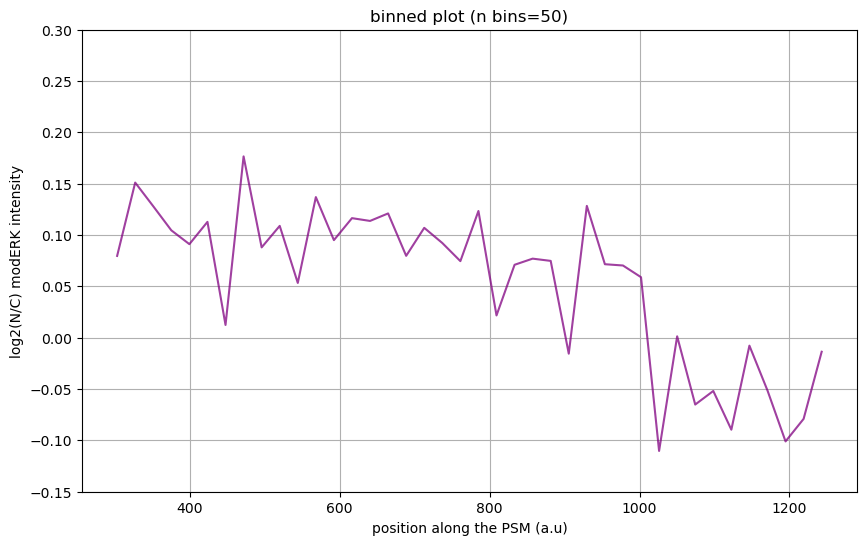

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

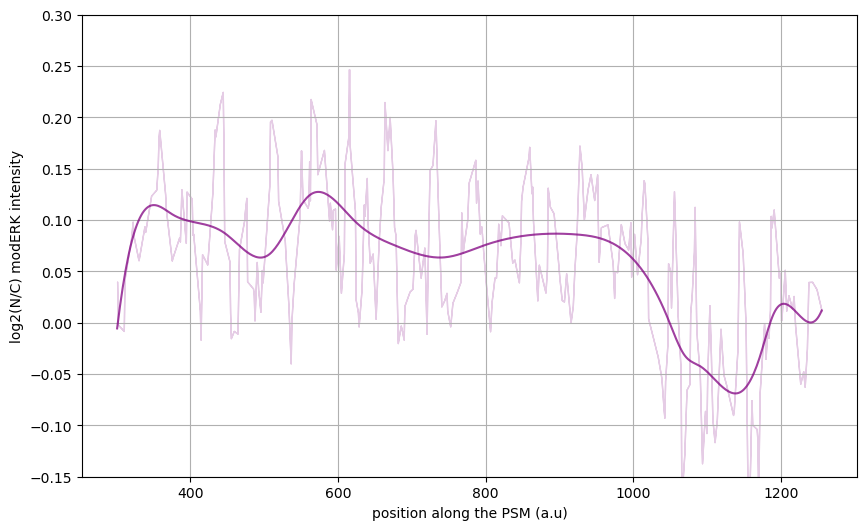

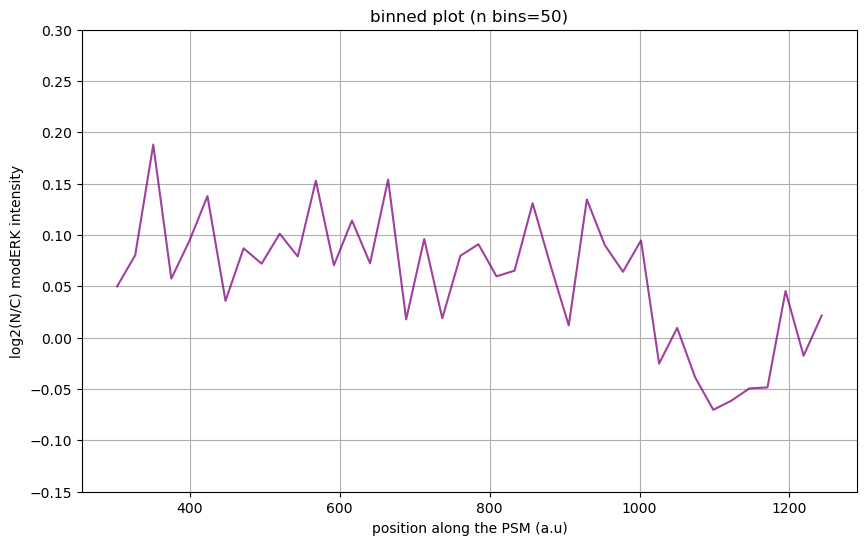

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

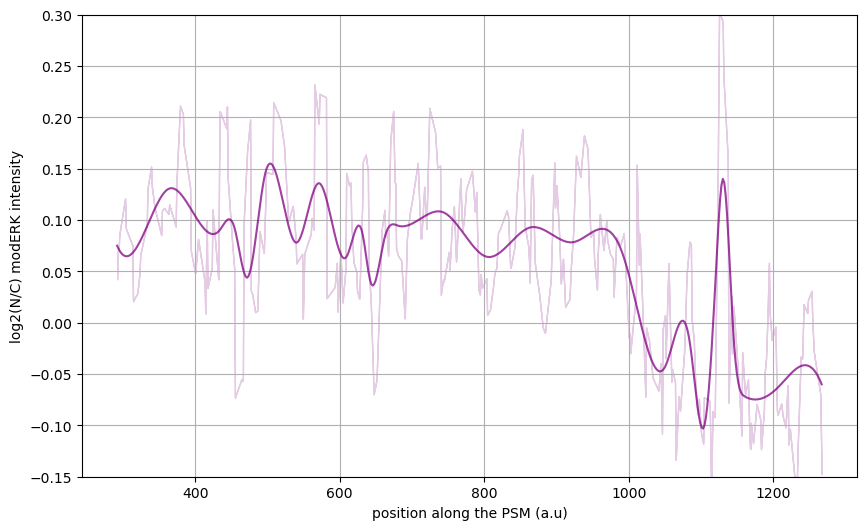

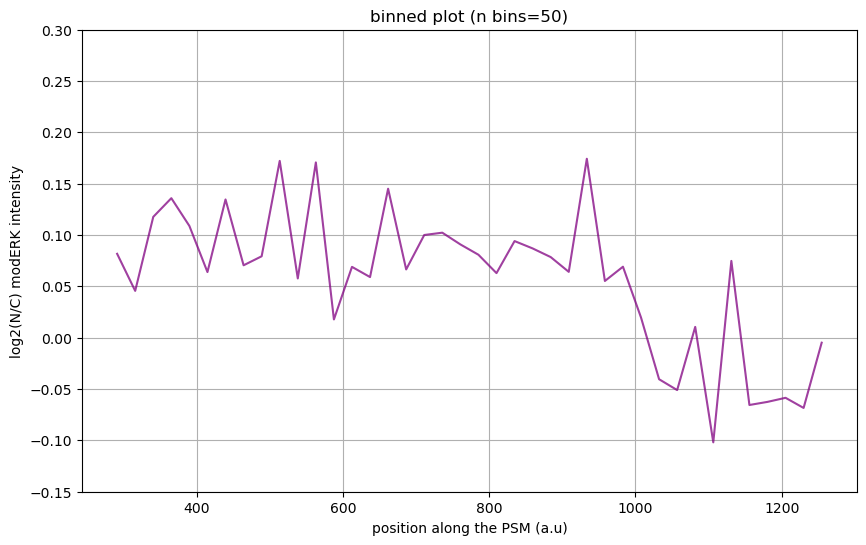

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

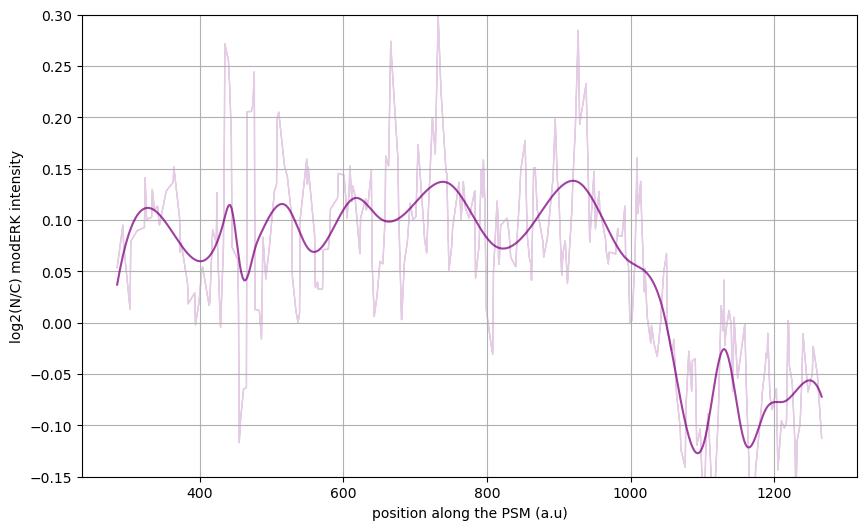

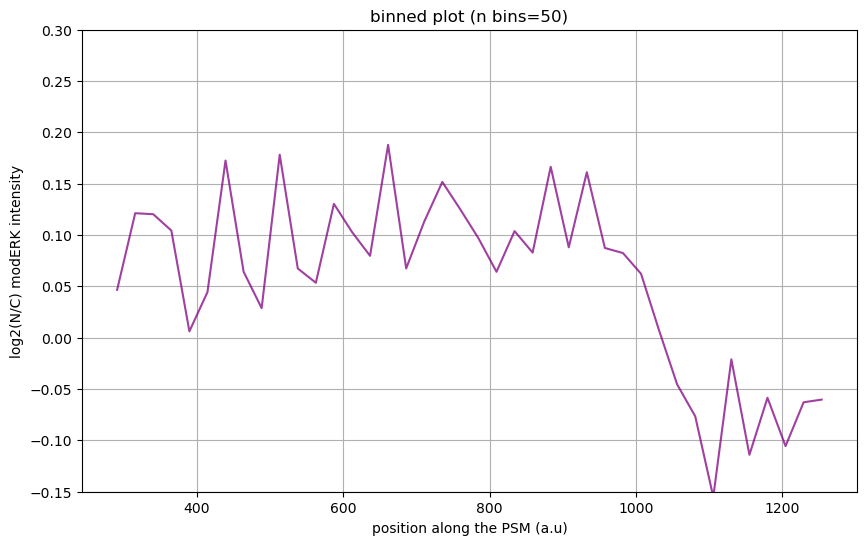

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

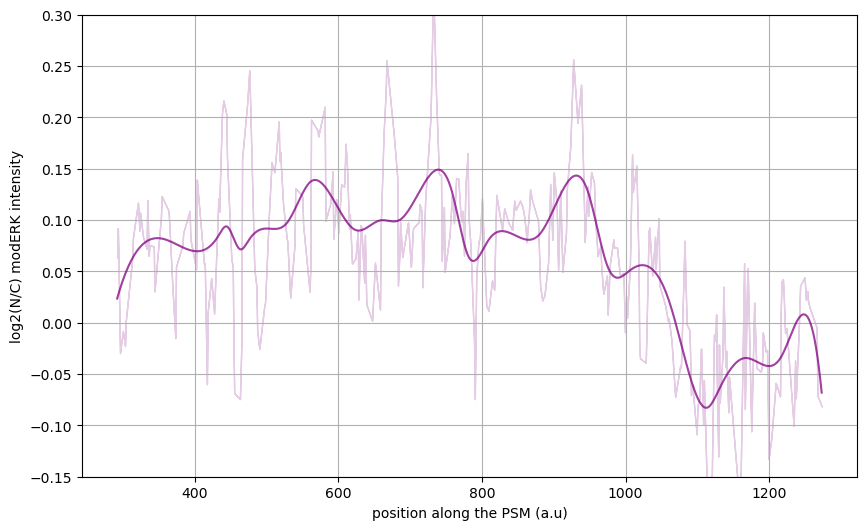

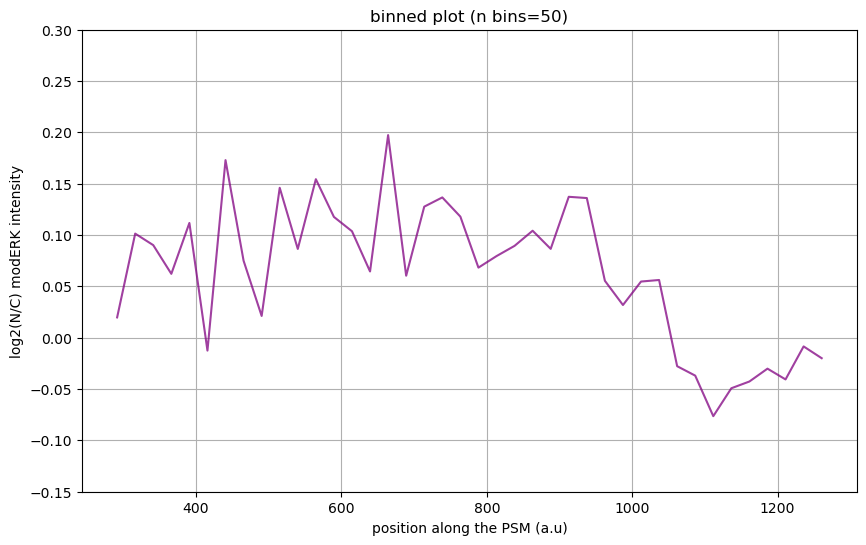

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

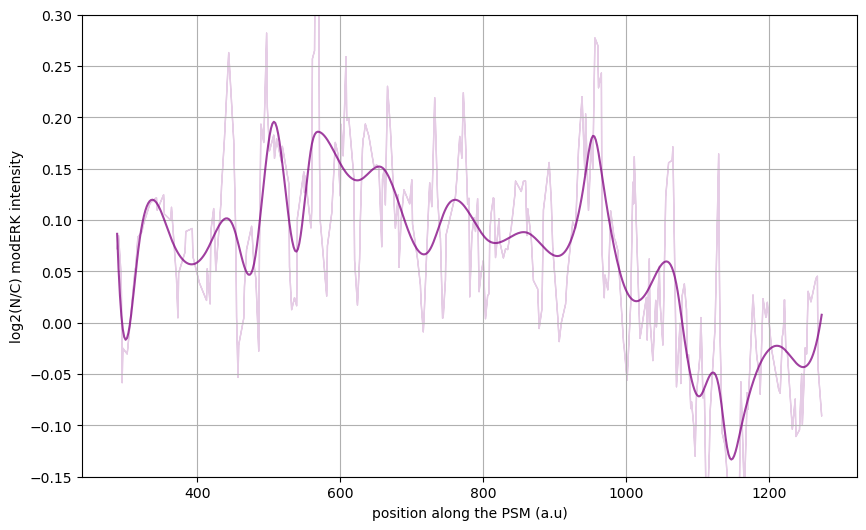

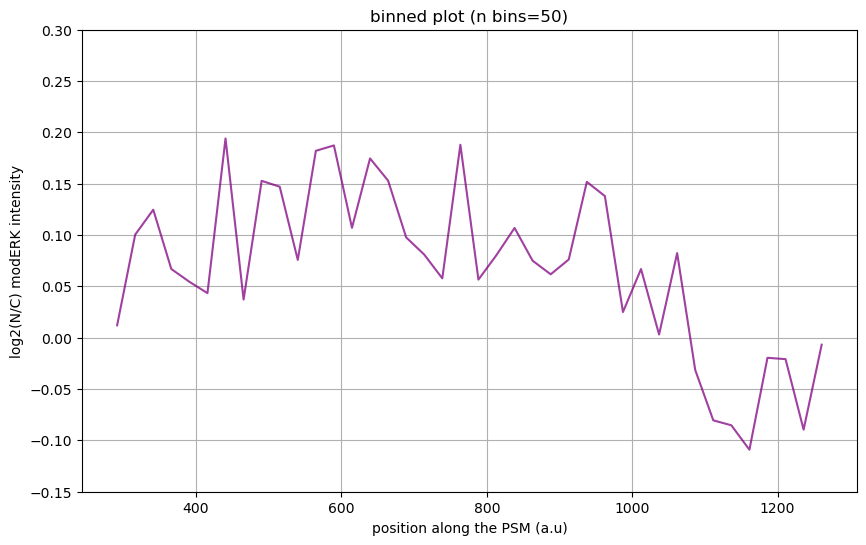

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

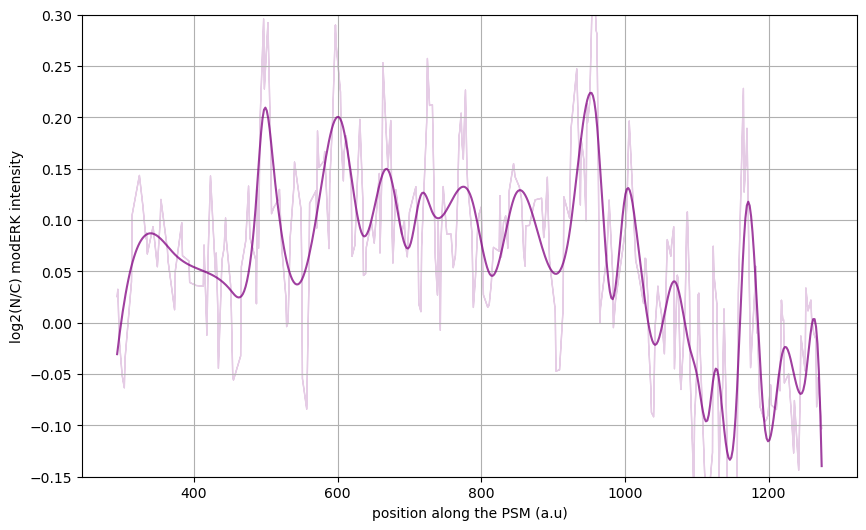

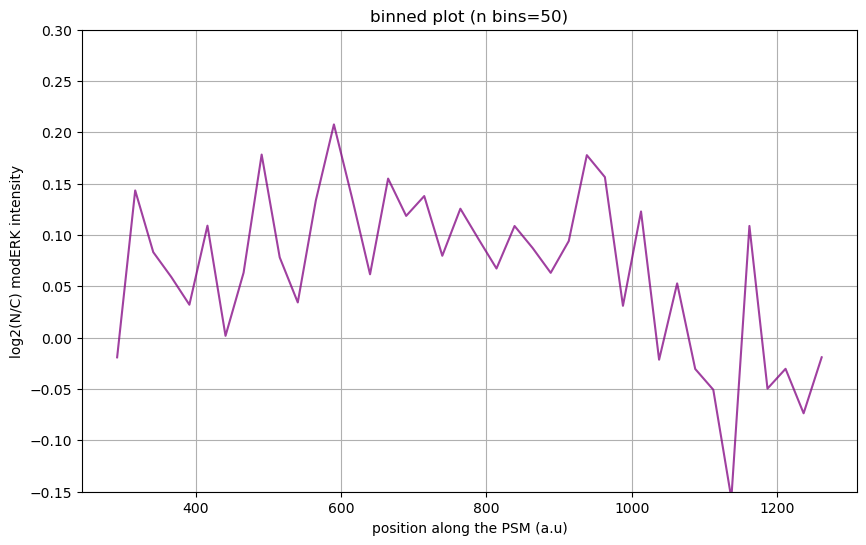

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

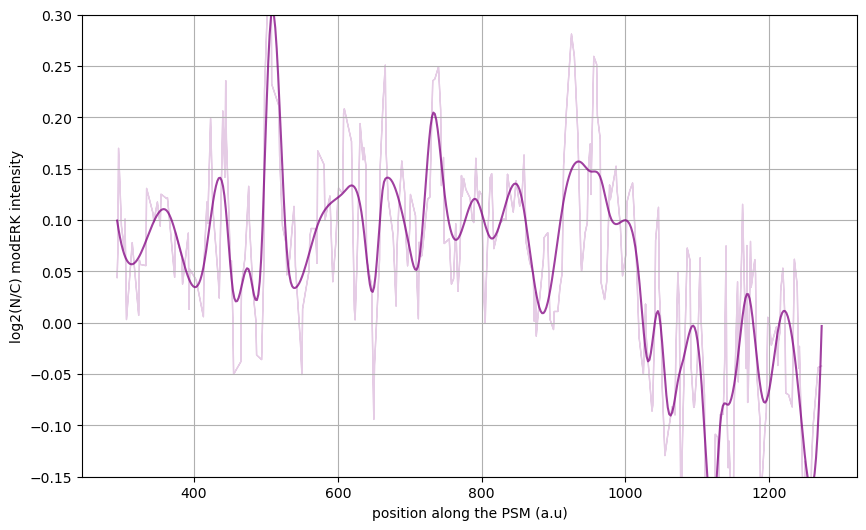

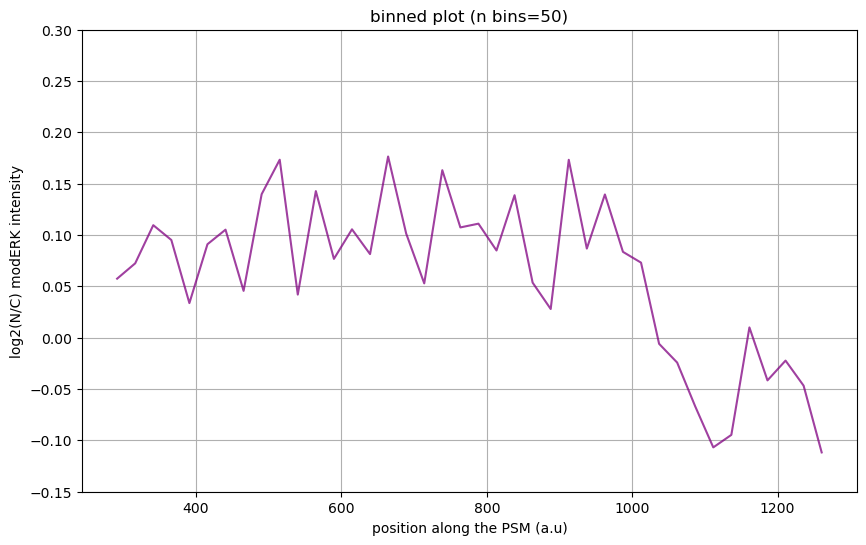

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

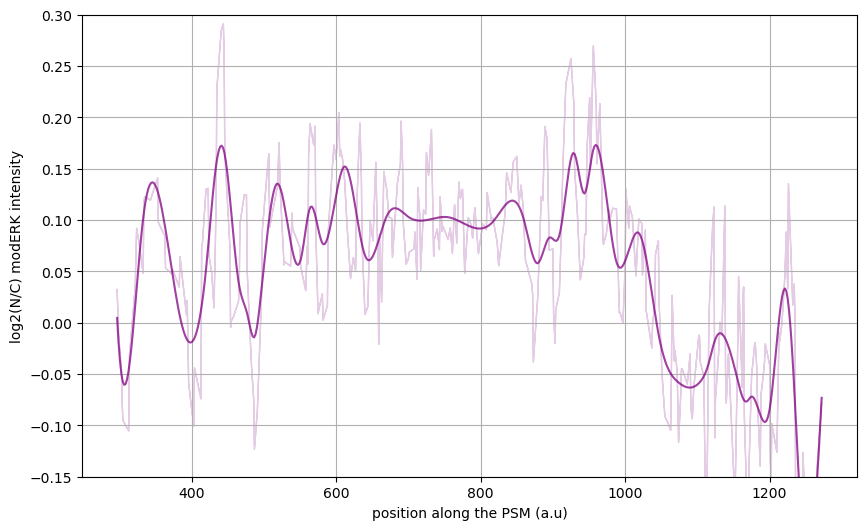

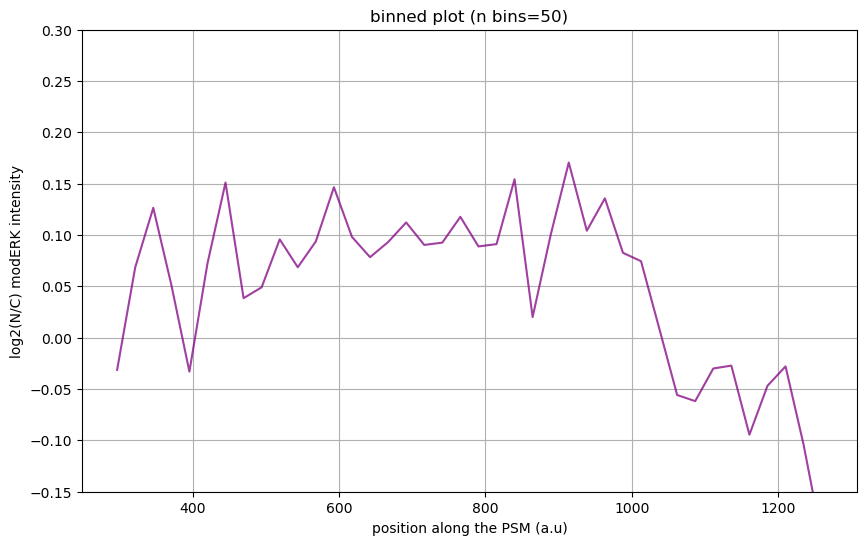

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

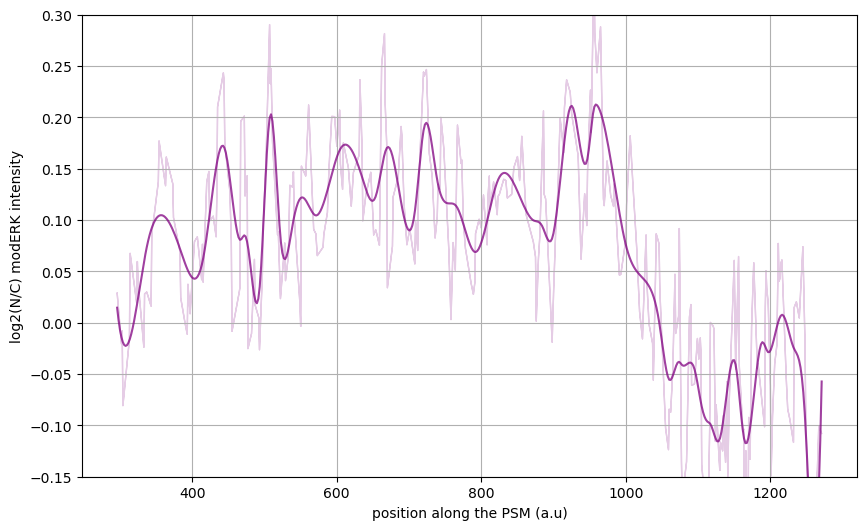

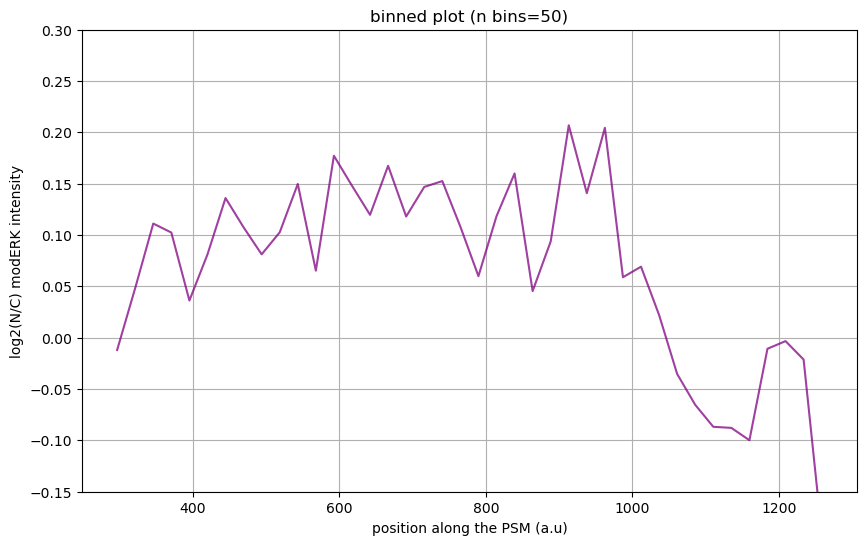

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

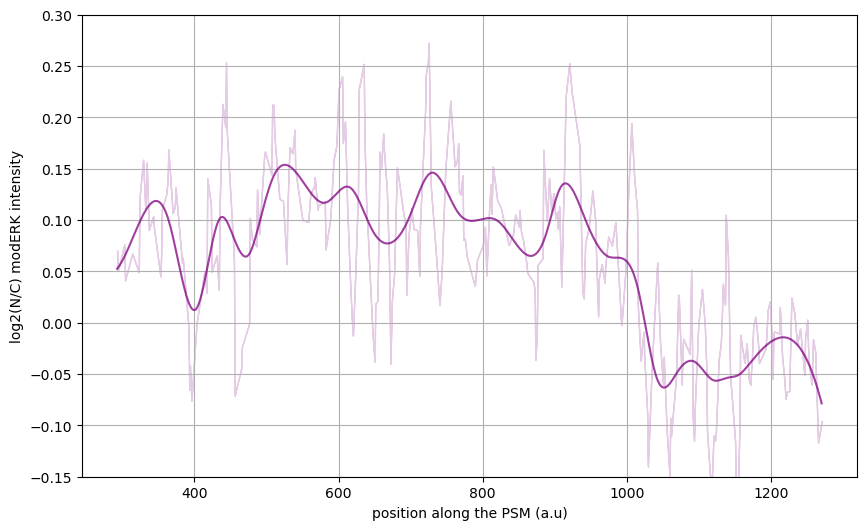

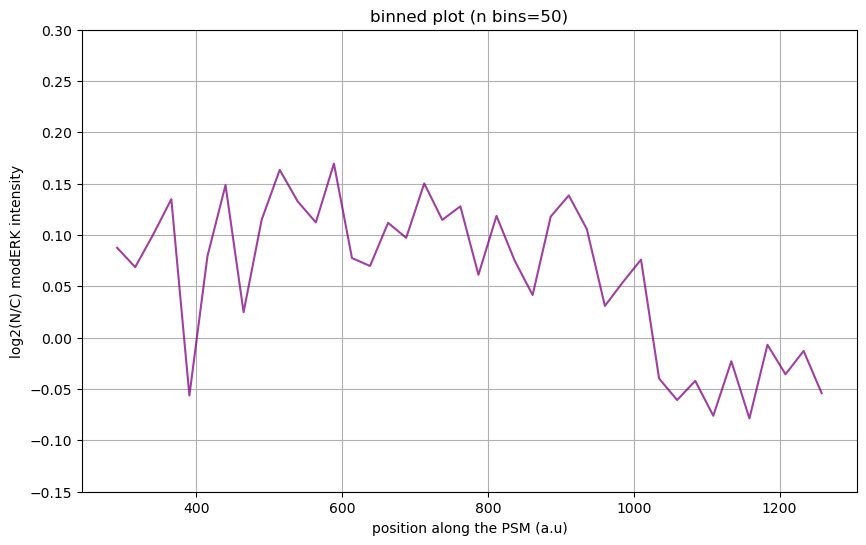

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

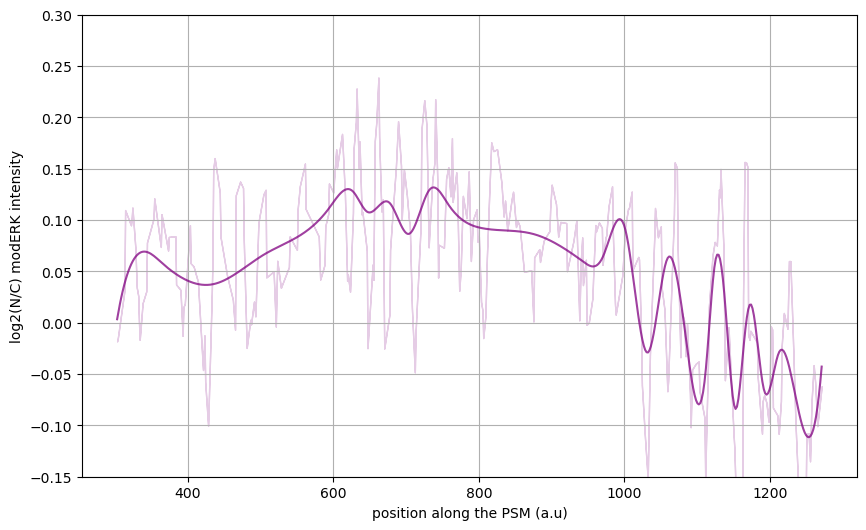

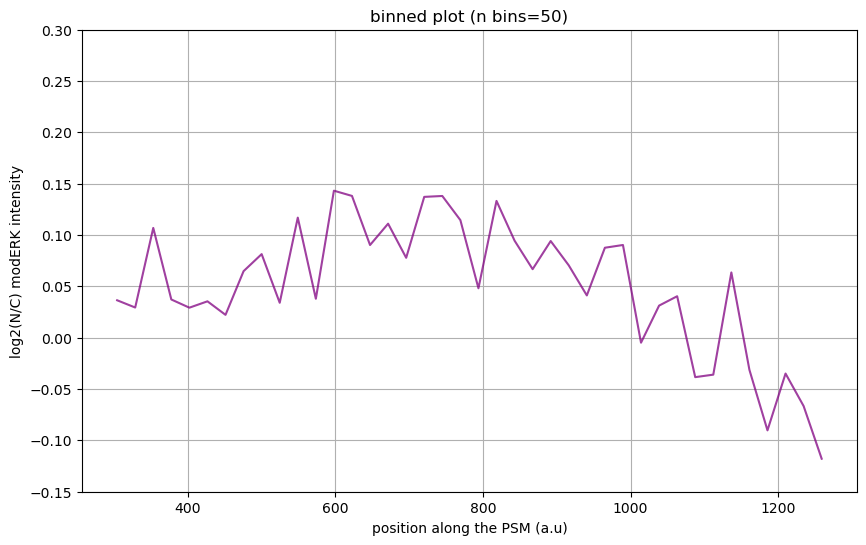

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

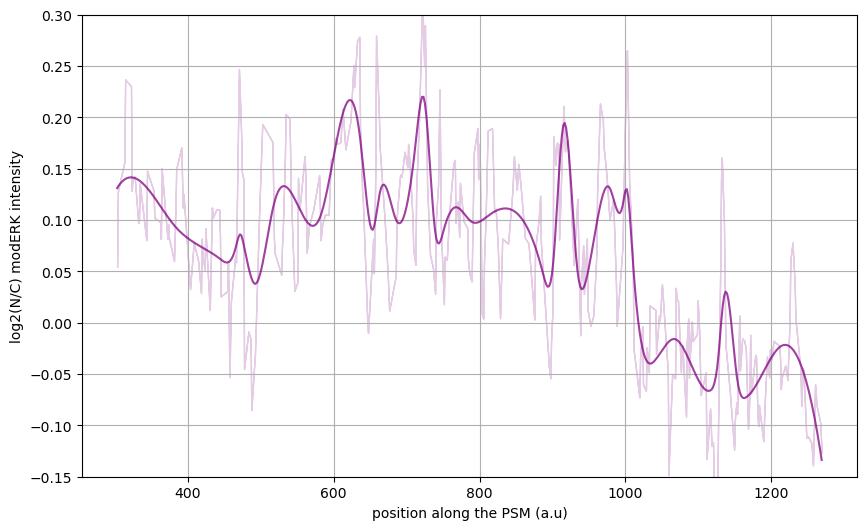

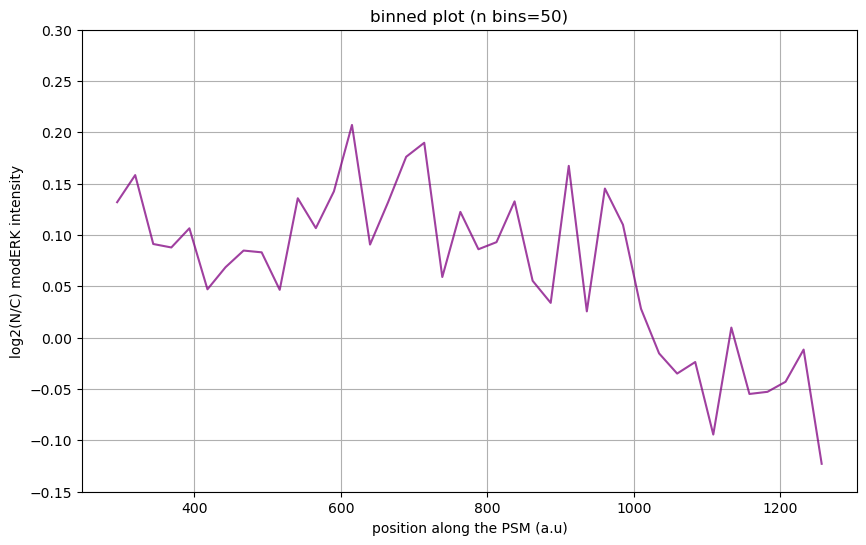

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

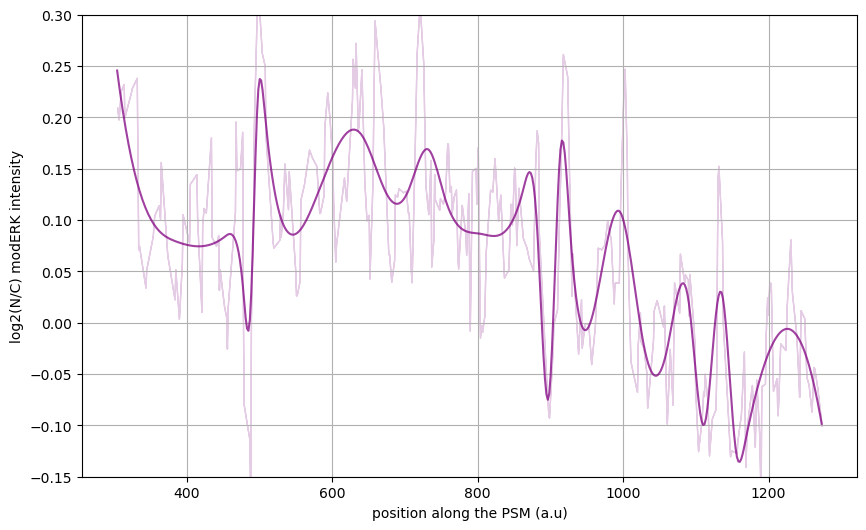

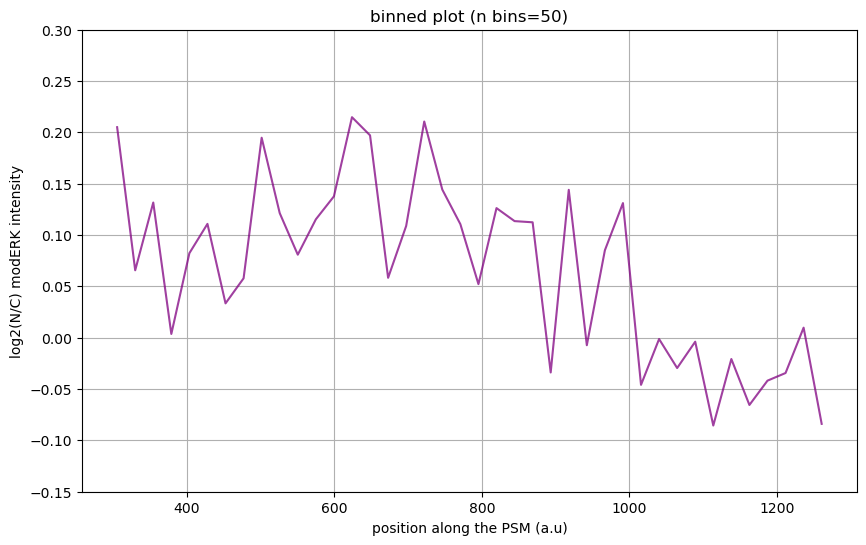

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

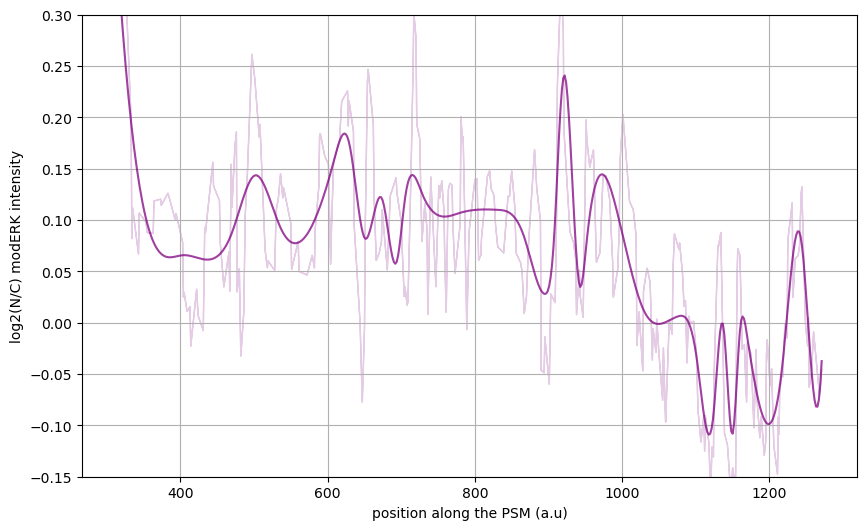

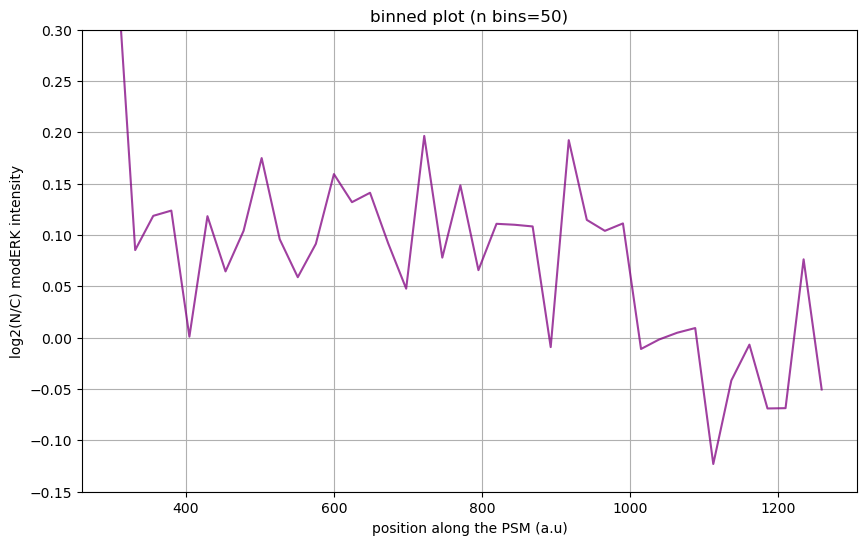

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

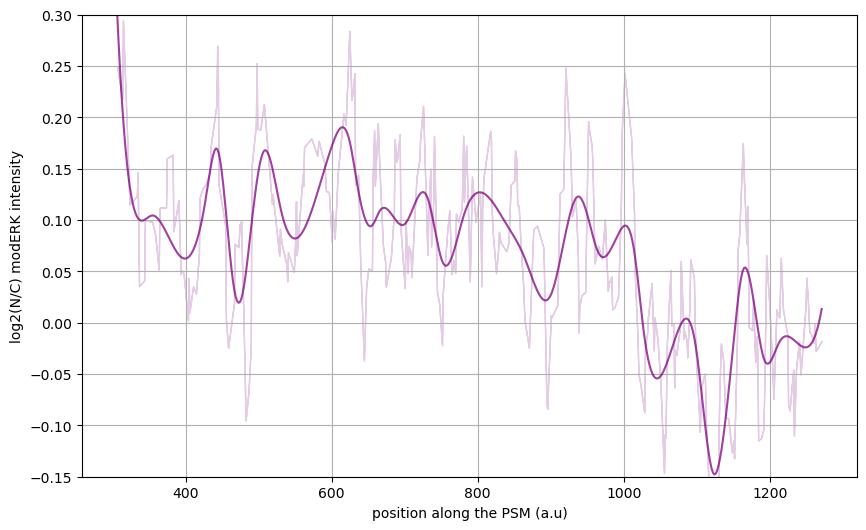

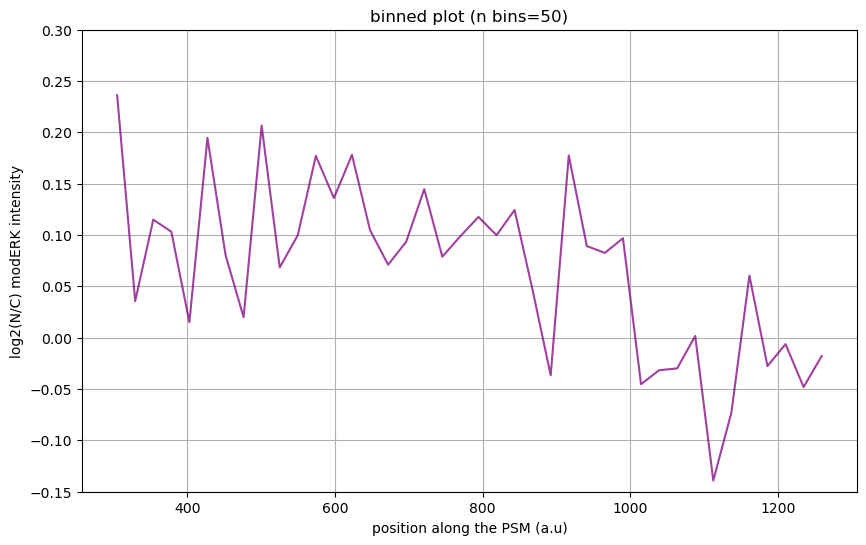

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

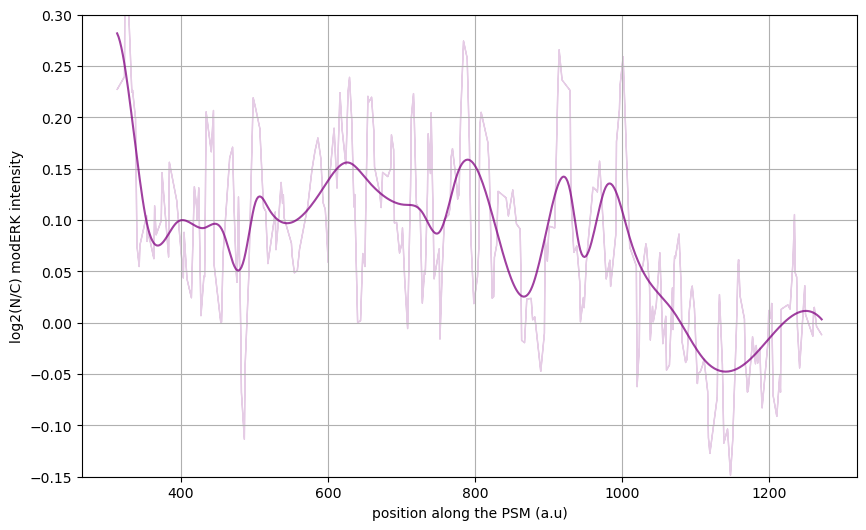

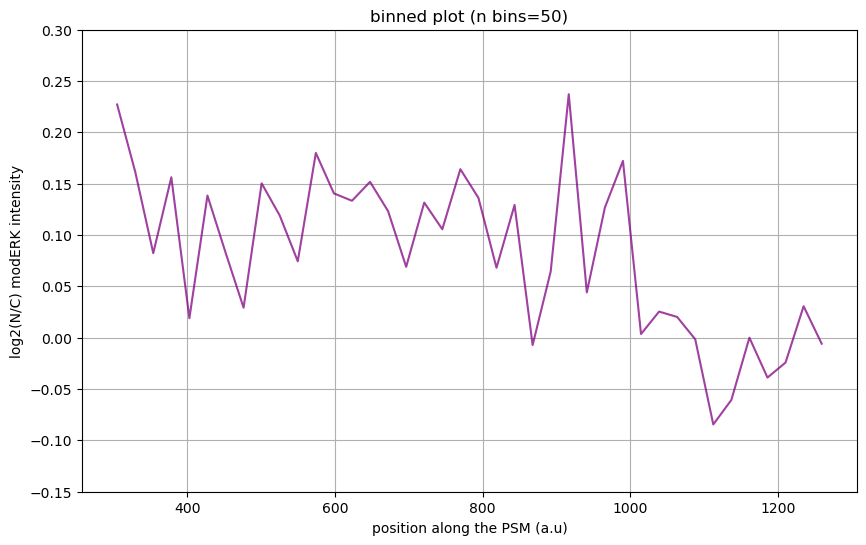

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

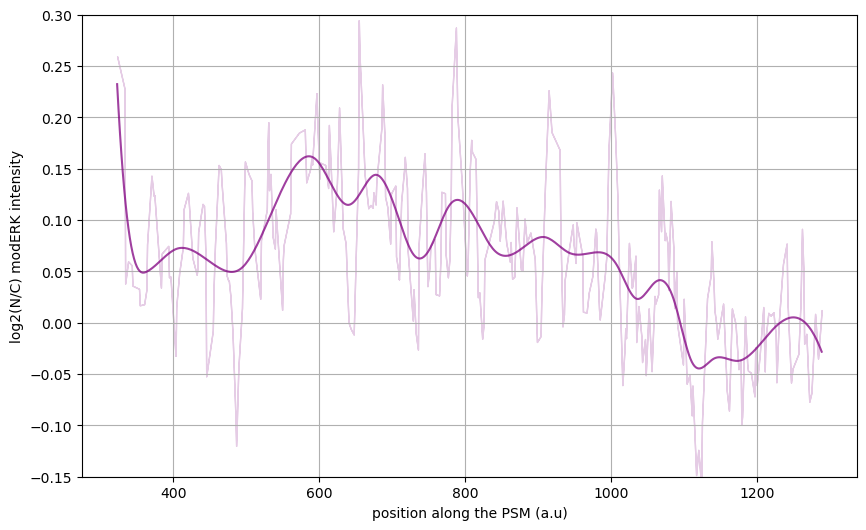

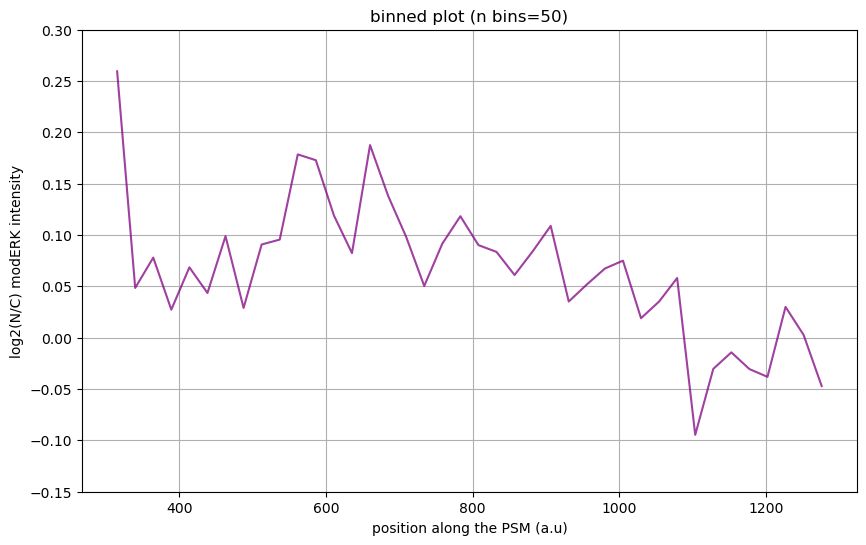

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

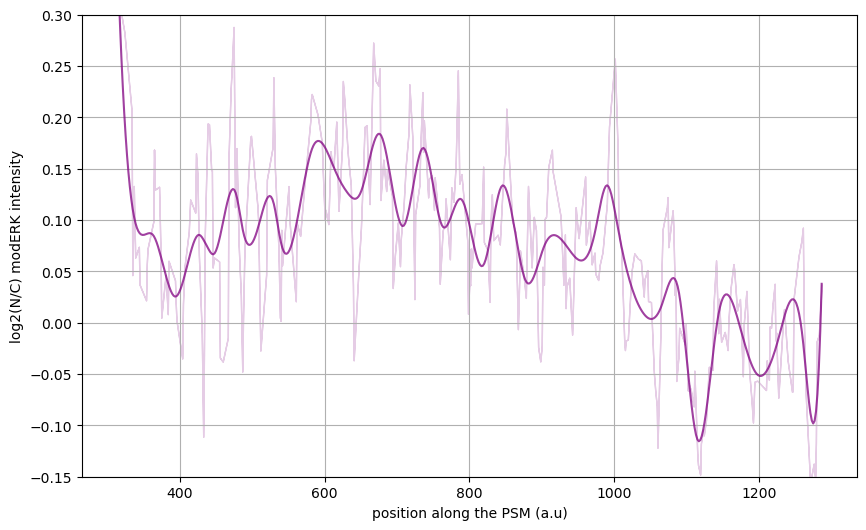

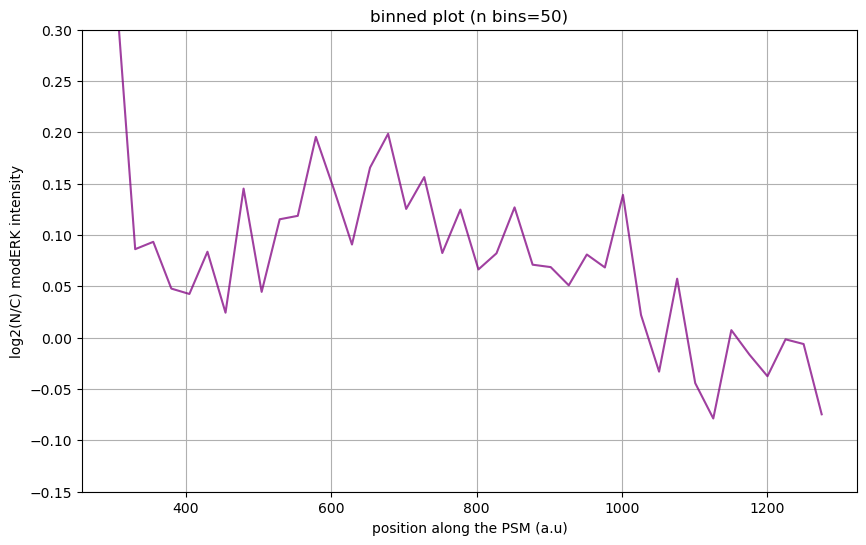

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

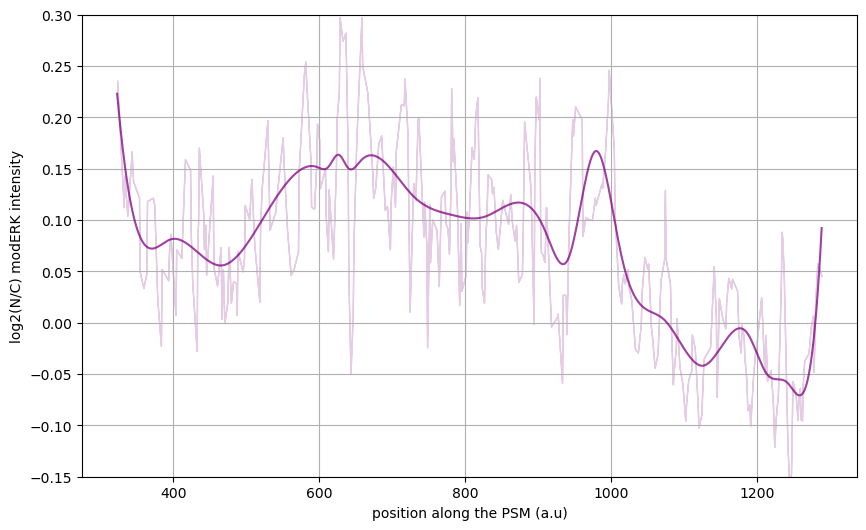

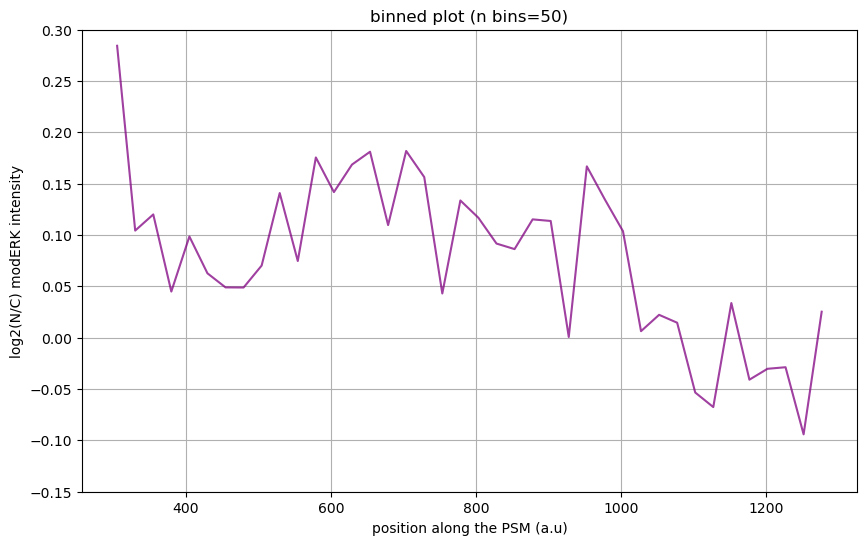

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

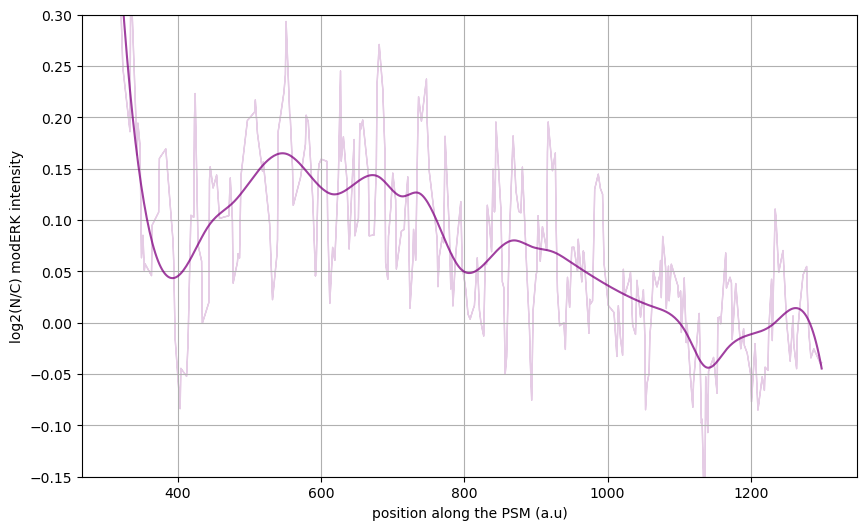

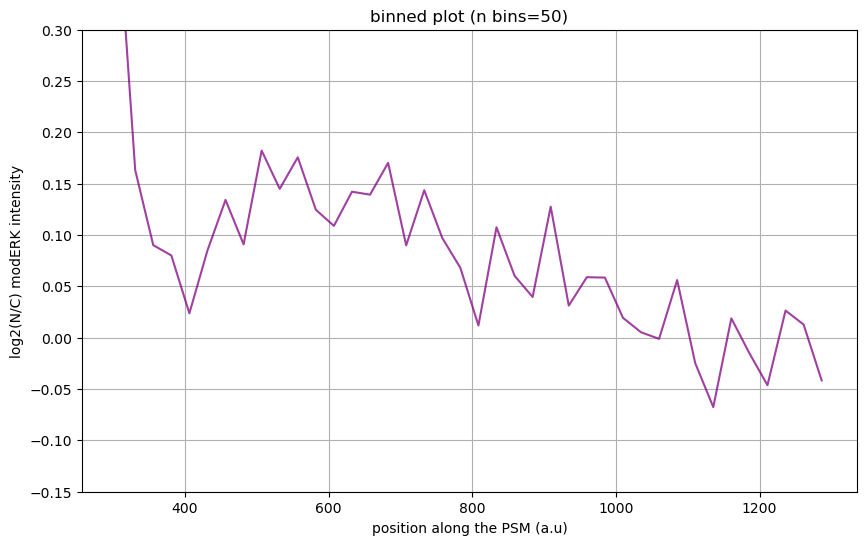

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

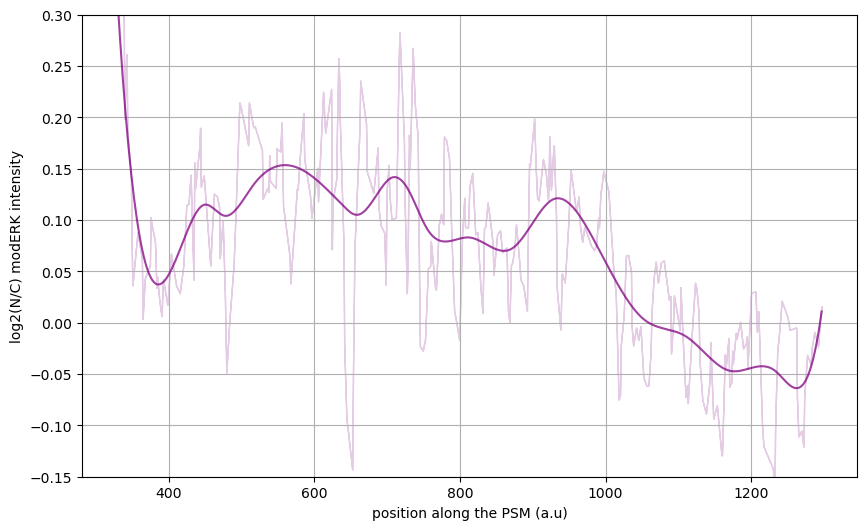

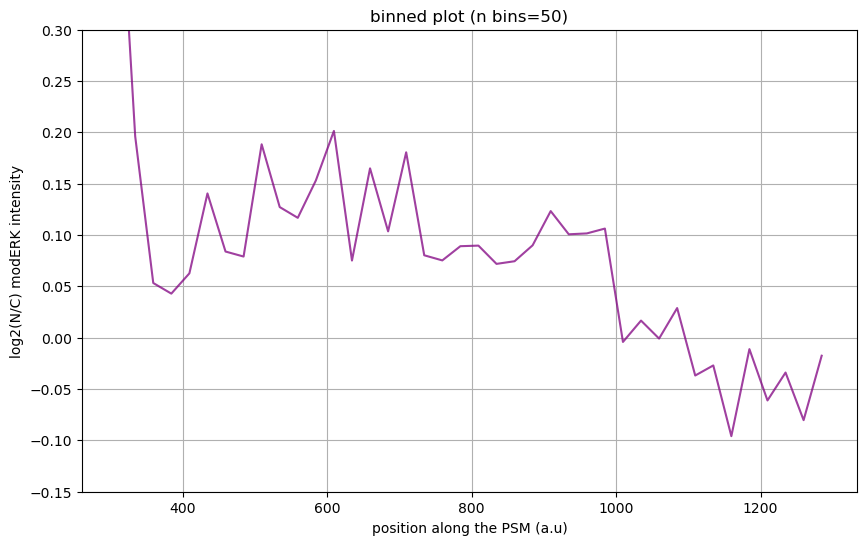

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

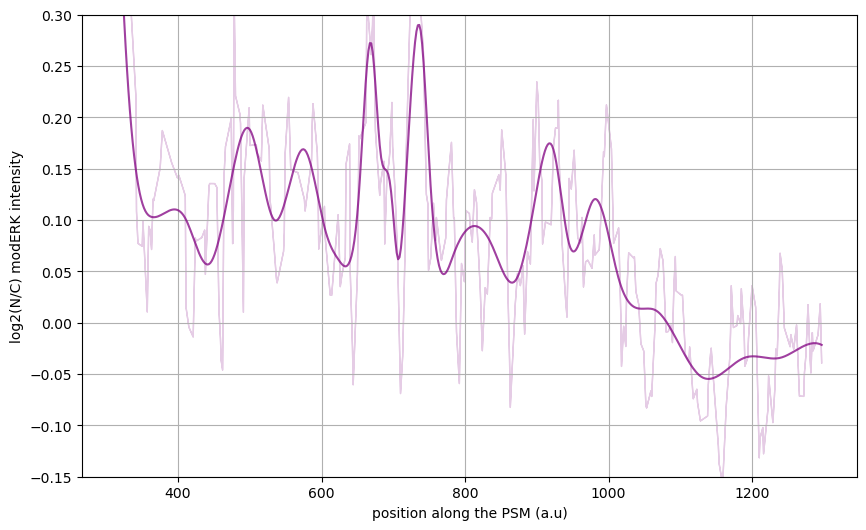

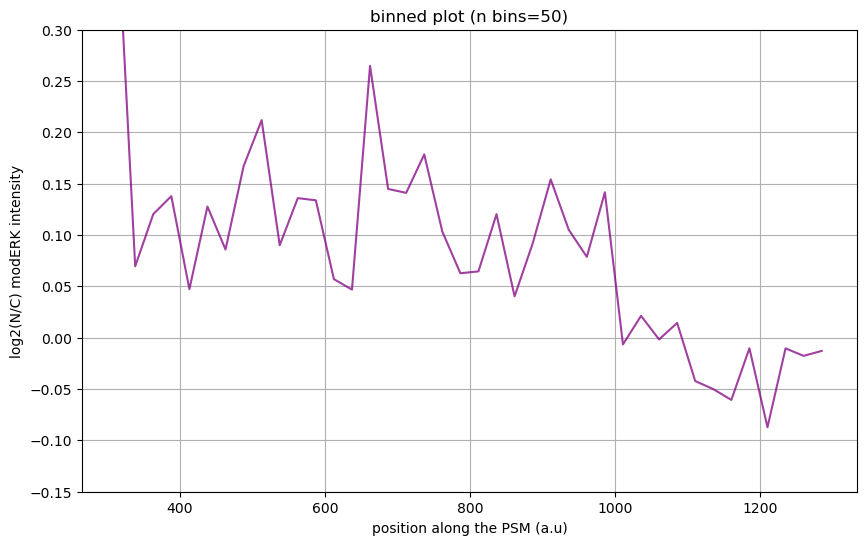

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

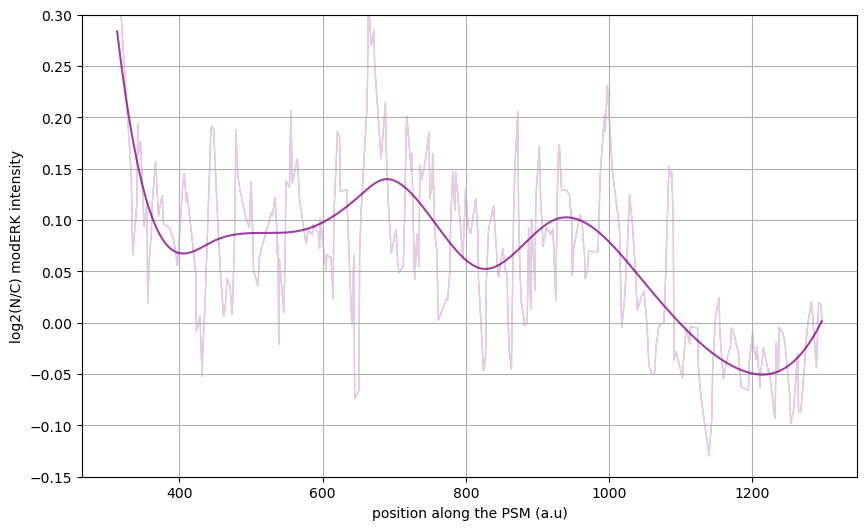

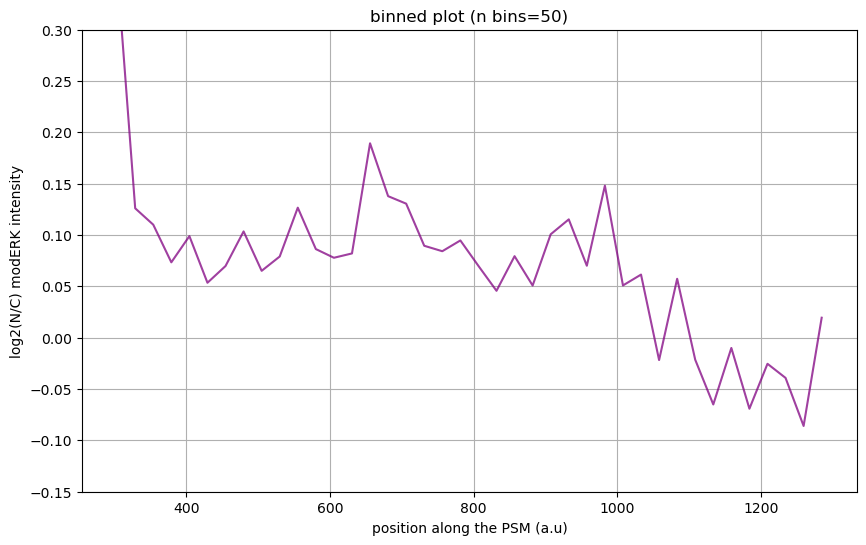

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

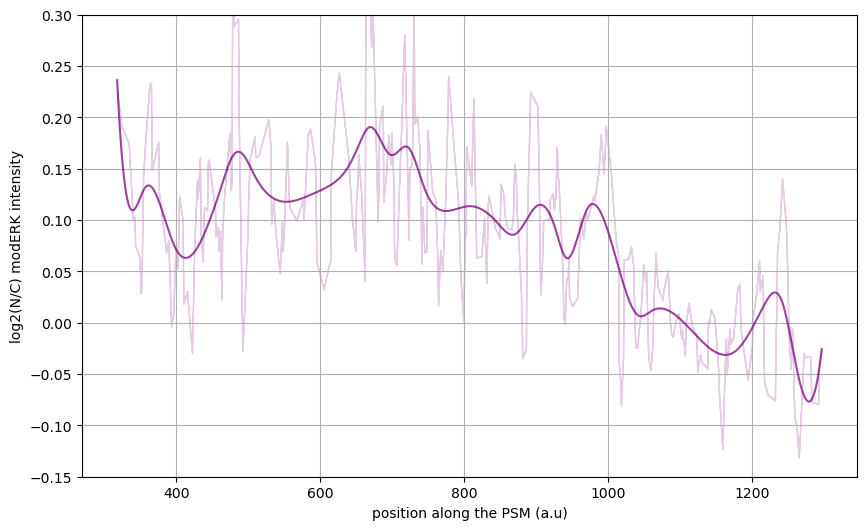

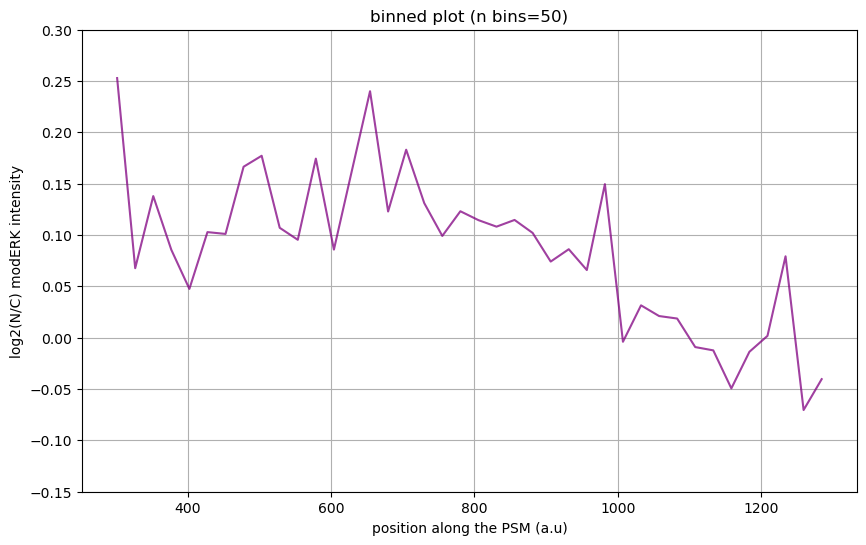

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

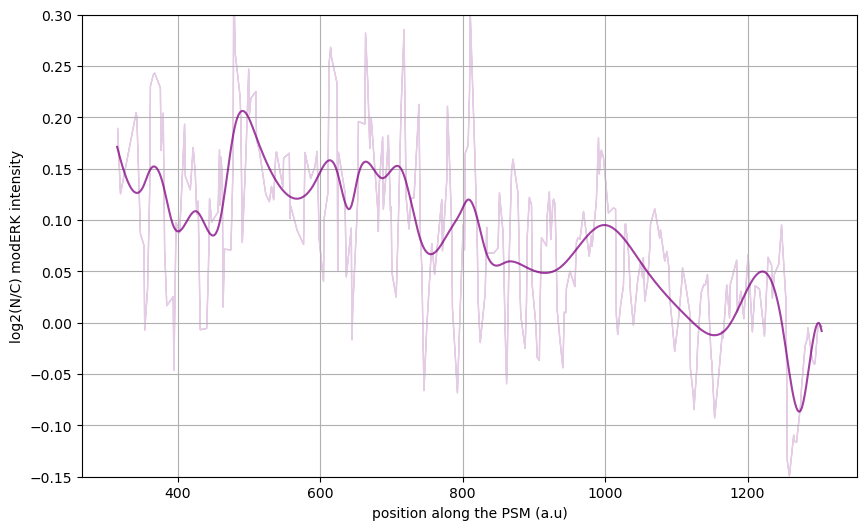

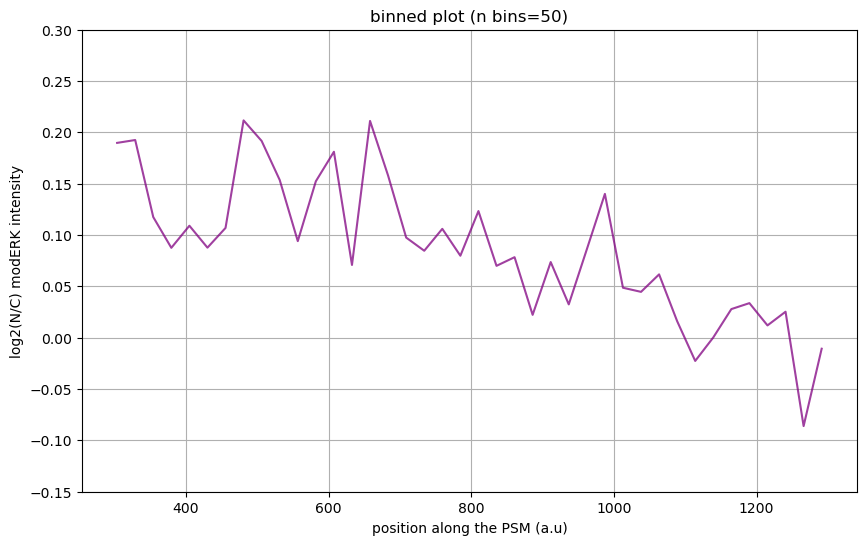

Saving 246 PSM ratios for timepoint 0
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_0.pkl
Saving 250 PSM ratios for timepoint 1
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_1.pkl
Saving 241 PSM ratios for timepoint 2
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_2.pkl
Saving 248 PSM ratios for timepoint 3
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_3.pkl
Saving 254 PSM ratios for timepoint 4
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/ratios_psm_timepoint_4.pkl
Saving 239 PSM ratios for timepoint 5
Saved ratios to E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ra

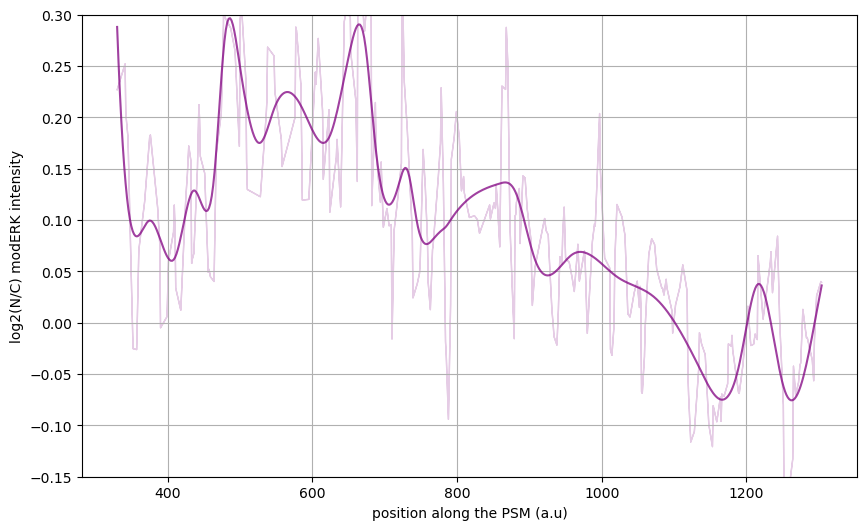

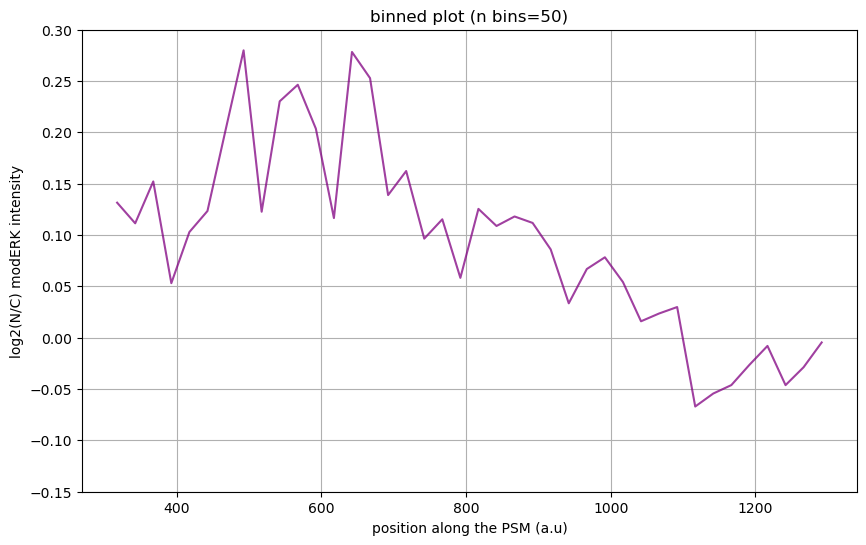

KeyboardInterrupt: 

In [16]:
mod_erk_dir = 'E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/erk/'
masks_dir = 'E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/nuclear_mask/'
tissue_mask_dir = 'E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/tissue/'
loi_dir = 'E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/loi/'
#output_dir = 'E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/'

complete_function(mod_erk_dir, masks_dir, tissue_mask_dir, loi_dir)

Timepoint 1 - Ratios: {1164: -0.062235506366408115, 1148: -0.03297199356768956, 1151: -0.21896205931537976, 1138: 0.026389279995442768, 1181: -0.021351077835704186, 1168: -0.10236830508767242, 1178: 0.06456056881891625, 1158: -0.02330875996569597, 1098: 0.029127148946592494, 1128: -0.11909333131828086, 1105: -0.05095849537739816, 1141: 0.03501059372281323, 1115: 0.05943311809551753, 1155: -0.0711729927984053, 1068: -0.23769883265676855, 1087: -0.358395676624107, 1121: -0.16775433530920747, 1056: -0.09315812256140044, 1131: -0.054210191871360815, 1145: -0.15344600655412752, 1125: -0.10382289574037266, 1123: -0.18391126139104005, 1038: -0.04420944214261606, 1075: 0.10399995507266753, 1044: -0.06291618258296262, 1019: 0.09058570691547553, 1050: -0.010731124500587325, 1025: 0.15053943663850733, 1013: 0.18802936139424029, 1081: -0.06054151702891262, 1062: -0.3249221927321684, 1032: -0.28615626183768034, 997: 0.13134719569561049, 1135: -0.09115792225085419, 978: -0.2129478767867703, 1092: -0

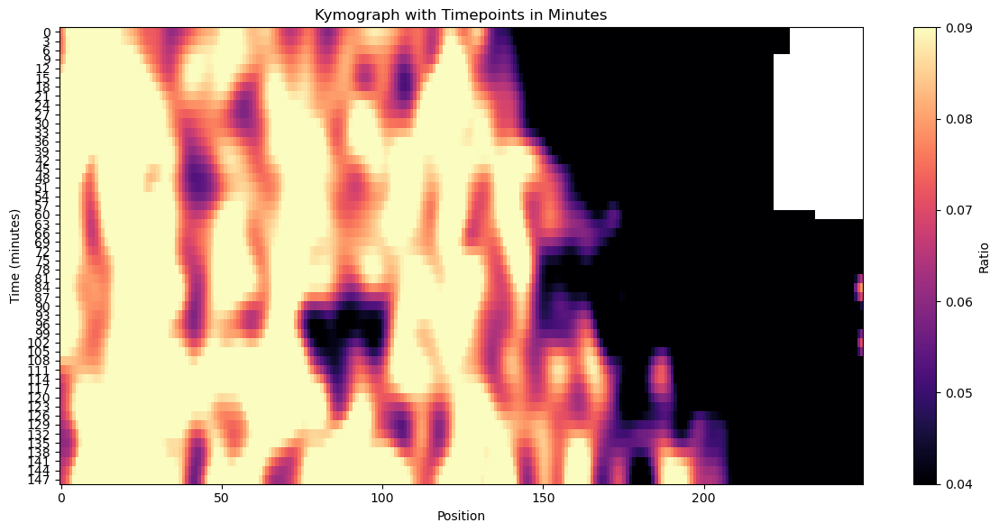

In [23]:
import numpy as np 
import os
import pickle
import matplotlib.pyplot as plt
from scipy.interpolate import UnivariateSpline
from scipy.ndimage import gaussian_filter
from skimage import io

# Helper Functions
def moving_average(data, window_size):
    return np.convolve(data, np.ones(window_size) / window_size, mode='valid')

def save_ratios_to_file_pickle(ratios, filename):
    directory = os.path.dirname(filename)
    if directory and not os.path.exists(directory):
        os.makedirs(directory, exist_ok=True)
    
    with open(filename, 'wb') as f:
        pickle.dump(ratios, f)
    print(f"Saved ratios to {filename}")

def load_ratios_from_pickle(filename):
    with open(filename, 'rb') as f:
        ratios = pickle.load(f)
    return ratios

def create_id_to_pixels(masks): 
    unique_ids = np.unique(masks)
    return {cell_id: np.argwhere(masks == cell_id) for cell_id in unique_ids if cell_id != 0}

def calculate_nuclei_to_loi_distances(filtered_nuclei_mask, loi_points):
    return {}

def map_ratios_to_positions(ratios, nuclei_to_loi_x):
    ratio_positions = {}
    for nucleus_id, ratio in ratios.items():
        if nucleus_id in nuclei_to_loi_x:
            position = nuclei_to_loi_x[nucleus_id]
            ratio_positions[position] = ratio
    return ratio_positions

# Smoothing Function using Gaussian Filter
def apply_gaussian_smoothing(kymograph_data, sigma=1.0):
    return gaussian_filter(kymograph_data, sigma=sigma)

import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
from scipy.interpolate import interp1d


import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter

def plot_kymographs(ratios_list, max_x_width, save_path, vmin=None, vmax=None, sigma_horizontal=1.0, sigma_vertical=1.0, time_interval=3):
    num_timepoints = len(ratios_list)
    kymograph_data = np.full((num_timepoints, max_x_width), np.nan)  # Initialize with NaNs for proper handling

    for i, ratios in enumerate(ratios_list):
        if not ratios:
            print(f"Warning: Timepoint {i+1} has no valid ratios.")
            continue
        
        sorted_positions = np.array(sorted(ratios.keys()))
        sorted_ratios = np.array([ratios[pos] for pos in sorted_positions])

        # Ensure we do not exceed the maximum width
        if len(sorted_ratios) > max_x_width:
            sorted_ratios = sorted_ratios[:max_x_width]
        
        # Place the ratios starting from the leftmost position
        kymograph_data[i, :len(sorted_ratios)] = sorted_ratios

    # Apply Gaussian smoothing
    smoothed_kymograph = gaussian_filter(kymograph_data, sigma=[sigma_vertical, sigma_horizontal])

    # Determine color scale limits
    if vmin is None:
        vmin = np.nanmin(smoothed_kymograph)
    if vmax is None:
        vmax = np.nanmax(smoothed_kymograph)

    # Plotting
    plt.figure(figsize=(12, 6))
    plt.imshow(smoothed_kymograph, aspect='auto', cmap='magma', origin='upper', interpolation='none', vmin=vmin, vmax=vmax)
    plt.colorbar(label='Ratio')
    plt.xlabel('Position')

    # Set y-axis labels to timepoints in minutes
    timepoints = np.arange(num_timepoints) * time_interval
    plt.yticks(ticks=np.arange(num_timepoints), labels=timepoints)
    plt.ylabel('Time (minutes)')

    plt.title('Kymograph with Timepoints in Minutes')
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()


# Function to plot kymograph with water shading effect
def plot_kymograph(ratios_list, max_x_width, save_path, vmin=None, vmax=None, sigma_horizontal=1.0, sigma_vertical=1.0, time_interval=3):
    # Define the number of timepoints (rows)
    num_timepoints = len(ratios_list)
    
    # Initialize a blank canvas for the kymograph (height = num_timepoints, width = max_x_width)
    kymograph_data = np.zeros((num_timepoints, max_x_width))
    
    # Loop through each timepoint
    for i, ratios in enumerate(ratios_list):
        if not ratios:
            print(f"Warning: Timepoint {i+1} has no valid ratios.")
            continue  # Skip timepoints with no valid ratios
        
        # Get sorted positions and corresponding ratio values
        sorted_positions = np.array(sorted(ratios.keys()))
        sorted_ratios = np.array([ratios[pos] for pos in sorted_positions])

        # To ensure the x-axis is within bounds (max_x_width), we trim or pad positions
        if len(sorted_positions) > max_x_width:
            sorted_positions = sorted_positions[:max_x_width]
            sorted_ratios = sorted_ratios[:max_x_width]
        elif len(sorted_positions) < max_x_width:
            # Padding with NaN to make it the same length
            padding = np.full((max_x_width - len(sorted_positions),), np.nan)
            sorted_positions = np.concatenate((sorted_positions, padding))
            sorted_ratios = np.concatenate((sorted_ratios, padding))

        # Normalize the positions if necessary (this may not be needed if you already have normalized data)
        normalized_positions = (sorted_positions - sorted_positions.min()) / (sorted_positions.max() - sorted_positions.min())
        normalized_positions = normalized_positions * (max_x_width - 1)

        # Assign the ratio values to the kymograph data at the appropriate positions
        kymograph_data[i, :len(normalized_positions)] = sorted_ratios
    
    # If min and max values for colormap are not provided, use the data's min and max
    if vmin is None:
        vmin = np.nanmin(kymograph_data)  # Min value of the kymograph data
    if vmax is None:
        vmax = np.nanmax(kymograph_data)  # Max value of the kymograph data

    # Apply horizontal Gaussian smoothing (over positions)
    smoothed_kymograph_horizontal = gaussian_filter(kymograph_data, sigma=sigma_horizontal)

    # Apply vertical Gaussian smoothing (over timepoints)
    smoothed_kymograph = gaussian_filter(smoothed_kymograph_horizontal.T, sigma=sigma_vertical).T

    # Plot the kymograph with the specified colormap and value interval
    plt.figure(figsize=(12, 6))
    plt.imshow(smoothed_kymograph, aspect='auto', cmap='viridis', origin='upper', interpolation='none', vmin=vmin, vmax=vmax)
    plt.colorbar(label='Ratio')
    plt.xlabel('Position')

    # Set y-axis labels to timepoints in minutes
    timepoints = np.arange(num_timepoints) * time_interval
    plt.yticks(ticks=np.arange(num_timepoints), labels=timepoints)
    plt.ylabel('Time (minutes)')

    plt.title('Kymograph with Timepoints in Minutes')
    plt.tight_layout()
    plt.savefig(save_path)
    plt.show()

# Main function that processes data and generates kymograph
def complete_function_with_kymograph(mod_erk_dir, masks_dir, tissue_mask_dir, loi_dir, ratios_dir, output_kymograph_path):
    # Load the pickle files
    ratios_files = [f"{ratios_dir}/ratios_psm_timepoint_{i+1}.pkl" for i in range(50)]  # Example for 4 timepoints
    mod_erk_files = [f"{mod_erk_dir}/erk{str(i+1).zfill(4)}.tif" for i in range(50)]  # Example for 4 timepoints
    masks_files = [f"{masks_dir}/nuclei{str(i+1).zfill(4)}_seg_seg.npy" for i in range(50)]  # Example for 4 timepoints
    tissue_mask_files = [f"{tissue_mask_dir}/tissue{str(i+1).zfill(4)}.tif" for i in range(50)]  # Example for 4 timepoints
    loi_files = [f"{loi_dir}/loi{str(i+1).zfill(4)}.tif" for i in range(50)]  # Example for 4 timepoints

    all_ratios_psm = []

    for i, (mod_erk_file, masks_file, tissue_mask_file, loi_file, ratios_file) in enumerate(zip(mod_erk_files, masks_files, tissue_mask_files, loi_files, ratios_files)):
        # Load image files and pickle data
        mod_erk = io.imread(mod_erk_file)
        masks = np.load(masks_file, allow_pickle=True)
        tissue_mask = io.imread(tissue_mask_file)
        loi = io.imread(loi_file)
        ratios = load_ratios_from_pickle(ratios_file)

        print(f"Timepoint {i+1} - Ratios:", ratios)

        if not ratios:
            print(f"Warning: Timepoint {i+1} has no valid ratios.")
            continue  # Skip this timepoint if no valid ratios

        # Add the ratios for this timepoint to the list
        all_ratios_psm.append(ratios)

    # Now, plot the kymograph using the ratios with water shading effect
    plot_kymographs(all_ratios_psm, max_x_width=250, save_path=output_kymograph_path, vmin=0.04, vmax=0.09, sigma_horizontal=3.0, sigma_vertical=2.0, time_interval=3)
    #plot_kymograph(all_ratios_psm, max_x_width=250, save_path=output_kymograph_path, vmin=0.07, vmax=0.12, sigma_horizontal=2.0, sigma_vertical=2.0,time_interval=3)

# Example usage:
mod_erk_dir = 'E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/erk/'
masks_dir = 'E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/nuclear_mask/'
tissue_mask_dir = 'E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/tissue/'
loi_dir = 'E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/loi/'
ratios_dir = 'E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/ratios_saved/'
output_kymograph_path = 'E:/Agnese/20250328_gullum_modERK_h2a/20250328_141322_Experiment/quantification/kymo_loi_right.svg'

complete_function_with_kymograph(mod_erk_dir, masks_dir, tissue_mask_dir, loi_dir, ratios_dir, output_kymograph_path)